# Projeto MTR

0. Pegar o dataset de heart disease (e possivelmente de airbnb)
1. Manipular os dados para deixá-los prontos para treinamento por modelos de ML 
2. Pesquisar e escolher os modelos para serem testados (de preferência modelos que sabemos ter erros correlacionados)
3. Treinar modelos (tentar achar os melhores hiperparâmetros, usar validação cruzada de 5 ou 10 folds)
4. Construir assessores (treinados para tentar prever o erro dos modelos) (também tentar achar melhores hiperparâmetros):

    4.1. Um assessor para cada modelo (RandomForestRegressor ou algum outro)
    
    4.2. Um assessor multi-target para todos os modelos (RegressorChains (outputs relacionados) **e** Single Target Method (outputs independentes))
    
    4.3. Um assessor para cada "família" ou grupo de modelos de ML com erros correlacionados (RegressorChains)

5. Coletar resultados e tirar conclusões para apresentar

## Imports e funções

In [1]:
from utils import *
from MSVR import MSVR
from experiment_setup import ExpSetup, GroupedAssessor, OptunaStudy

/home/pbsl/pog/proj-mtr/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Dataset

In [2]:
DIR = 'covid'

seed = 3380435598#randint(0, 4294967295)
print(seed)

3380435598


In [3]:
setup = ExpSetup(DIR, seed, 0)

Xa_train, Xa_train_norm, Xa_test, Xa_test_norm, ya_train, ya_test, pred_corrls, pred_corrls2, performs = setup.assessorData()

Nº de instâncias: 660
[REGISTERED: DTREE]
[Training]

Accuracy:         0.7778
Recall:           0.8545
Precision:        0.7344
F1:               0.7899
AUROC:            0.8626
AUPR:             0.8420
1-maxProb média:  0.2222
1-maxProb dp:     0.1586

[Testing]

Accuracy:         0.6327
Recall:           0.7345
Precision:        0.6103
F1:               0.6667
AUROC:            0.6758
AUPR:             0.6548
1-maxProb média:  0.2291
1-maxProb dp:     0.1495

[REGISTERED: SGD]
[Training]

Accuracy:         0.7378
Recall:           0.6909
Precision:        0.7525
F1:               0.7204
AUROC:            0.8069
AUPR:             0.8066
1-maxProb média:  0.2900
1-maxProb dp:     0.1336

[Testing]

Accuracy:         0.6593
Recall:           0.5841
Precision:        0.6875
F1:               0.6316
AUROC:            0.7276
AUPR:             0.7152
1-maxProb média:  0.2888
1-maxProb dp:     0.1263

[REGISTERED: LR]
[Training]

Accuracy:         0.7378
Recall:           0.6909
Precision: 

In [7]:
#df = pd.read_csv(f'data/{DIR}/bug dataset.csv', header=0)
#print(df.dtypes)
#
#from sklearn.preprocessing import StandardScaler
#
#X = df.drop(columns=['class'])
#y = df['class']
#
#scaler = StandardScaler()
#X_norm = scaler.fit_transform(X, y)

In [8]:
#Xa_train = setup.Xa_train
#Xa_train_norm = setup.Xb_test_norm
#Xa_test = setup.Xa_test
#Xa_test_norm = setup.Xa_test_norm
#ya_train = setup.ya_train
#ya_test = setup.ya_test
#pred_corrls = setup.pred_corrls
#pred_corrls2 = setup.pred_corrls2
#performs = setup.performs

# Assessors

#### Análise de correlações

Conjunto de Treinamento:

O conjunto de teste dos modelos base já é o conjunto de treinamento dos assessores.

In [4]:
groups = {}
model_names = list(performs.keys())

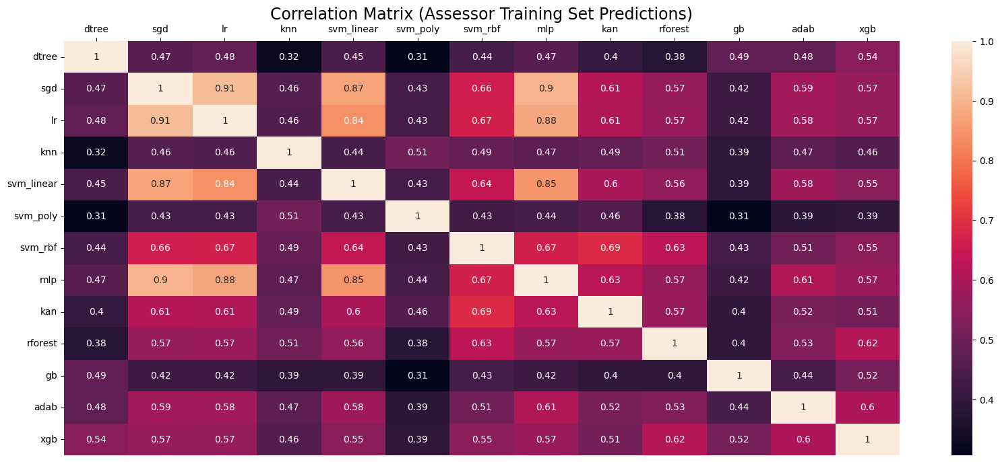

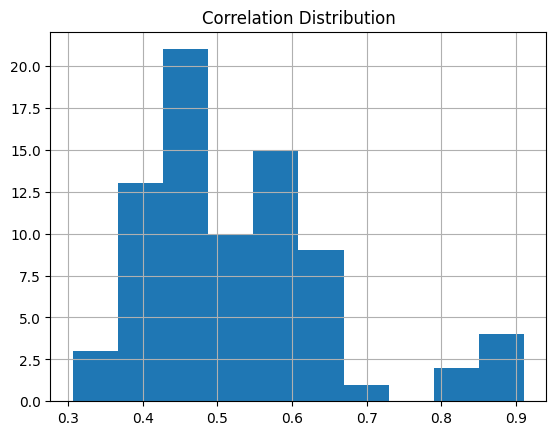

Training correlation distribution:
count    78.000000
mean      0.528485
std       0.133383
min       0.306480
25%       0.434777
50%       0.507222
75%       0.587927
max       0.910875
Name: corr, dtype: float64
[Saved image "cm_atrain.eps"]
[Saved image "cd_atrain.eps"]


In [5]:
correlation_matrix(pred_corrls, True, DIR, 'Assessor', 'Training')

In [6]:
MIN_SCORE = 0.645 #corrls_values['corr'].quantile(0.75)

print('Min_score:', MIN_SCORE)

groups['true_assessor_train'] = group_search(pred_corrls, MIN_SCORE)
groups['true_assessor_train']

Min_score: 0.645


[['dtree'],
 ['svm_rbf', 'mlp', 'sgd', 'lr'],
 ['svm_rbf', 'kan'],
 ['knn'],
 ['adab'],
 ['xgb'],
 ['gb'],
 ['svm_linear', 'sgd', 'mlp', 'lr'],
 ['rforest'],
 ['svm_poly']]

Conjunto de Teste:

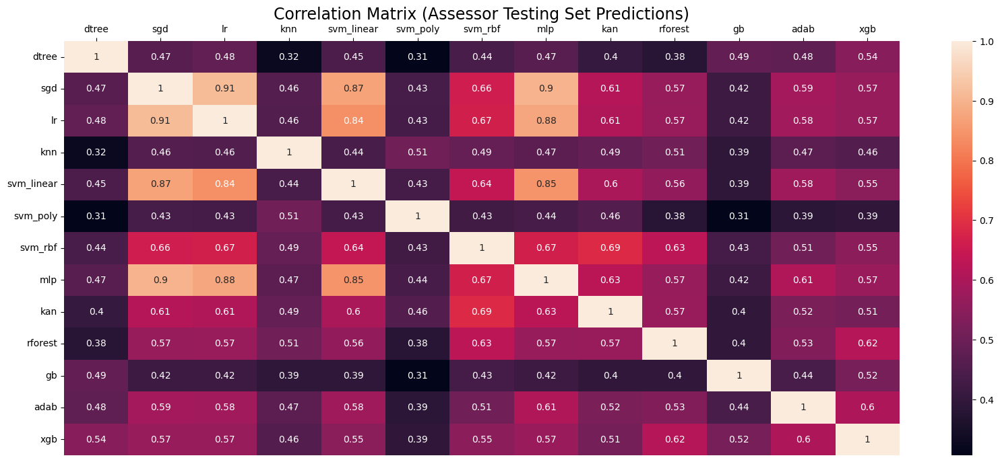

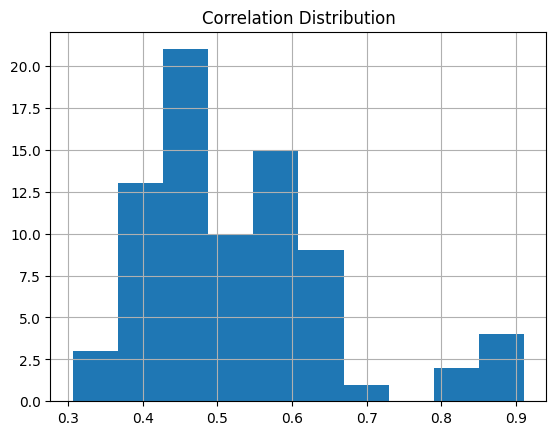

Testing correlation distribution:
count    78.000000
mean      0.528485
std       0.133383
min       0.306480
25%       0.434777
50%       0.507222
75%       0.587927
max       0.910875
Name: corr, dtype: float64
[Saved image "cm_atest.eps"]
[Saved image "cd_atest.eps"]


In [7]:
correlation_matrix(pred_corrls, True, DIR, 'Assessor', 'Testing')

In [8]:
groups['true_assessor_test'] = group_search(pred_corrls2, MIN_SCORE)
groups['true_assessor_test']

[['dtree'],
 ['svm_linear', 'sgd', 'mlp', 'lr'],
 ['sgd', 'mlp', 'kan', 'svm_rbf'],
 ['sgd', 'mlp', 'lr', 'svm_rbf'],
 ['knn'],
 ['adab'],
 ['xgb'],
 ['gb'],
 ['rforest'],
 ['svm_poly']]

Diferença entre correlações do conjnuto de teste e de treinamento:
MSE:  0.0022
NMSE: 0.0866
MAE:  0.0368
NMAE: 0.3600
aRRMSE: 0.2845
aCC:  0.9803


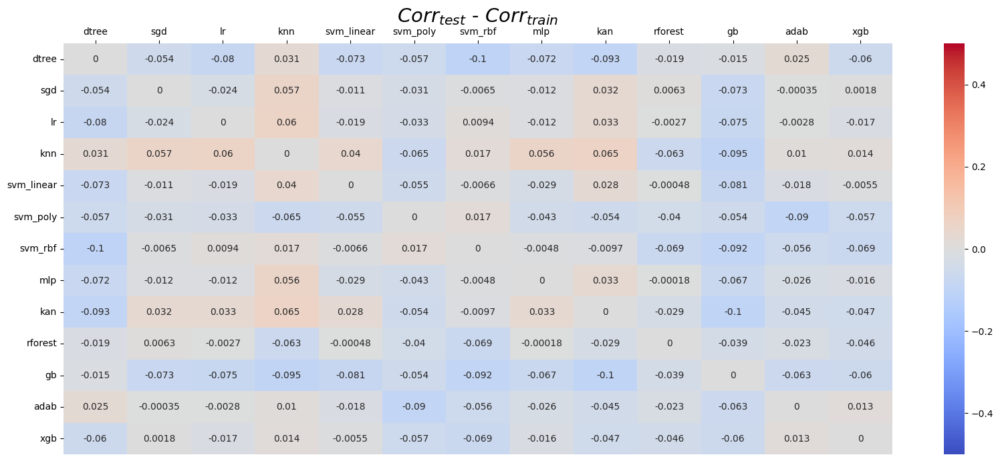

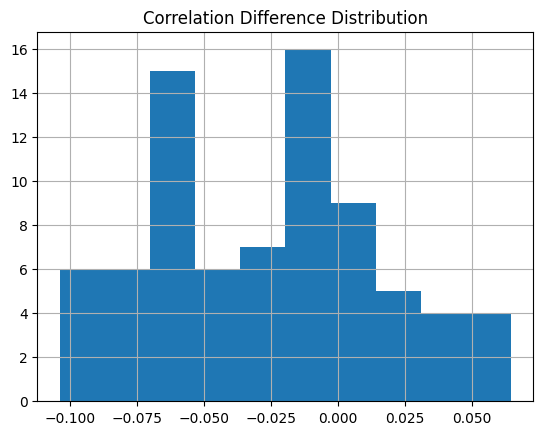

[Saved image "cmd_base.eps"]
[Saved image "cdd_base.eps"]


In [9]:
diff_corrls = pred_corrls2-pred_corrls
diff_corrls_values = corrlArray(diff_corrls)['corr']

print(f'''Diferença entre correlações do conjnuto de teste e de treinamento:
MSE:  {mse(pred_corrls, pred_corrls2):.4f}
NMSE: {nmse(pred_corrls, pred_corrls2):.4f}
MAE:  {mae(pred_corrls, pred_corrls2):.4f}
NMAE: {nmae(pred_corrls, pred_corrls2):.4f}
aRRMSE: {rrmse(pred_corrls, pred_corrls2):.4f}
aCC:  {corrCoeff(pred_corrls, pred_corrls2):.4f}''')

plt.figure(figsize=(20,8))
plt.title(r'$Corr_{test}$ - $Corr_{train}$', fontsize=21)
hm = sns.heatmap(diff_corrls, annot=True, cmap='coolwarm', vmin=-0.5, vmax=0.5)
hm.xaxis.tick_top()
plt.show(hm)

plt.title('Correlation Difference Distribution')
hg = diff_corrls_values.hist()
plt.show(hg)

save2figs(hm, hg, DIR)

## Globais

In [10]:
parameters = {'max_depth':[None,10,20,30],
                    'criterion':['squared_error', 'poisson', 'friedman_mse'],
                    'min_samples_split':[2,5,10,20,40,60],
                    'min_samples_leaf':[1,2,10,30],
                    'n_estimators':[20,50,100,150]}

In [11]:
# Criando o MultiIndex
multi_index = multIdx('ST','MRT','MRT(g)','M-SVR','M-SVR(g)','RC','RC(g)', subindex=model_names)

metrics_cols = ['MSE', 'MAE', 'NMSE', 'NMAE', 'aRRMSE', 'aCC']
metrics_df = pd.DataFrame(columns=metrics_cols, index=multi_index)
diff_metrics = pd.DataFrame(columns=metrics_cols, index=['ST','MRT','MRT(g)','M-SVR','M-SVR(g)','RC','RC(g)'])

### Regressor Chain
(RC)

In [12]:
#study = OptunaStudy(Xa_train, ya_train, 30, seed)
#
#study.search(RegressorChain, cv=5)
#
#rc_params = study.best_params
#regchain = RegressorChain(RandomForestRegressor(random_state=seed).set_params(**rc_params),
#                          random_state=seed, cv=5, verbose=True).fit(Xa_train, ya_train)

In [13]:
regchain = RegressorChain(RandomForestRegressor(random_state=seed), random_state=seed, cv=5,
                          verbose=True, order='random').fit(Xa_train, ya_train)

[Chain] ................. (1 of 13) Processing order 10, total=   0.2s
[Chain] .................. (2 of 13) Processing order 1, total=   0.2s
[Chain] .................. (3 of 13) Processing order 5, total=   0.2s
[Chain] .................. (4 of 13) Processing order 3, total=   0.1s
[Chain] .................. (5 of 13) Processing order 2, total=   0.2s
[Chain] .................. (6 of 13) Processing order 4, total=   0.2s
[Chain] .................. (7 of 13) Processing order 8, total=   0.2s
[Chain] ................. (8 of 13) Processing order 12, total=   0.2s
[Chain] .................. (9 of 13) Processing order 9, total=   0.2s
[Chain] ................. (10 of 13) Processing order 0, total=   0.2s
[Chain] ................. (11 of 13) Processing order 6, total=   0.2s
[Chain] ................ (12 of 13) Processing order 11, total=   0.2s
[Chain] ................. (13 of 13) Processing order 7, total=   0.2s


In [14]:
metrics_df.loc['RC',:] = assr_performance(regchain, Xa_test, ya_test, Xa_train, ya_train)

metrics_df.loc['RC',:]

[TRAINING SET]
MSE: 0.0160
NMSE: 0.3934
MAE: 0.0949
NMAE: 0.5856
aRRMSE: 0.6160
aCC: 0.8413

[TESTING SET]
MSE: 0.0321
NMSE: 0.8355
MAE: 0.1407
NMAE: 0.8895
aRRMSE: 0.9132
aCC: 0.4131


,MSE,MAE,NMSE,NMAE,aRRMSE,aCC
Model,,,,,,
dtree,0.068266,0.868108,0.220546,0.923366,0.931723,0.392941
sgd,0.035838,0.793081,0.155396,0.862966,0.890551,0.458741
lr,0.009638,0.719519,0.077946,0.821611,0.848244,0.54122
knn,0.030399,0.819524,0.144265,0.878108,0.905276,0.433599
svm_linear,0.026053,0.801723,0.129925,0.863834,0.89539,0.445989
svm_poly,0.026994,0.862368,0.126116,0.909606,0.928637,0.380041
svm_rbf,0.005943,0.830349,0.064841,0.883775,0.911235,0.436287
mlp,0.03729,0.765602,0.162091,0.858155,0.874987,0.494302
kan,0.042313,0.894707,0.166716,0.913171,0.94589,0.326877


#### Análise das correlações

Melhorar esse cálculo de correlação para fazer melhor uso do 1-(probabilidade da classe correta)

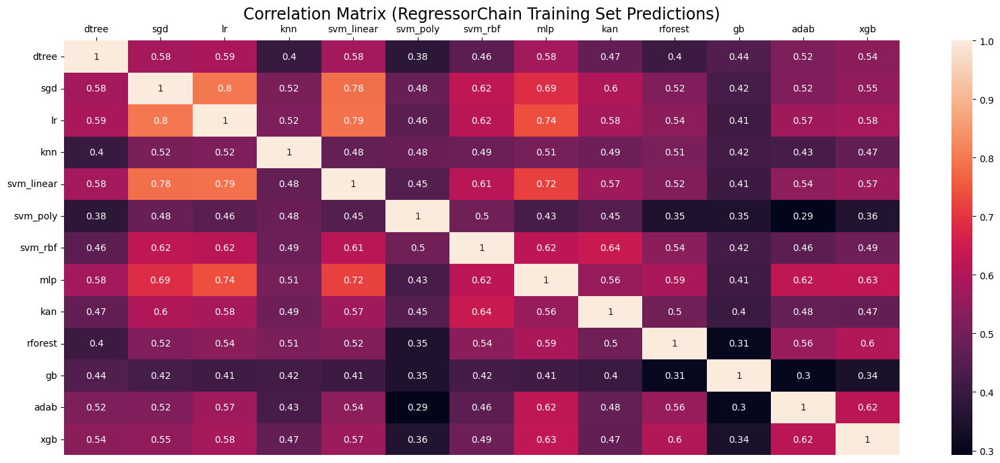

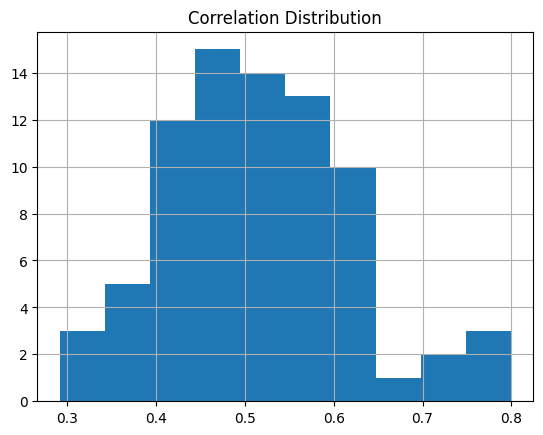

Training correlation distribution:
count    78.000000
mean      0.515808
std       0.109560
min       0.291957
25%       0.445113
50%       0.514240
75%       0.583343
max       0.799331
Name: corr, dtype: float64


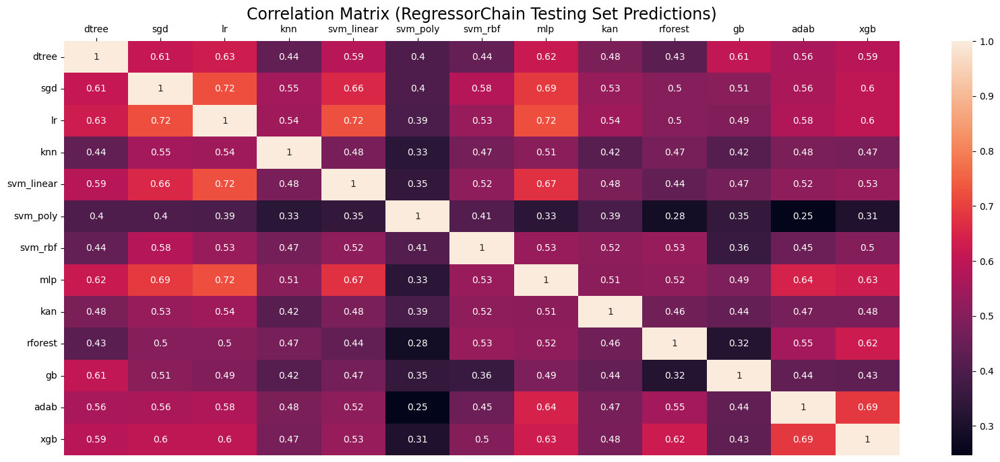

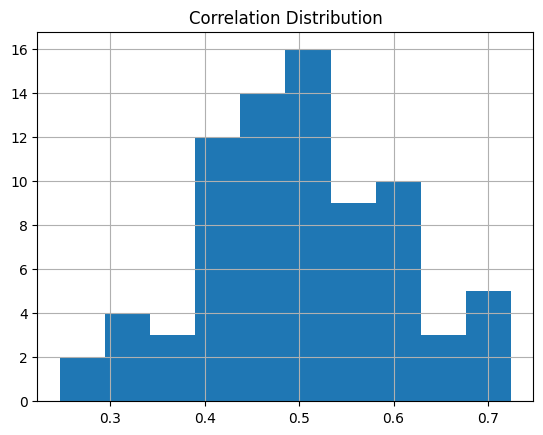

Testing correlation distribution:
count    78.000000
mean      0.503358
std       0.105248
min       0.246524
25%       0.436638
50%       0.501295
75%       0.572535
max       0.724346
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0100
NMSE: 0.0772
MAE: 0.2975
NMAE: 0.6070
aRRMSE: 0.5222
aCC: 0.8874


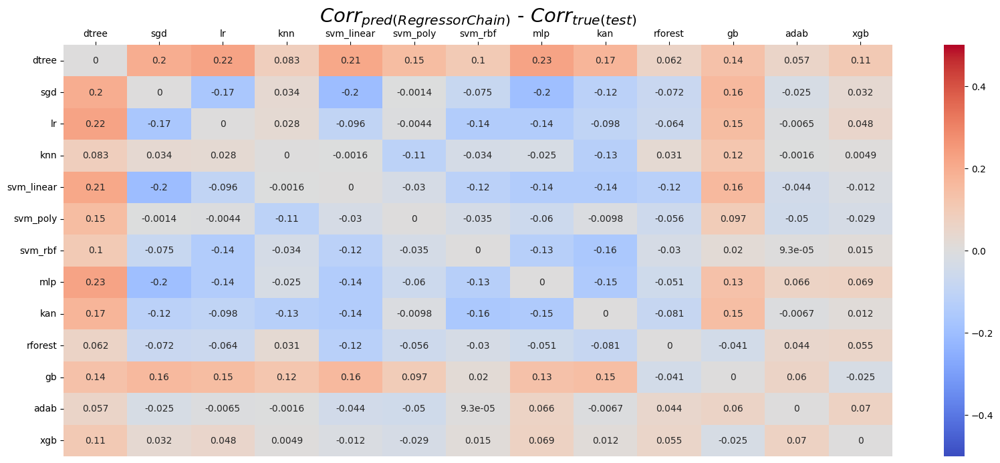

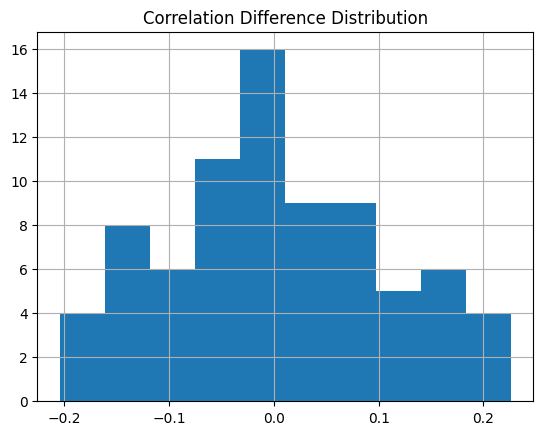

In [15]:
#regchain_corrls = pd.DataFrame(regchain.predict(Xa_train), 
#                               index=Xa_train.index,
#                               columns=model_names).corr('kendall') 

results = correlation_pred_performance(regchain, Xa_test, ya_test, Xa_train, 
                                       min_score=MIN_SCORE, name="RegressorChain",
                                       show_plot=True, save_plot=None)

In [16]:
diff_metrics.loc['RC',:] = results['results']
diff_metrics.loc['RC',:]

MSE       0.010034
MAE       0.077194
NMSE      0.297521
NMAE       0.60696
aRRMSE    0.522221
aCC       0.887375
Name: RC, dtype: object

In [17]:
groups['regchain_assessor'] = results['groups']
groups['regchain_assessor']['test']

[['dtree'],
 ['svm_rbf'],
 ['svm_linear', 'sgd', 'mlp', 'lr'],
 ['knn'],
 ['adab', 'xgb'],
 ['gb'],
 ['rforest'],
 ['svm_poly'],
 ['kan']]

### Ensemble of Regressor Chains

In [49]:
num_chains = 50
rc_ac = f'RC[{num_chains}]'

rc_ests = [RegressorChain(base_estimator=RandomForestRegressor(random_state=seed),
                          random_state=seed+i,
                          order='random', cv=5) for i in range(num_chains)]

rc_plus = GroupedAssessor(rc_ests).fit(Xa_train, ya_train)

In [50]:
# keeping the concat because multiple numbers of chains could be recorded
if(rc_ac in metrics_df.index):
    metrics_df.loc[rc_ac,:] = assr_performance(regchain, Xa_test, ya_test, Xa_train, ya_train)
else:
    new_df = pd.DataFrame(assr_performance(rc_plus, Xa_test, ya_test, Xa_train, ya_train), 
                          columns=metrics_cols,
                          index=multIdx(rc_ac, subindex=model_names))

    metrics_df = pd.concat([metrics_df, new_df])
metrics_df.loc[rc_ac,:]

[TRAINING SET]
MSE: 0.0150
NMSE: 0.3551
MAE: 0.0932
NMAE: 0.5663
aRRMSE: 0.5945
aCC: 0.9035

[TESTING SET]
MSE: 0.0314
NMSE: 0.8168
MAE: 0.1391
NMAE: 0.8790
aRRMSE: 0.9030
aCC: 0.4383


,MSE,MAE,NMSE,NMAE,aRRMSE,aCC
Model,,,,,,
dtree,0.067745,0.861484,0.21916,0.91756,0.928161,0.39767
sgd,0.034127,0.755222,0.150721,0.836999,0.869035,0.504765
lr,0.009559,0.713617,0.077162,0.813349,0.844759,0.556449
knn,0.029533,0.796183,0.142034,0.864523,0.892291,0.460952
svm_linear,0.025586,0.787324,0.129138,0.858603,0.887313,0.463625
svm_poly,0.02627,0.839245,0.125013,0.901654,0.916103,0.416044
svm_rbf,0.00581,0.811739,0.06403,0.872715,0.900966,0.459505
mlp,0.037459,0.769062,0.160493,0.8497,0.876962,0.492818
kan,0.041219,0.871584,0.165058,0.904087,0.933586,0.358974


#### Análise das correlações

Melhorar esse cálculo de correlação para fazer melhor uso do 1-(probabilidade da classe correta)

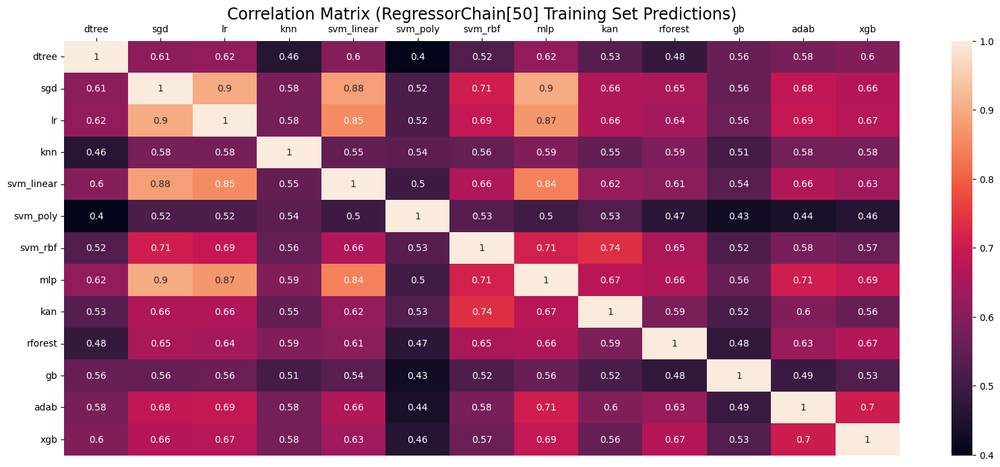

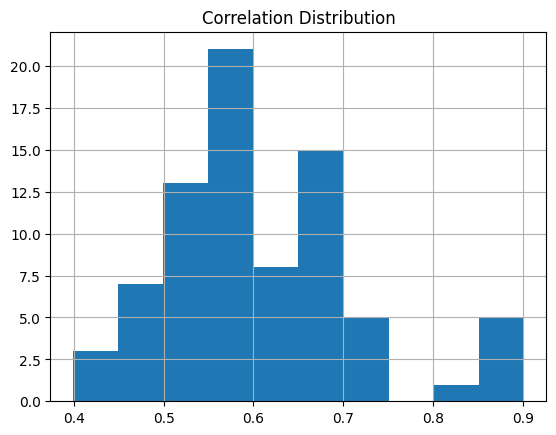

Training correlation distribution:
count    78.000000
mean      0.606577
std       0.107947
min       0.399017
25%       0.532802
50%       0.590678
75%       0.663343
max       0.901278
Name: corr, dtype: float64


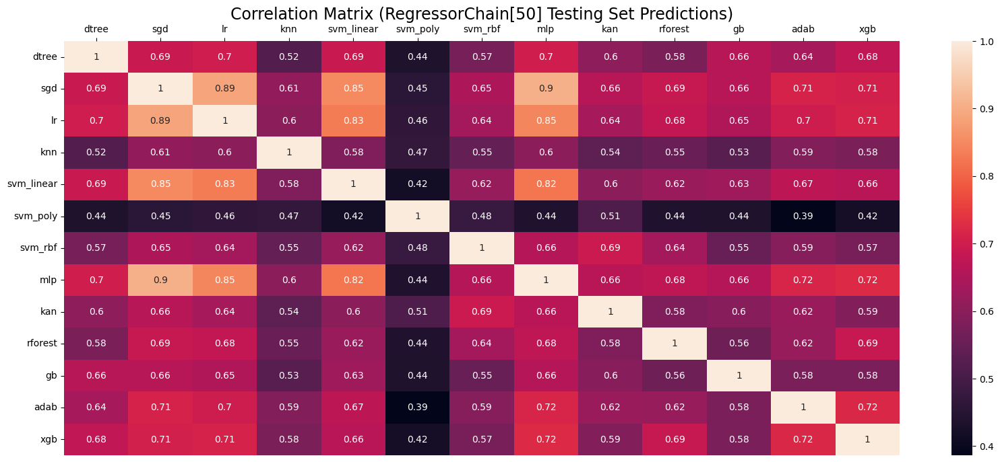

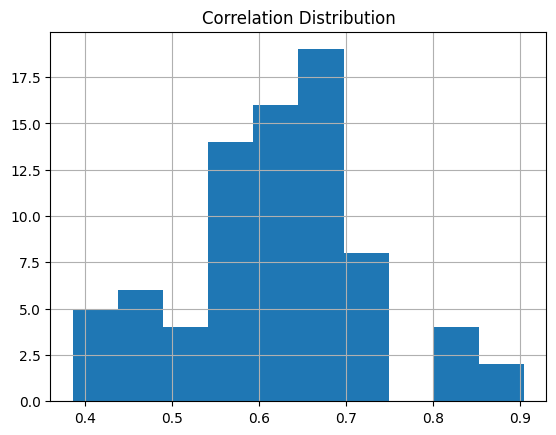

Testing correlation distribution:
count    78.000000
mean      0.620784
std       0.108453
min       0.386307
25%       0.572694
50%       0.623103
75%       0.685646
max       0.904203
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0216
NMSE: 0.1122
MAE: 0.6842
NMAE: 0.9593
aRRMSE: 0.7935
aCC: 0.8997


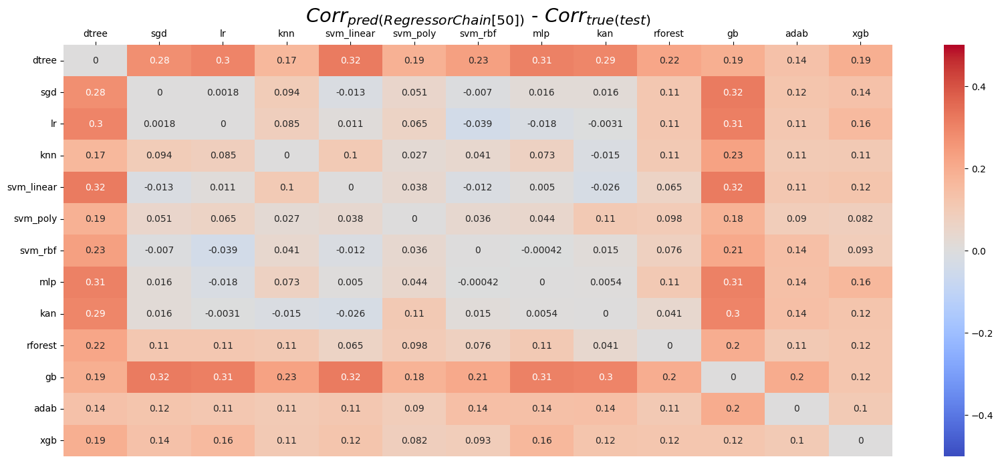

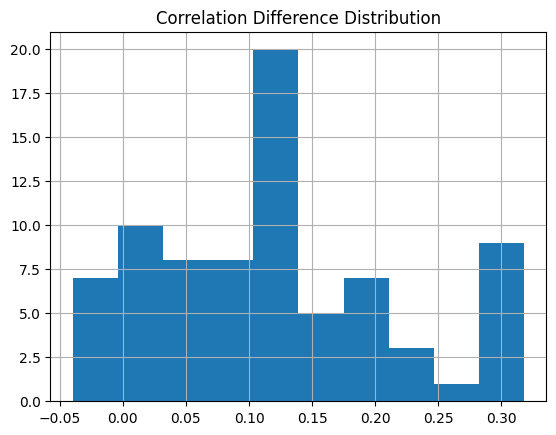

In [51]:
#regchain_corrls = pd.DataFrame(regchain.predict(Xa_train), 
#                               index=Xa_train.index,
#                               columns=model_names).corr('kendall') 

results = correlation_pred_performance(rc_plus, Xa_test, ya_test, Xa_train, 
                                       min_score=MIN_SCORE, name=f"RegressorChain[{num_chains}]",
                                       show_plot=True, save_plot=None)

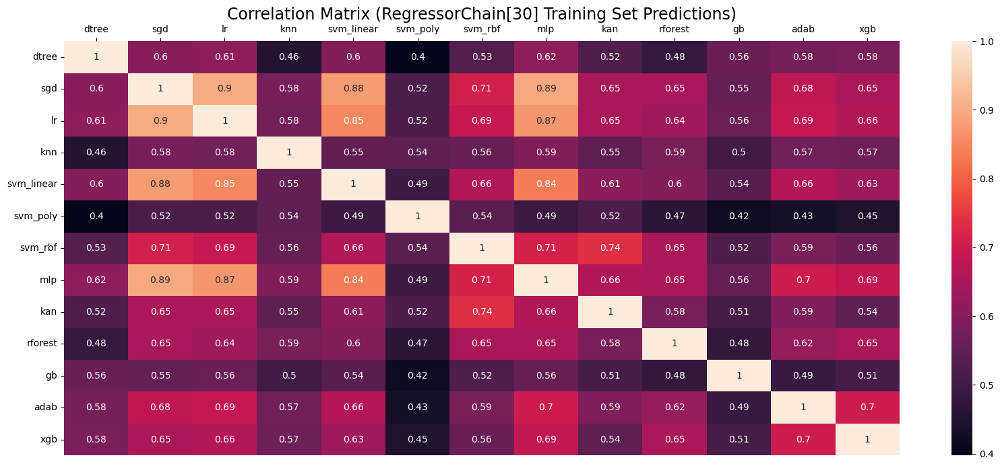

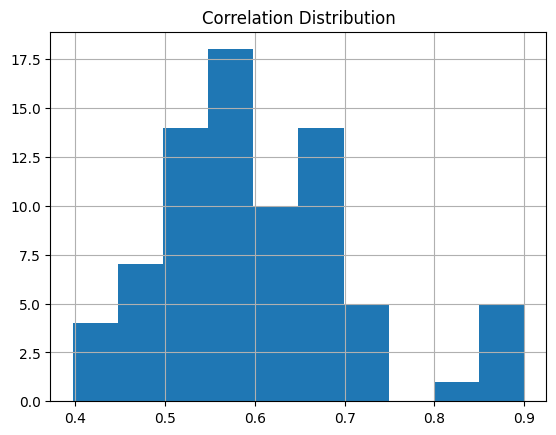

Training correlation distribution:
count    78.000000
mean      0.602921
std       0.108219
min       0.397365
25%       0.532016
50%       0.585251
75%       0.653628
max       0.899705
Name: corr, dtype: float64


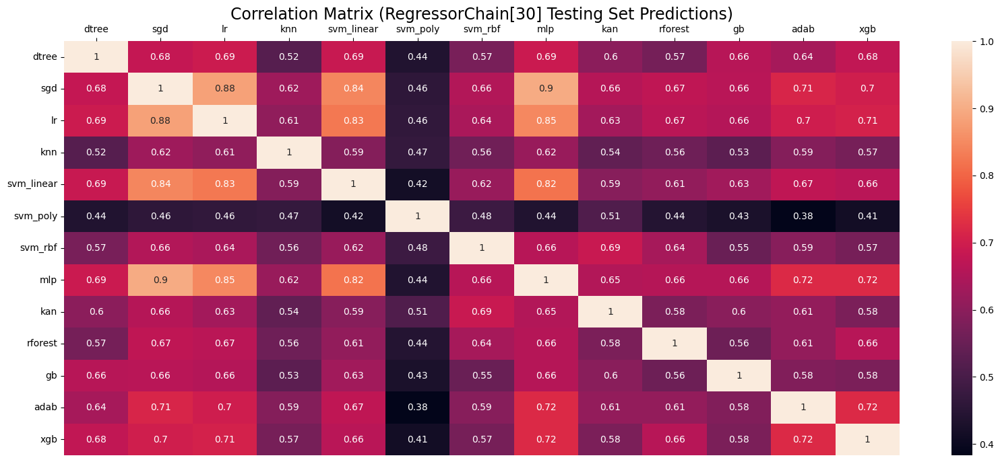

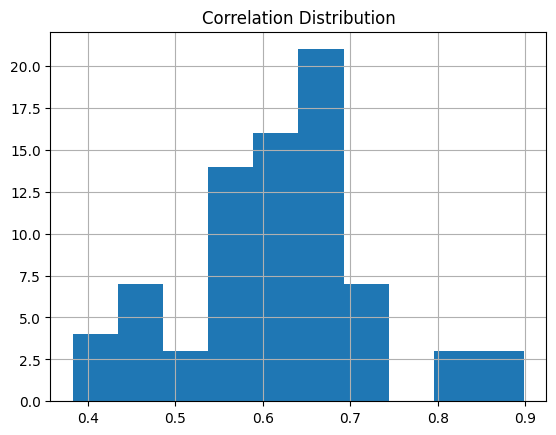

Testing correlation distribution:
count    78.000000
mean      0.618981
std       0.107119
min       0.383241
25%       0.568702
50%       0.621623
75%       0.673672
max       0.898599
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0212
NMSE: 0.1109
MAE: 0.6704
NMAE: 0.9477
aRRMSE: 0.7853
aCC: 0.9008


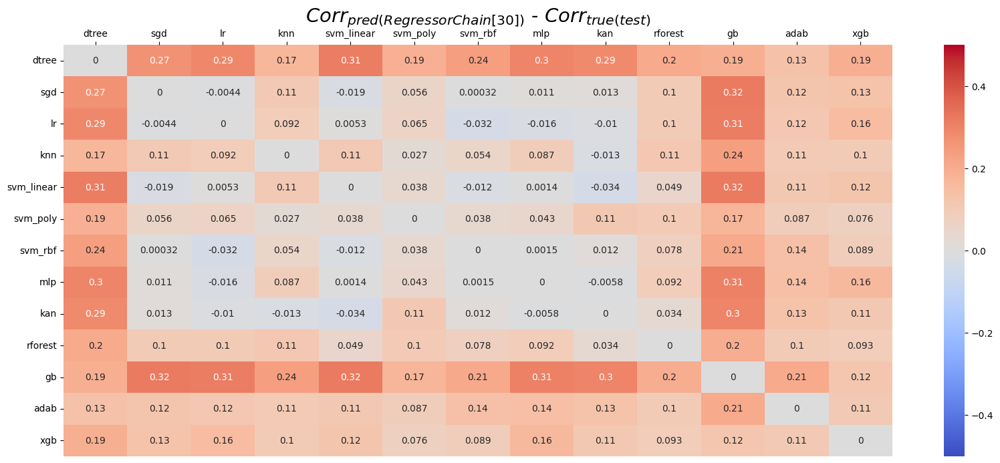

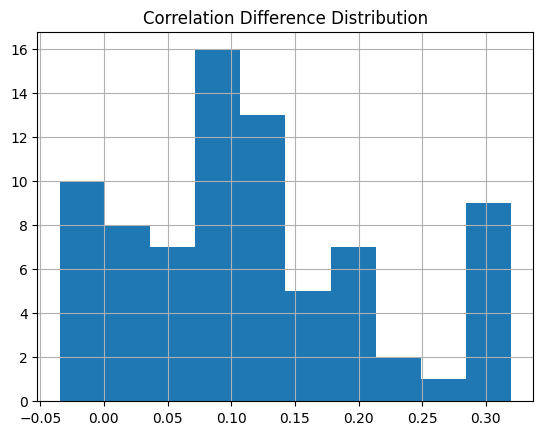

In [ ]:
#regchain_corrls = pd.DataFrame(regchain.predict(Xa_train), 
#                               index=Xa_train.index,
#                               columns=model_names).corr('kendall') 
#30chains
results = correlation_pred_performance(rc_plus, Xa_test, ya_test, Xa_train, 
                                       min_score=MIN_SCORE, name=f"RegressorChain[{num_chains}]",
                                       show_plot=True, save_plot=None)

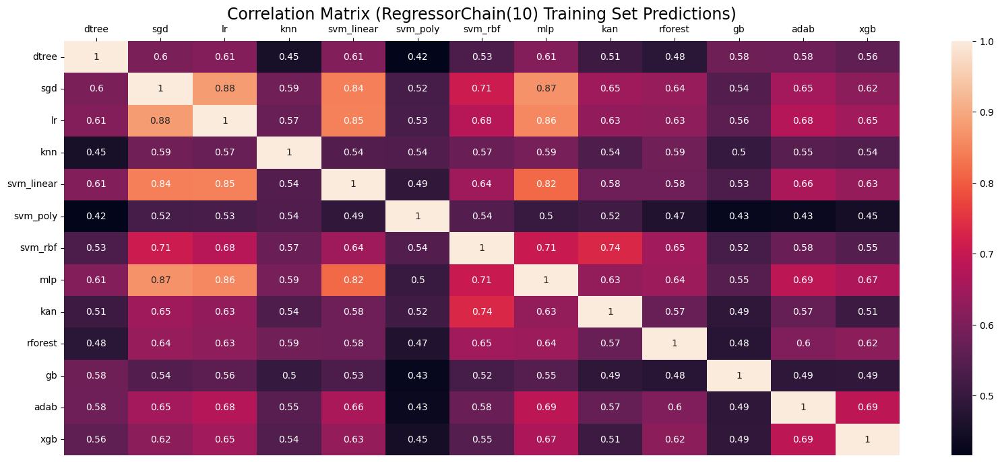

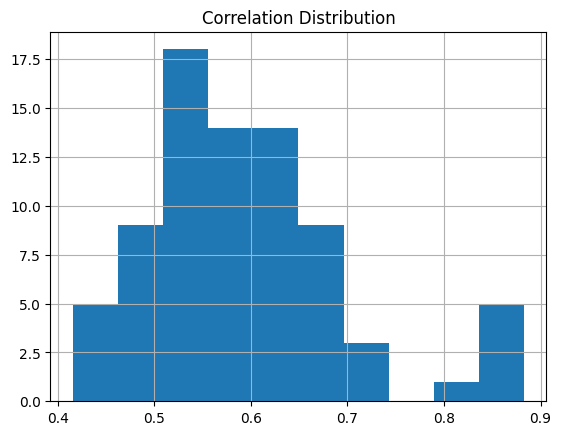

Training correlation distribution:
count    78.000000
mean      0.594346
std       0.103044
min       0.415929
25%       0.530226
50%       0.579941
75%       0.644464
max       0.882714
Name: corr, dtype: float64


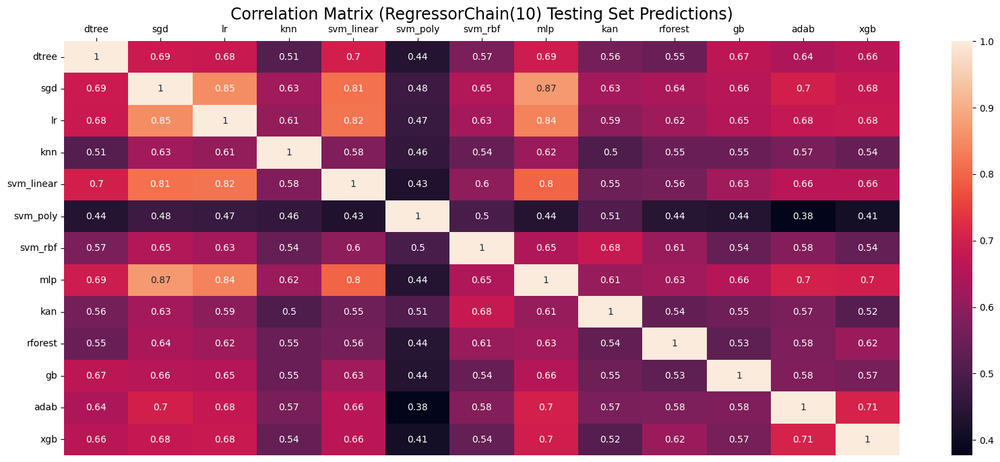

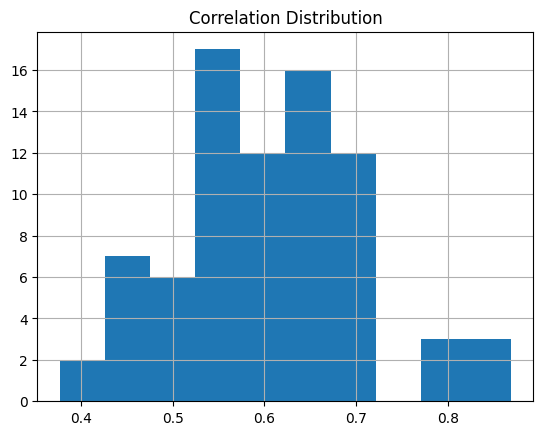

Testing correlation distribution:
count    78.000000
mean      0.603950
std       0.103206
min       0.377108
25%       0.541819
50%       0.609358
75%       0.662146
max       0.868781
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0192
NMSE: 0.1050
MAE: 0.6005
NMAE: 0.8875
aRRMSE: 0.7388
aCC: 0.8899


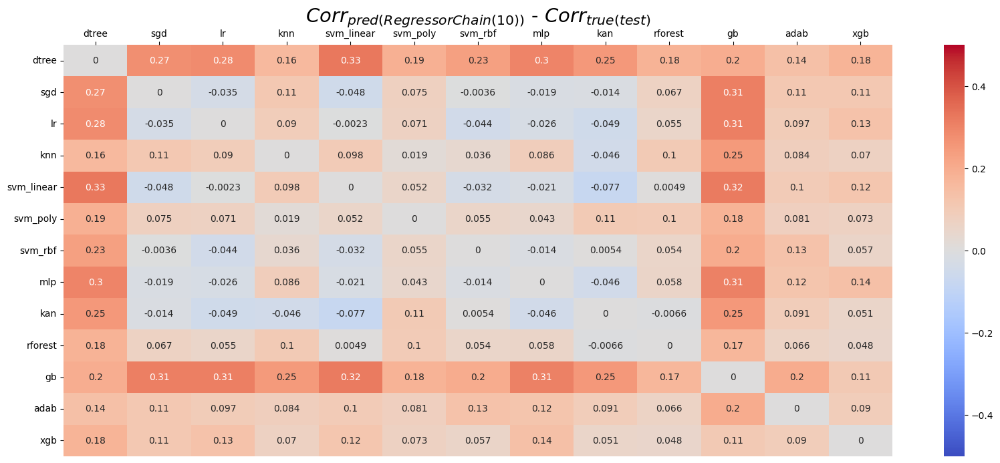

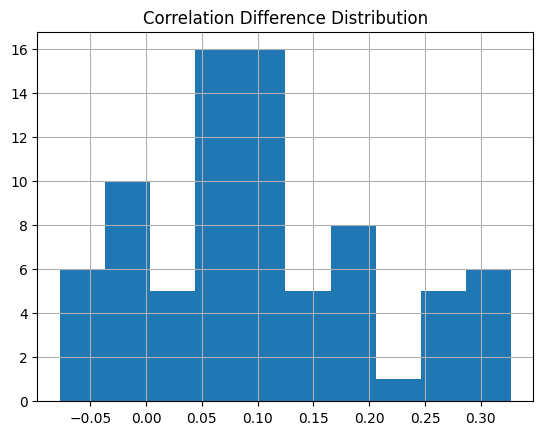

In [ ]:
#regchain_corrls = pd.DataFrame(regchain.predict(Xa_train), 
#                               index=Xa_train.index,
#                               columns=model_names).corr('kendall') 
#10 chains
results = correlation_pred_performance(rc_plus, Xa_test, ya_test, Xa_train, 
                                       min_score=MIN_SCORE, name=f"RegressorChain({num_chains})",
                                       show_plot=True, save_plot=None)

In [52]:
diff_metrics.loc[rc_ac,:] = results['results']
diff_metrics.loc[rc_ac,:]

MSE       0.021563
MAE       0.112215
NMSE      0.684156
NMAE      0.959318
aRRMSE    0.793462
aCC       0.899688
Name: RC[50], dtype: object

In [53]:
groups[f'regchain{num_chains}_assessor'] = results['groups']
groups[f'regchain{num_chains}_assessor']['test']

[['sgd', 'mlp', 'kan', 'svm_rbf'],
 ['dtree', 'mlp', 'lr', 'sgd', 'xgb', 'svm_linear'],
 ['mlp', 'lr', 'sgd', 'adab', 'xgb', 'svm_linear'],
 ['mlp', 'lr', 'sgd', 'xgb', 'rforest'],
 ['dtree', 'mlp', 'lr', 'sgd', 'gb'],
 ['knn'],
 ['svm_poly']]

### Multi-Output Random Forest Regressor 

In [23]:
mrf = RandomForestRegressor(random_state=seed).fit(Xa_train, ya_train)

In [24]:
metrics_df.loc['MRT',:] = assr_performance(mrf, Xa_test, ya_test, Xa_train, ya_train)

[TRAINING SET]
MSE: 0.0062
NMSE: 0.1261
MAE: 0.0583
NMAE: 0.3385
aRRMSE: 0.3550
aCC: 0.9803

[TESTING SET]
MSE: 0.0387
NMSE: 0.8257
MAE: 0.1481
NMAE: 0.8830
aRRMSE: 0.9077
aCC: 0.4294


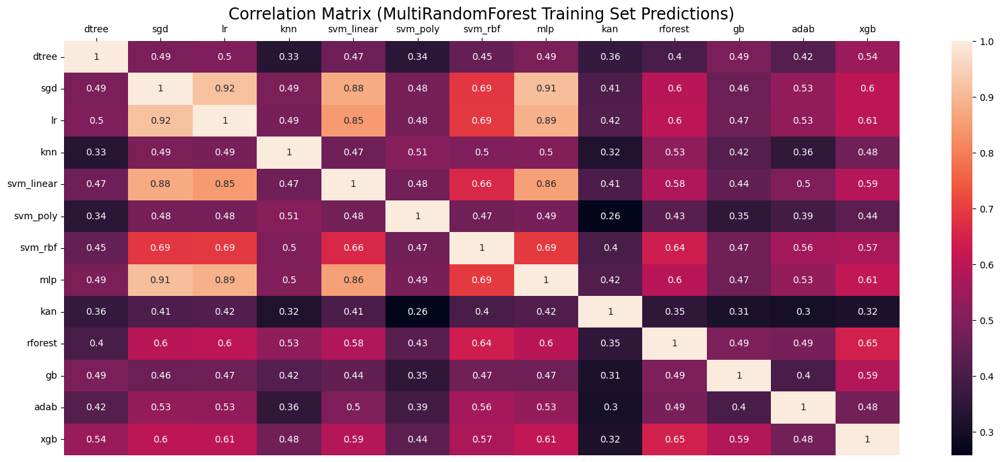

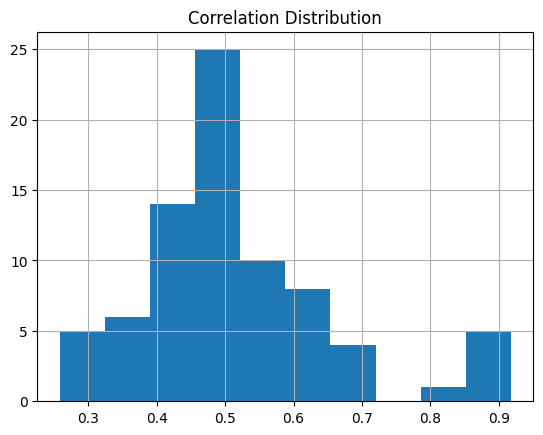

Training correlation distribution:
count    78.000000
mean      0.513167
std       0.143692
min       0.258368
25%       0.421716
50%       0.485992
75%       0.583677
max       0.917483
Name: corr, dtype: float64


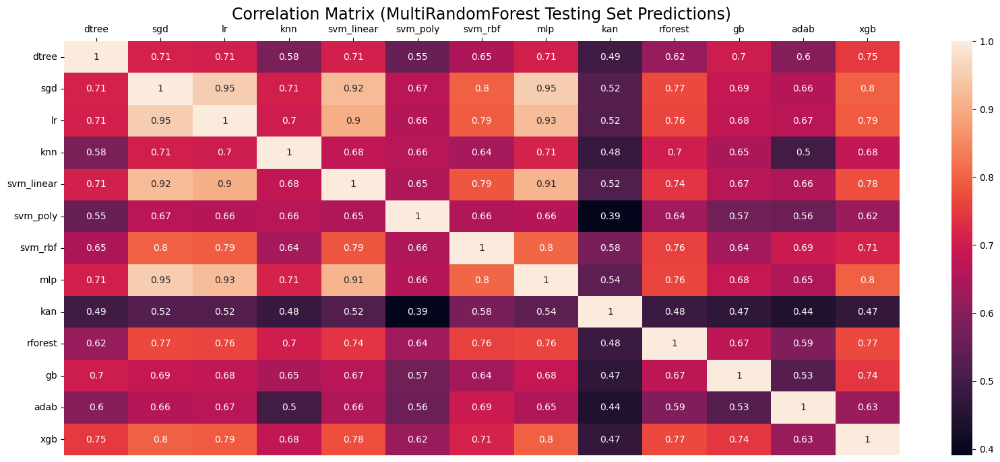

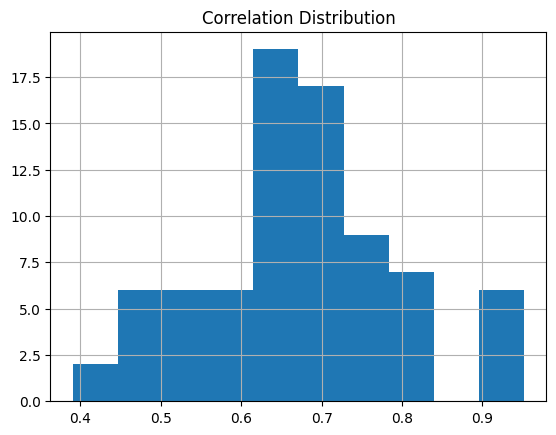

Testing correlation distribution:
count    78.000000
mean      0.673855
std       0.120333
min       0.390854
25%       0.602591
50%       0.672112
75%       0.748374
max       0.951573
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0426
NMSE: 0.1850
MAE: 1.3085
NMAE: 1.5559
aRRMSE: 1.1178
aCC: 0.9269


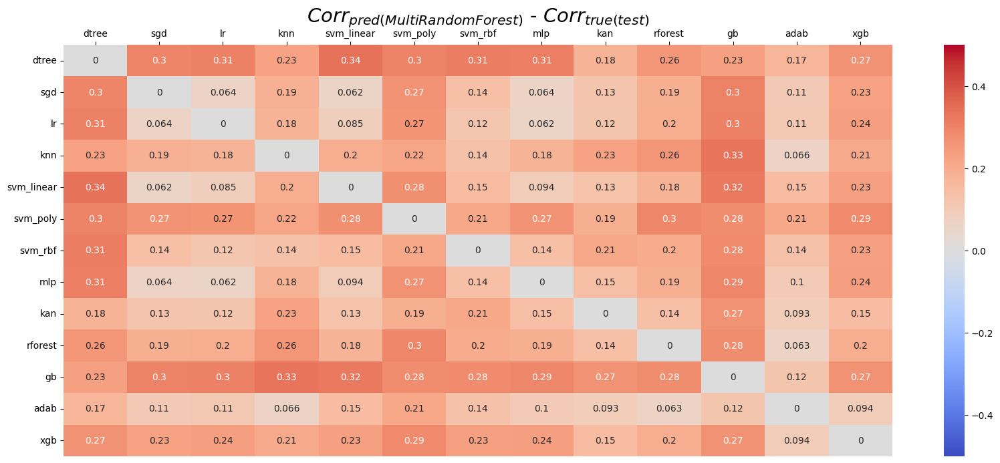

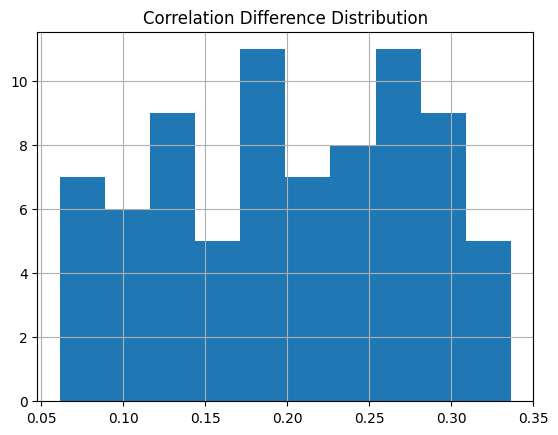

In [25]:
results = correlation_pred_performance(mrf, Xa_test, ya_test, Xa_train, 
                                       MIN_SCORE, name="MultiRandomForest")

In [26]:
diff_metrics.loc['MRT',:] = results['results']
diff_metrics.loc['MRT',:]

MSE       0.042634
MAE       0.185016
NMSE      1.308456
NMAE      1.555901
aRRMSE    1.117812
aCC       0.926861
Name: MRT, dtype: object

In [27]:
groups['mrf_assessor'] = results['groups']
groups['mrf_assessor']['test']

[['kan'],
 ['mlp', 'sgd', 'svm_linear', 'lr', 'dtree', 'gb', 'xgb'],
 ['rforest', 'mlp', 'svm_linear', 'sgd', 'knn', 'lr', 'gb', 'xgb'],
 ['mlp', 'svm_linear', 'sgd', 'svm_rbf', 'lr', 'adab'],
 ['mlp', 'svm_linear', 'sgd', 'svm_rbf', 'svm_poly', 'lr'],
 ['mlp', 'sgd', 'svm_linear', 'svm_rbf', 'lr', 'dtree', 'xgb'],
 ['rforest', 'mlp', 'svm_linear', 'sgd', 'svm_rbf', 'lr', 'xgb'],
 ['mlp', 'svm_linear', 'sgd', 'svm_poly', 'knn', 'lr']]

### Multi-Output SVR

In [28]:
#msvr = MSVR()
#msvr.fit(np.asarray(Xa_train_norm), np.asarray(ya_train))
#msvr_params = product(svm_rbf_params)
#g_search = GridSearchCV(MSVR(), svm_rbf_params, scoring='neg_mean_squared_error', n_jobs=-1).fit(np.asarray(Xa_train_norm), np.asarray(ya_train))
#print(g_search.best_params_)
#msvr = g_search.best_estimator_

In [29]:
#study_norm = OptunaStudy(Xa_train_norm, ya_train.values, 200)
#study_norm.search(MSVR)

In [30]:
msvr = MSVR().fit(Xa_train_norm, ya_train.values)

In [31]:
metrics_df.loc['M-SVR',:] = assr_performance(msvr, Xa_test_norm, ya_test, Xa_train_norm, ya_train)

[TRAINING SET]
MSE: 0.0209
NMSE: 0.5416
MAE: 0.1093
NMAE: 0.7021
aRRMSE: 0.7122
aCC: 0.7675

[TESTING SET]
MSE: 0.0452
NMSE: 1.4988
MAE: 0.1571
NMAE: 1.0558
aRRMSE: 1.1532
aCC: 0.3294


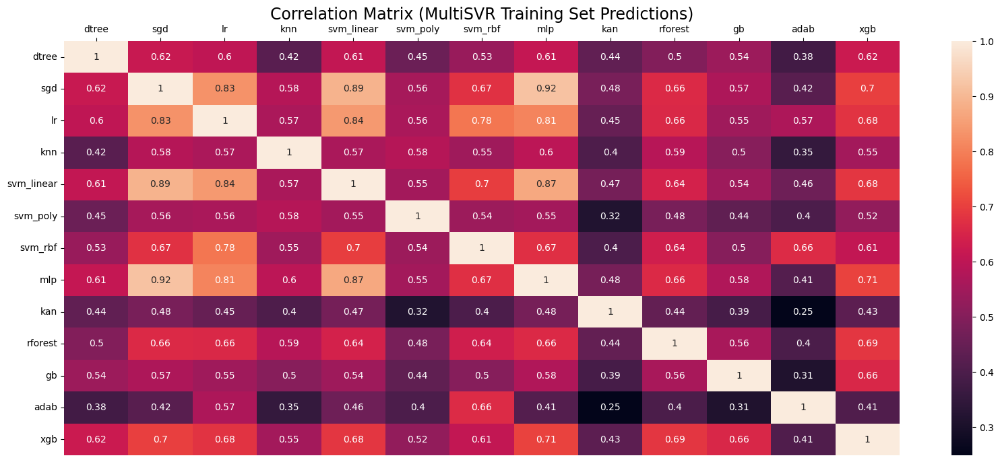

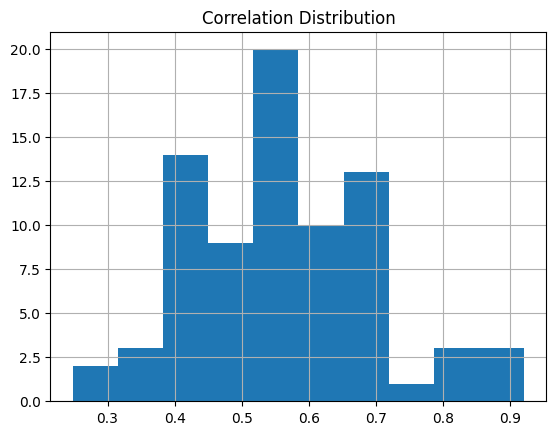

Training correlation distribution:
count    78.000000
mean      0.561379
std       0.137547
min       0.248535
25%       0.456067
50%       0.560118
75%       0.652684
max       0.920629
Name: corr, dtype: float64


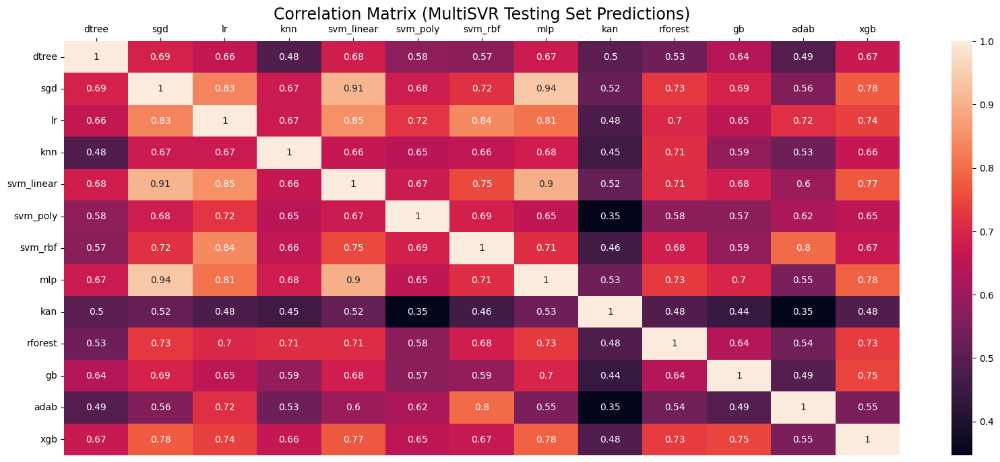

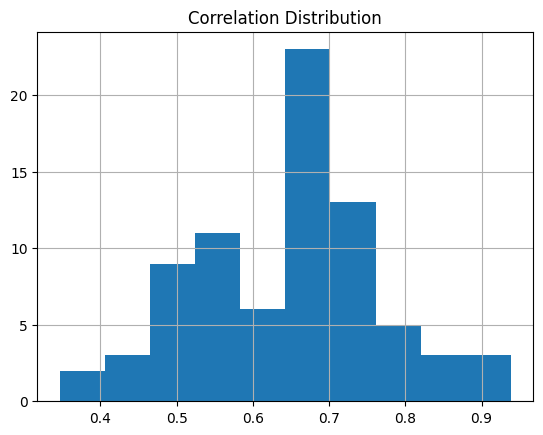

Testing correlation distribution:
count    78.000000
mean      0.645174
std       0.121801
min       0.346762
25%       0.552657
50%       0.665927
75%       0.715173
max       0.938356
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0356
NMSE: 0.1612
MAE: 1.0840
NMAE: 1.3560
aRRMSE: 1.0168
aCC: 0.8861


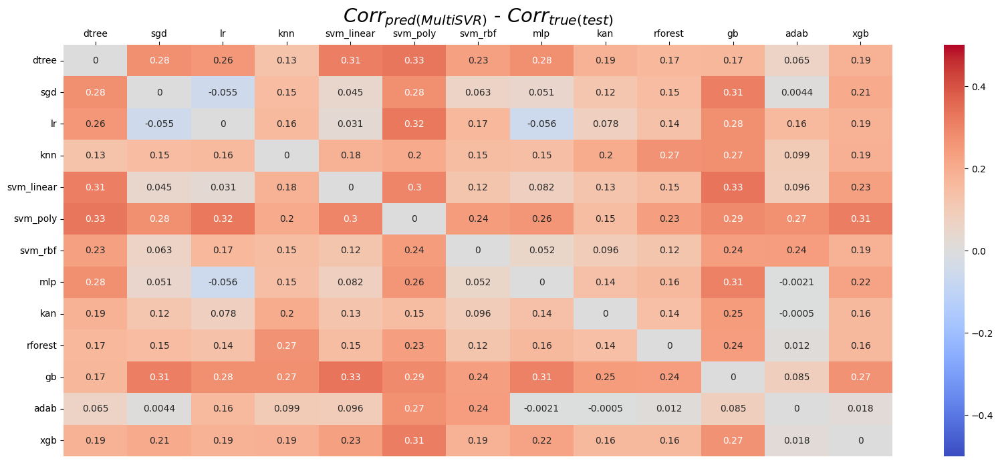

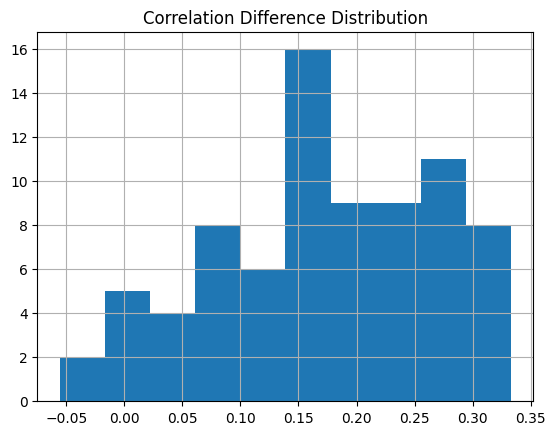

In [32]:
results = correlation_pred_performance(msvr, 
                                       pd.DataFrame(Xa_test_norm, index=Xa_test.index), 
                                       ya_test,
                                       pd.DataFrame(Xa_train_norm, index=Xa_train.index), 
                                       MIN_SCORE, name="MultiSVR")

In [33]:
diff_metrics.loc['M-SVR',:] = results['results']
diff_metrics.loc['M-SVR',:]

MSE       0.035598
MAE       0.161212
NMSE      1.083956
NMAE      1.356016
aRRMSE    1.016842
aCC       0.886117
Name: M-SVR, dtype: object

In [34]:
groups['msvr_assessor'] = results['groups']
groups['msvr_assessor']['test']

[['kan'],
 ['mlp', 'svm_linear', 'sgd', 'lr', 'dtree', 'xgb'],
 ['mlp', 'svm_linear', 'sgd', 'lr', 'gb', 'xgb'],
 ['rforest', 'mlp', 'svm_linear', 'sgd', 'svm_rbf', 'knn', 'lr', 'xgb'],
 ['mlp', 'svm_linear', 'sgd', 'svm_rbf', 'svm_poly', 'knn', 'lr', 'xgb'],
 ['svm_rbf', 'lr', 'adab']]

### Multi-Output Regressor 
(ST)

In [35]:
#mtr_params = getAssrParams(RandomForestRegressor, parameters, seed, False, 'estimator')
#
##mor = MultiOutputRegressor(RandomForestRegressor(random_state=seed), n_jobs=-1).fit(Xa_train, ya_train)
#g_search = GridSearchCV(MultiOutputRegressor(RandomForestRegressor()), mtr_params, n_jobs=-1, verbose=True, scoring="neg_mean_absolute_error").fit(Xa_train, ya_train)
#print(g_search.best_params_)
#mor = g_search.best_estimator_

In [36]:
#study = OptunaStudy(Xa_train, ya_train, 100)
#study.search(MultiOutputRegressor)

In [37]:
single_tgt = MultiOutputRegressor(RandomForestRegressor(random_state=seed), 
                                  n_jobs=-1).fit(Xa_train, ya_train)

In [38]:
metrics_df.loc['ST',:] = assr_performance(single_tgt, Xa_test, ya_test, Xa_train, ya_train)

[TRAINING SET]
MSE: 0.0062
NMSE: 0.1267
MAE: 0.0578
NMAE: 0.3359
aRRMSE: 0.3558
aCC: 0.9768

[TESTING SET]
MSE: 0.0393
NMSE: 0.8489
MAE: 0.1488
NMAE: 0.8894
aRRMSE: 0.9204
aCC: 0.3961


#### Análise das correlações

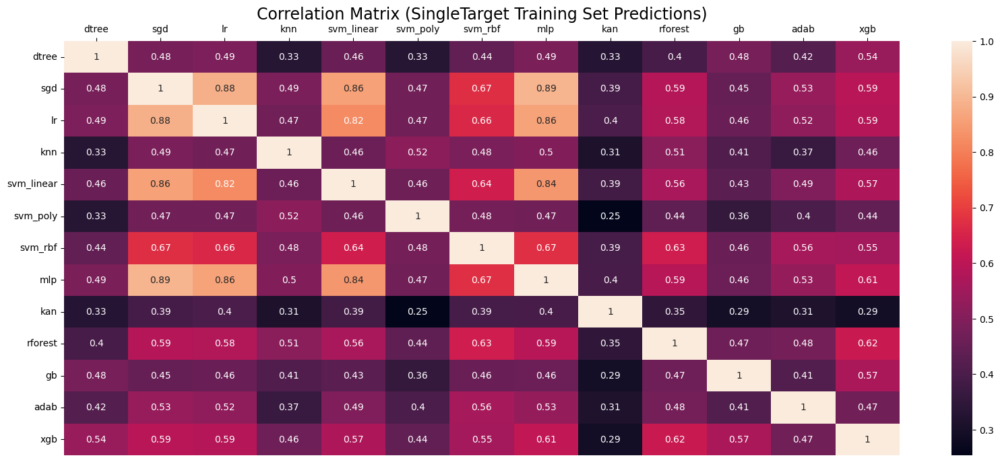

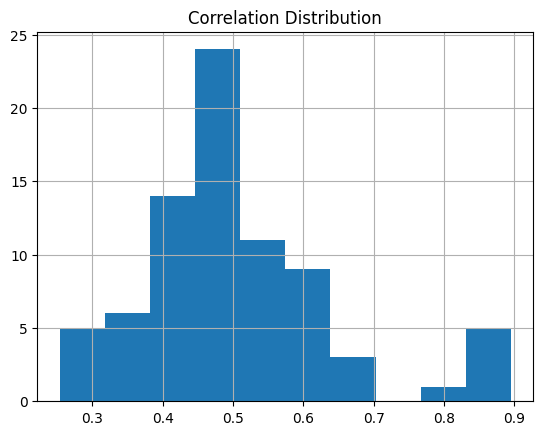

Training correlation distribution:
count    78.000000
mean      0.502668
std       0.139472
min       0.253963
25%       0.414533
50%       0.474376
75%       0.566942
max       0.894828
Name: corr, dtype: float64


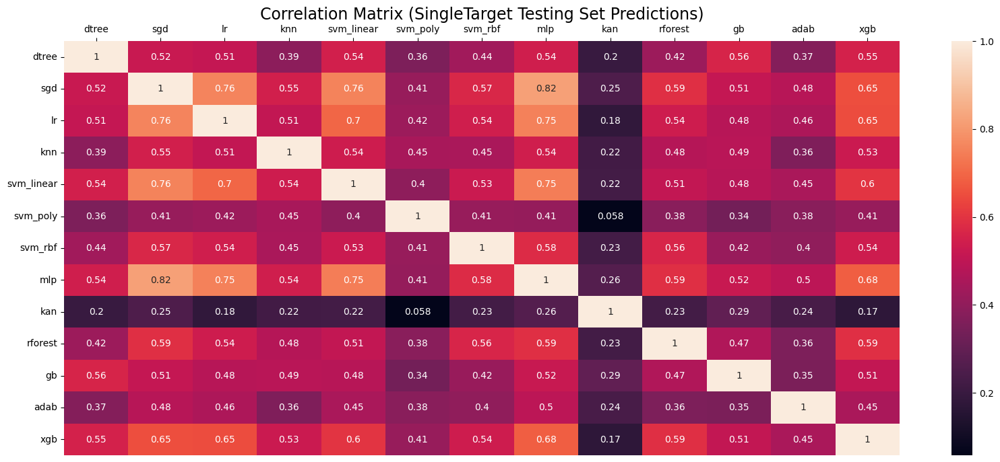

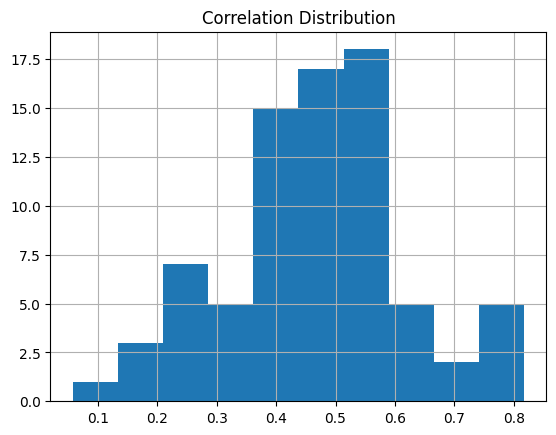

Testing correlation distribution:
count    78.000000
mean      0.465743
std       0.149846
min       0.058102
25%       0.385847
50%       0.482316
75%       0.543933
max       0.817076
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0084
NMSE: 0.0755
MAE: 0.2473
NMAE: 0.6156
aRRMSE: 0.4882
aCC: 0.9177


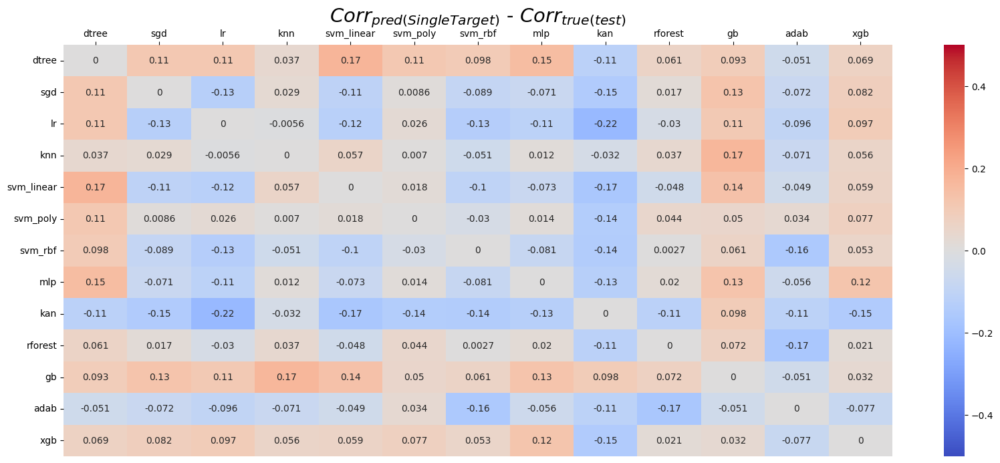

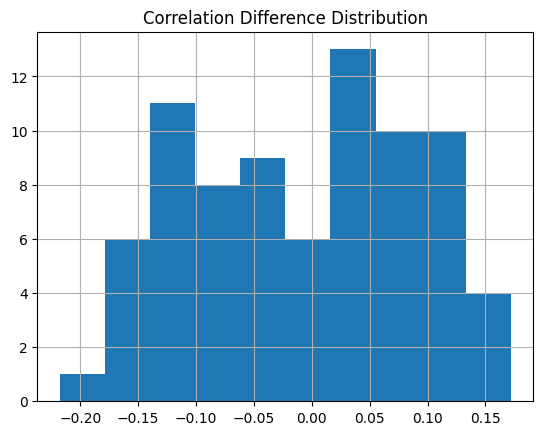

In [39]:
results = correlation_pred_performance(single_tgt, Xa_test, ya_test, Xa_train,
                                       MIN_SCORE, name="SingleTarget")

In [40]:
diff_metrics.loc['ST',:] = results['results']
diff_metrics.loc['ST',:]

MSE       0.008357
MAE       0.075489
NMSE      0.247314
NMAE      0.615568
aRRMSE    0.488187
aCC       0.917692
Name: ST, dtype: object

In [41]:
groups['st_assessor'] = results['groups']
groups['st_assessor']['test']

[['kan'],
 ['rforest'],
 ['mlp', 'sgd', 'lr', 'svm_linear'],
 ['mlp', 'sgd', 'lr', 'xgb'],
 ['svm_rbf'],
 ['svm_poly'],
 ['knn'],
 ['adab'],
 ['dtree'],
 ['gb']]

## Grupais

In [42]:
#keys = list(groups.keys())
#for i in range(len(keys)):
#    for j in range(i+1, len(keys)):
#        print(f'{keys[i]}({len(groups[keys[i]])}) & {keys[j]}({len(groups[keys[j]])}):')
#        count = 0
#        for g in groups[keys[i]]:
#            if(g in groups[keys[j]]):
#                print(g)
#                count += 1
#        print(f'Número de grupos em comum: {count}\n\n')

In [23]:
for g in groups['true_assessor_train']:
    if(len(g)!=1):
        teste = []
        for i, m in enumerate(g):
            for n in g[i+1:]:
                teste.append(pred_corrls.loc[m,n])
        print(g)
        print(f'total: {np.mean(teste)}\n')

['svm_rbf', 'mlp', 'sgd', 'lr']
total: 0.7796523201834379

['svm_rbf', 'kan']
total: 0.6860346316817405

['svm_linear', 'sgd', 'mlp', 'lr']
total: 0.8741527368076042



### Regressor Chain

In [24]:
#[RegressorChain(base_estimator=RandomForestRegressor(random_state=seed),
#                random_state=seed,
#                order='random', cv=5) for _ in range(num_chains)]

rcg = GroupedAssessor([RegressorChain(base_estimator=RandomForestRegressor(random_state=seed),
                                      random_state=seed,
                                      order='random', 
                                      cv=5) for _ in range(num_chains)])

rcg.fit(Xa_train, ya_train, groups=groups['true_assessor_train'])

[TRAINING SET]
MSE: 0.0069
NMSE: 0.1657
MAE: 0.0610
NMAE: 0.3726
aRRMSE: 0.4010
aCC: 0.9612

[TESTING SET]
MSE: 0.0318
NMSE: 0.8299
MAE: 0.1392
NMAE: 0.8815
aRRMSE: 0.9102
aCC: 0.4189


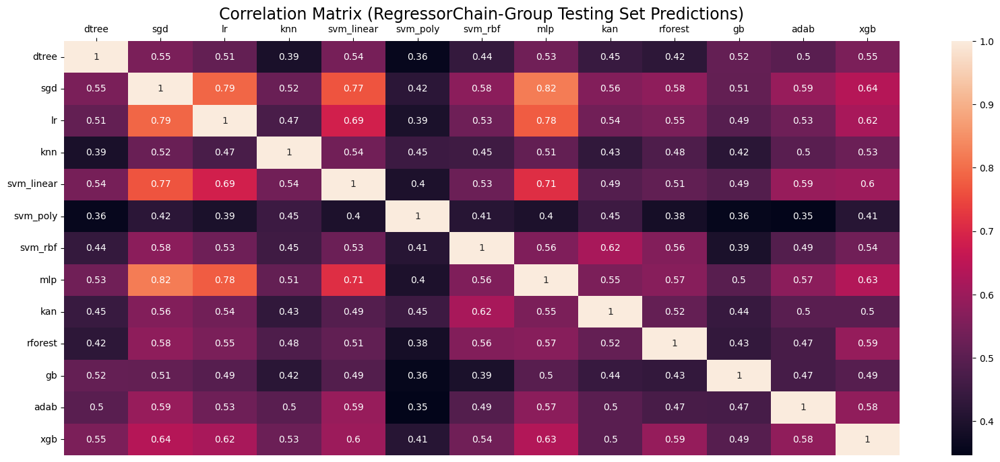

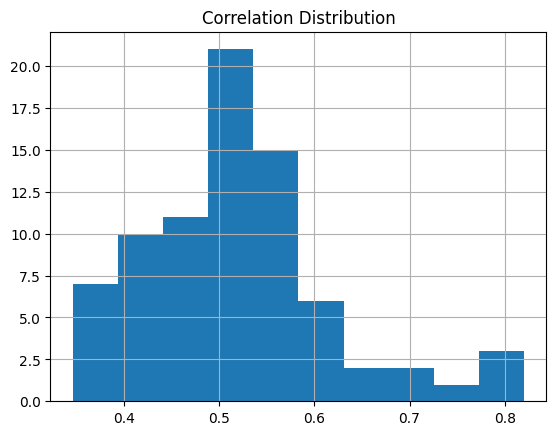

Testing correlation distribution:
count    78.000000
mean      0.519099
std       0.098328
min       0.346233
25%       0.450252
50%       0.513866
75%       0.562569
max       0.820248
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0063
NMSE: 0.0627
MAE: 0.1907
NMAE: 0.5001
aRRMSE: 0.4212
aCC: 0.9346


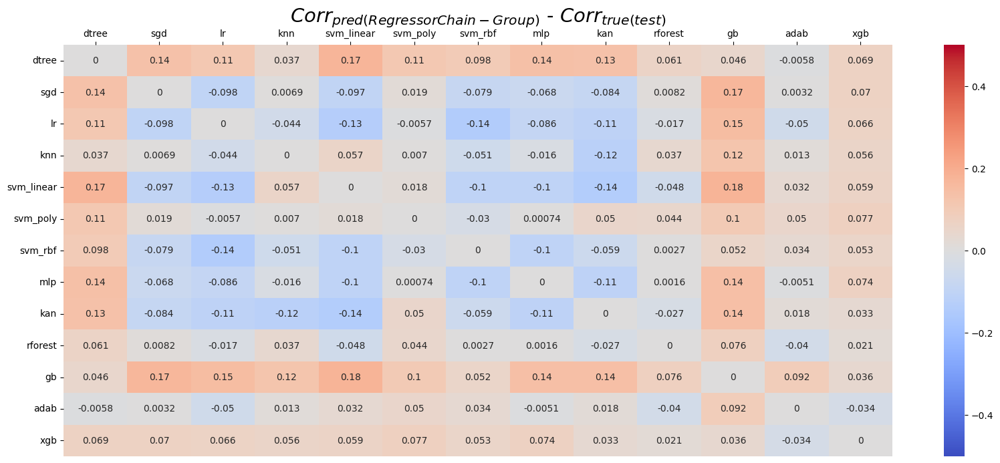

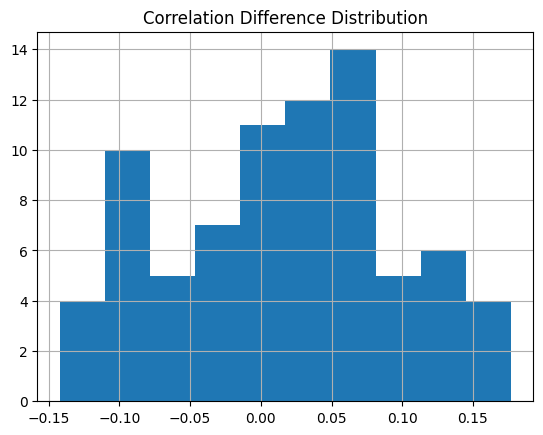

[['dtree'], ['svm_rbf'], ['svm_linear', 'sgd', 'mlp', 'lr'], ['knn'], ['adab'], ['xgb'], ['gb'], ['rforest'], ['svm_poly'], ['kan']]


In [25]:
metrics_df.loc['RC(g)',:] = assr_performance(rcg, Xa_test, ya_test, Xa_train, ya_train)

results = correlation_pred_performance(rcg, Xa_test, ya_test, min_score=MIN_SCORE, name="RegressorChain-Group")

diff_metrics.loc['RC(g)',:] = results['results']

groups['rcg_assessor'] = results['groups']
print(groups['rcg_assessor']['test'])

In [26]:
results

{'results': [0.006325623734687199,
  0.06265558358810461,
  np.float64(0.19065556229035943),
  np.float64(0.5001230872755317),
  np.float64(0.4211510374756713),
  np.float64(0.9346110877431459)],
 'groups': {'test': [['dtree'],
   ['svm_rbf'],
   ['svm_linear', 'sgd', 'mlp', 'lr'],
   ['knn'],
   ['adab'],
   ['xgb'],
   ['gb'],
   ['rforest'],
   ['svm_poly'],
   ['kan']]}}

### Ensemble of Regressor Chains

In [54]:
#rcg = GroupedAssessor(RegressorChain, model_names, random_state=seed)
#rcg.fit(Xa_train, ya_train, groups['true_assessor_train'], base_estimator=RandomForestRegressor(random_state=seed), 
#        random_state=seed, order='random', cv=5)

#rcg_plus = GroupedAssessor(VotingRegressor, model_names, random_state=seed,
#                           estimators=rc_ests, n_jobs=-1)

rcg_ac = f'RC[{num_chains}](g)'

rcg_plus = GroupedAssessor([GroupedAssessor([RegressorChain(
                                                base_estimator=RandomForestRegressor(random_state=seed),
                                                random_state=seed+i,
                                                order='random', cv=5) for i in range(num_chains)]
                                            ) for _ in range(len(groups['true_assessor_train']))])

rcg_plus.fit(Xa_train, ya_train, groups=groups['true_assessor_train'])

[TRAINING SET]
MSE: 0.0065
NMSE: 0.1606
MAE: 0.0596
NMAE: 0.3671
aRRMSE: 0.3980
aCC: 0.9650

[TESTING SET]
MSE: 0.0318
NMSE: 0.8279
MAE: 0.1391
NMAE: 0.8803
aRRMSE: 0.9091
aCC: 0.4213


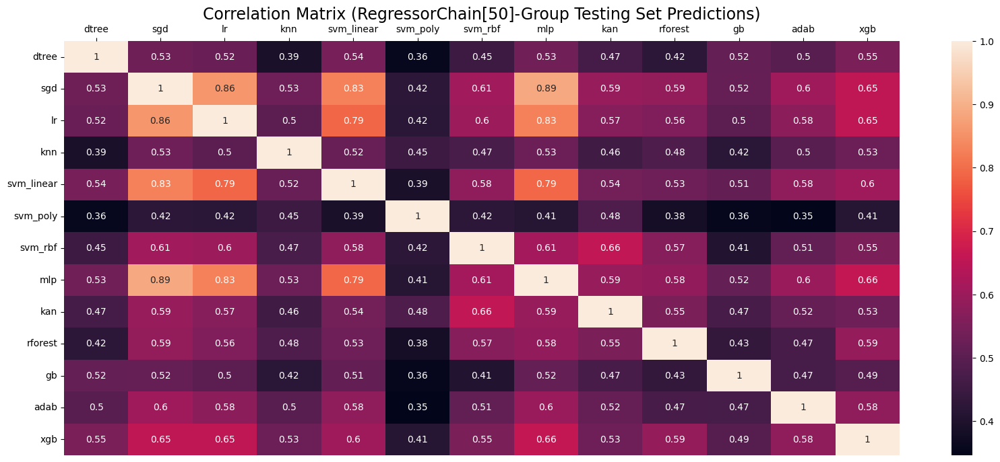

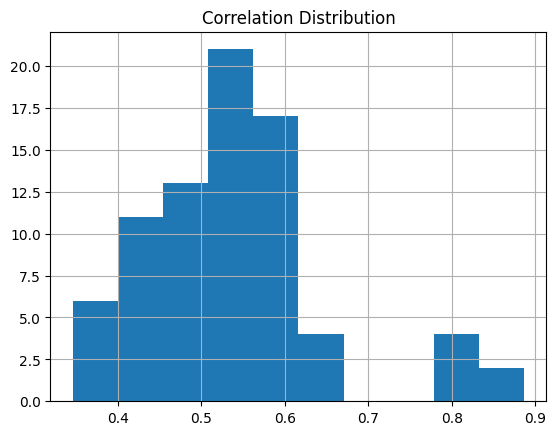

Testing correlation distribution:
count    78.000000
mean      0.537883
std       0.113067
min       0.346233
25%       0.468940
50%       0.526650
75%       0.587153
max       0.886228
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0055
NMSE: 0.0552
MAE: 0.1693
NMAE: 0.4573
aRRMSE: 0.3919
aCC: 0.9518


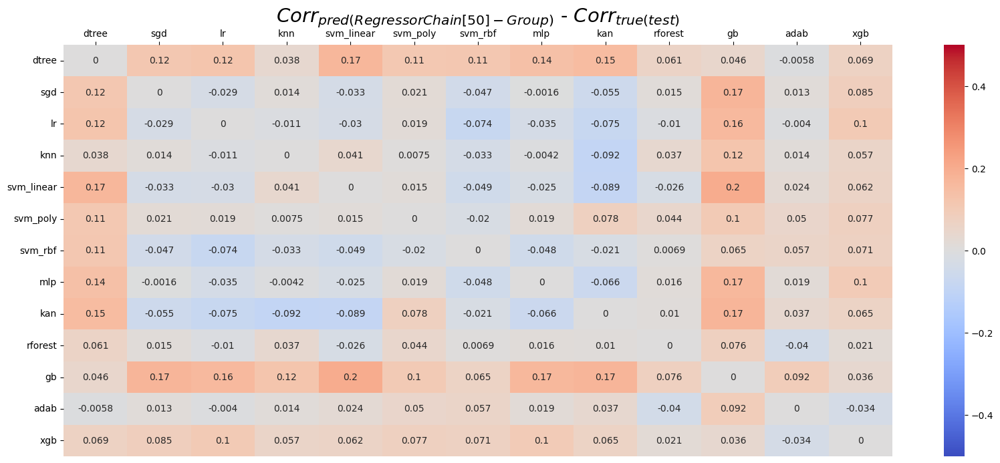

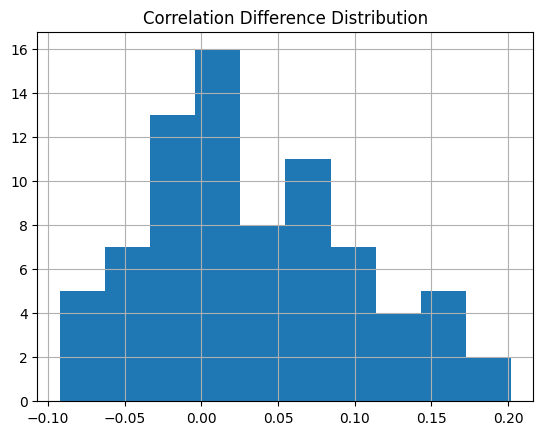

[['dtree'], ['svm_rbf', 'kan'], ['svm_linear', 'sgd', 'mlp', 'lr'], ['sgd', 'mlp', 'lr', 'xgb'], ['knn'], ['adab'], ['gb'], ['rforest'], ['svm_poly']]


In [55]:
# keeping the concat because multiple numbers of chains could be recorded
if(rcg_ac in metrics_df.index):
    metrics_df.loc[rcg_ac,:] = assr_performance(rcg_plus, Xa_test, ya_test, Xa_train, ya_train)
else:
    new_df = pd.DataFrame(assr_performance(rcg_plus, Xa_test, ya_test, Xa_train, ya_train), 
                          columns=metrics_cols,
                          index=multIdx(rcg_ac, subindex=model_names))

    metrics_df = pd.concat([metrics_df, new_df])

results = correlation_pred_performance(rcg_plus, Xa_test, ya_test, min_score=MIN_SCORE, name=f"RegressorChain[{num_chains}]-Group")

diff_metrics.loc[rcg_ac,:] = results['results']

groups[f'rcg({num_chains})_assessor'] = results['groups']
print(groups[f'rcg({num_chains})_assessor']['test'])

[TRAINING SET]
MSE: 0.0065
NMSE: 0.1603
MAE: 0.0596
NMAE: 0.3669
aRRMSE: 0.3976
aCC: 0.9652

[TESTING SET]
MSE: 0.0318
NMSE: 0.8278
MAE: 0.1391
NMAE: 0.8805
aRRMSE: 0.9091
aCC: 0.4213


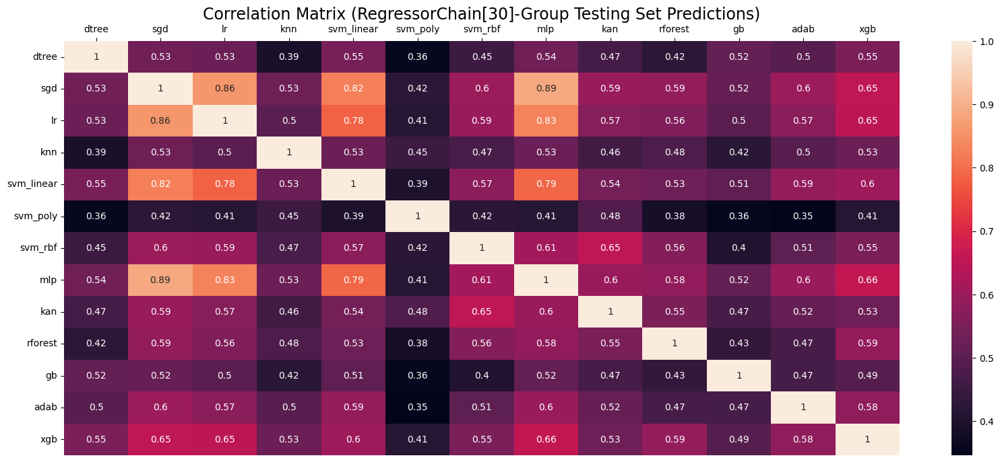

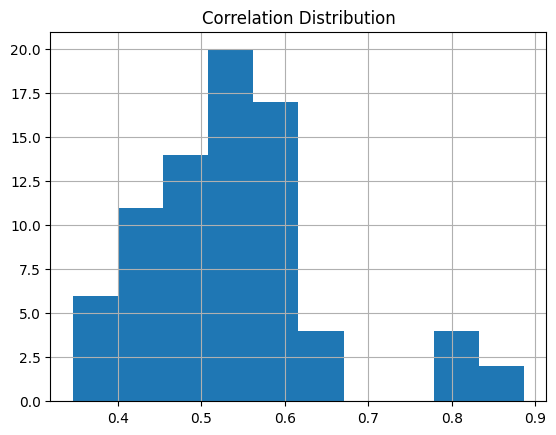

Testing correlation distribution:
count    78.000000
mean      0.537465
std       0.112551
min       0.346233
25%       0.468940
50%       0.526360
75%       0.587153
max       0.886651
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0055
NMSE: 0.0558
MAE: 0.1707
NMAE: 0.4610
aRRMSE: 0.3938
aCC: 0.9511


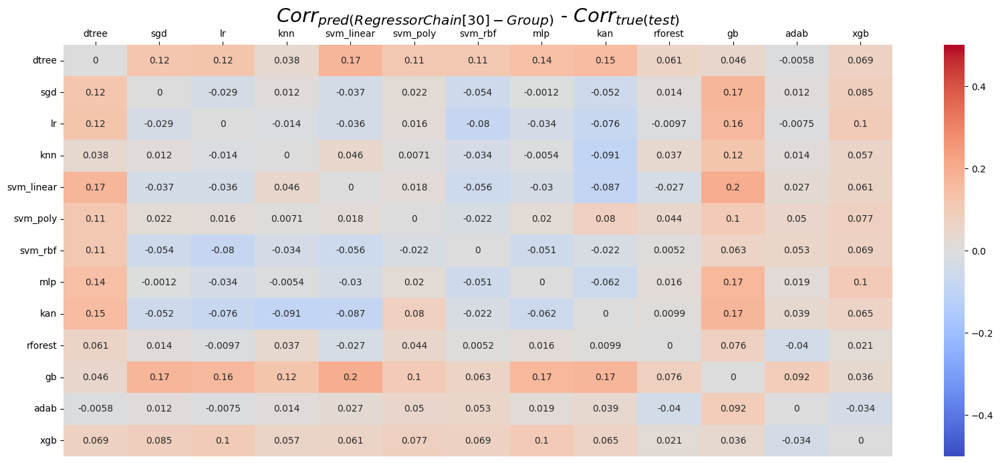

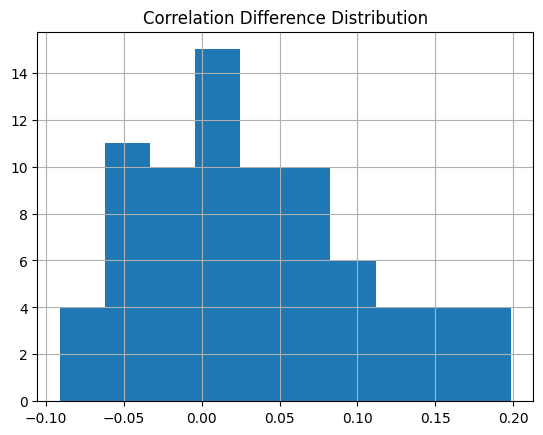

[['dtree'], ['svm_rbf', 'kan'], ['svm_linear', 'sgd', 'mlp', 'lr'], ['sgd', 'mlp', 'lr', 'xgb'], ['knn'], ['adab'], ['gb'], ['rforest'], ['svm_poly']]


In [ ]:
# keeping the concat because multiple numbers of chains could be recorded
#30chains
if(rcg_ac in metrics_df.index):
    metrics_df.loc[rcg_ac,:] = assr_performance(rcg_plus, Xa_test, ya_test, Xa_train, ya_train)
else:
    new_df = pd.DataFrame(assr_performance(rcg_plus, Xa_test, ya_test, Xa_train, ya_train), 
                          columns=metrics_cols,
                          index=multIdx(rcg_ac, subindex=model_names))

    metrics_df = pd.concat([metrics_df, new_df])

results = correlation_pred_performance(rcg_plus, Xa_test, ya_test, min_score=MIN_SCORE, name=f"RegressorChain[{num_chains}]-Group")

diff_metrics.loc[rcg_ac,:] = results['results']

groups[f'rcg({num_chains})_assessor'] = results['groups']
print(groups[f'rcg({num_chains})_assessor']['test'])

[TRAINING SET]
MSE: 0.0065
NMSE: 0.1631
MAE: 0.0597
NMAE: 0.3694
aRRMSE: 0.4006
aCC: 0.9640

[TESTING SET]
MSE: 0.0318
NMSE: 0.8284
MAE: 0.1392
NMAE: 0.8808
aRRMSE: 0.9094
aCC: 0.4207


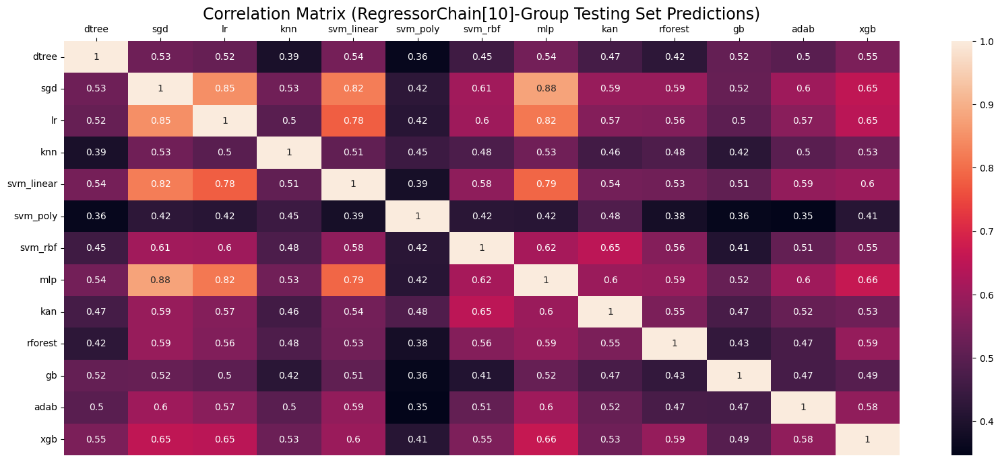

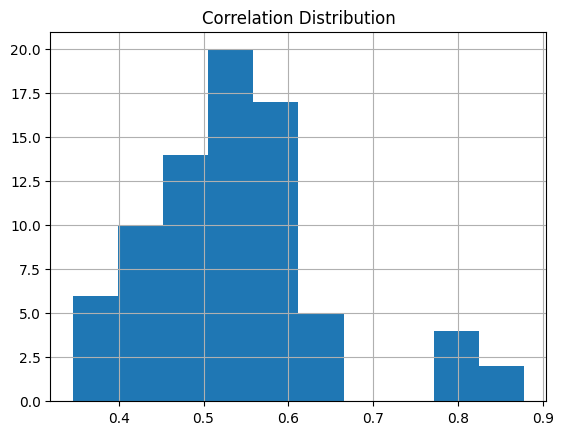

Testing correlation distribution:
count    78.000000
mean      0.537199
std       0.111418
min       0.346233
25%       0.468940
50%       0.528553
75%       0.590272
max       0.877557
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0055
NMSE: 0.0559
MAE: 0.1698
NMAE: 0.4610
aRRMSE: 0.3928
aCC: 0.9517


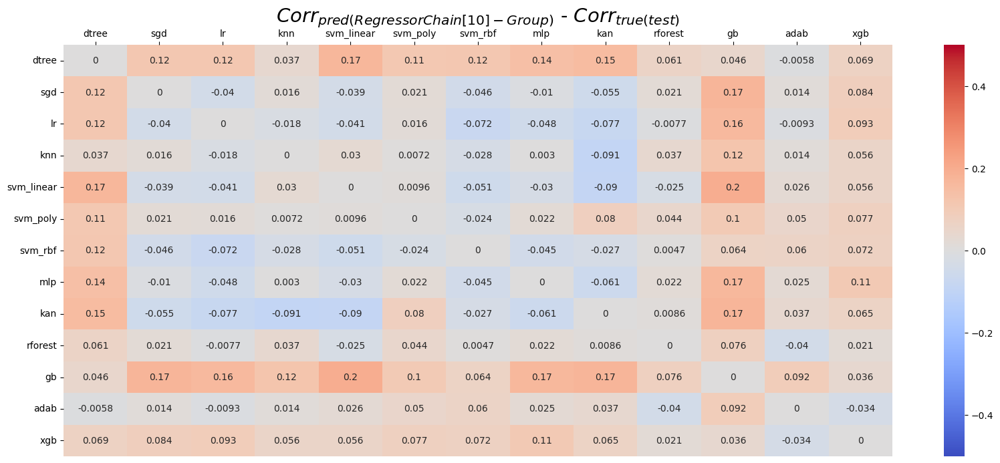

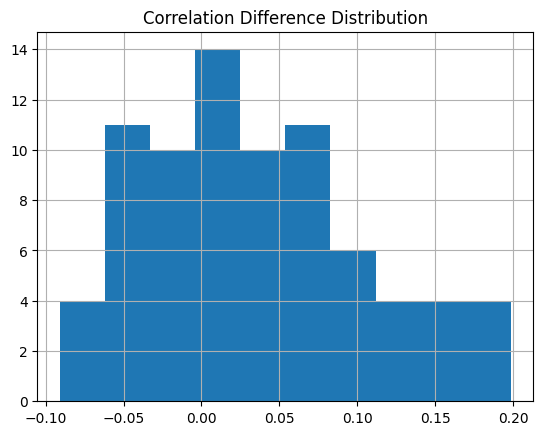

[['dtree'], ['svm_rbf', 'kan'], ['svm_linear', 'sgd', 'mlp', 'lr'], ['sgd', 'mlp', 'lr', 'xgb'], ['knn'], ['adab'], ['gb'], ['rforest'], ['svm_poly']]


In [ ]:
# keeping the concat because multiple numbers of chains could be recorded
#10chains
if(rcg_ac in metrics_df.index):
    metrics_df.loc[rcg_ac,:] = assr_performance(rcg_plus, Xa_test, ya_test, Xa_train, ya_train)
else:
    new_df = pd.DataFrame(assr_performance(rcg_plus, Xa_test, ya_test, Xa_train, ya_train), 
                          columns=metrics_cols,
                          index=multIdx(rcg_ac, subindex=model_names))

    metrics_df = pd.concat([metrics_df, new_df])

results = correlation_pred_performance(rcg_plus, Xa_test, ya_test, min_score=MIN_SCORE, name=f"RegressorChain[{num_chains}]-Group")

diff_metrics.loc[rcg_ac,:] = results['results']

groups[f'rcg({num_chains})_assessor'] = results['groups']
print(groups[f'rcg({num_chains})_assessor']['test'])

### Multi-Output SVR

In [ ]:
msvrg = GroupedAssessor([MSVR() for _ in range(len(groups['true_assessor_train']))])

msvrg.fit(Xa_train_norm, ya_train, groups['true_assessor_train'])

c:\Users\pedro\Documents\NOVOdeltadelta\pog\meu\proj-mtr\MSVR.py:74: RuntimeWarning: divide by zero encountered in divide
  a = 2 * C * (u - epsi) / u
c:\Users\pedro\Documents\NOVOdeltadelta\pog\meu\proj-mtr\MSVR.py:74: RuntimeWarning: divide by zero encountered in divide
  a = 2 * C * (u - epsi) / u


[TRAINING SET]
MSE: 0.0306
NMSE: 0.7385
MAE: 0.1337
NMAE: 0.8459
aRRMSE: 0.8443
aCC: 0.6644

[TESTING SET]
MSE: 0.0492
NMSE: 1.5985
MAE: 0.1622
NMAE: 1.0933
aRRMSE: 1.2016
aCC: 0.3004


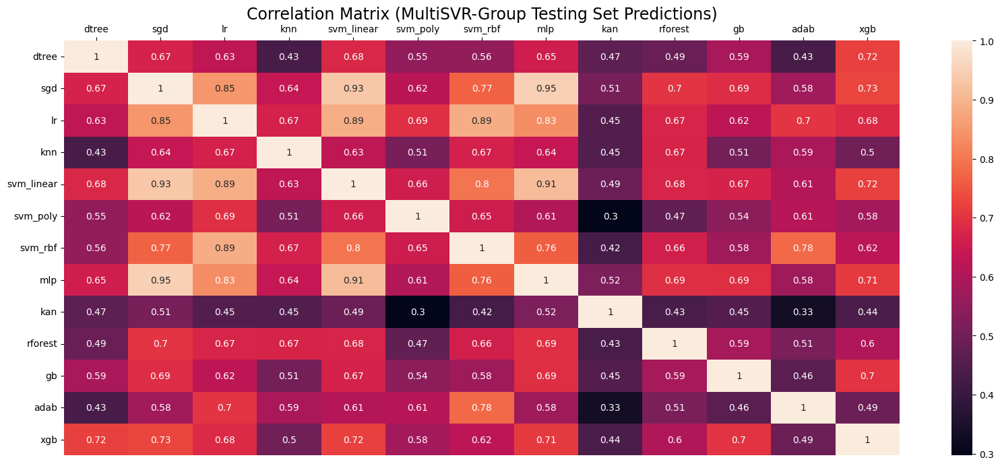

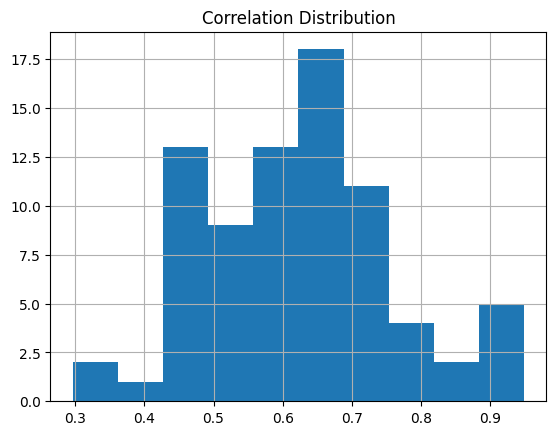

Testing correlation distribution:
count    78.000000
mean      0.620602
std       0.135604
min       0.296749
25%       0.511975
50%       0.625905
75%       0.692413
max       0.948929
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0275
NMSE: 0.1392
MAE: 0.8266
NMAE: 1.1551
aRRMSE: 0.8899
aCC: 0.8894


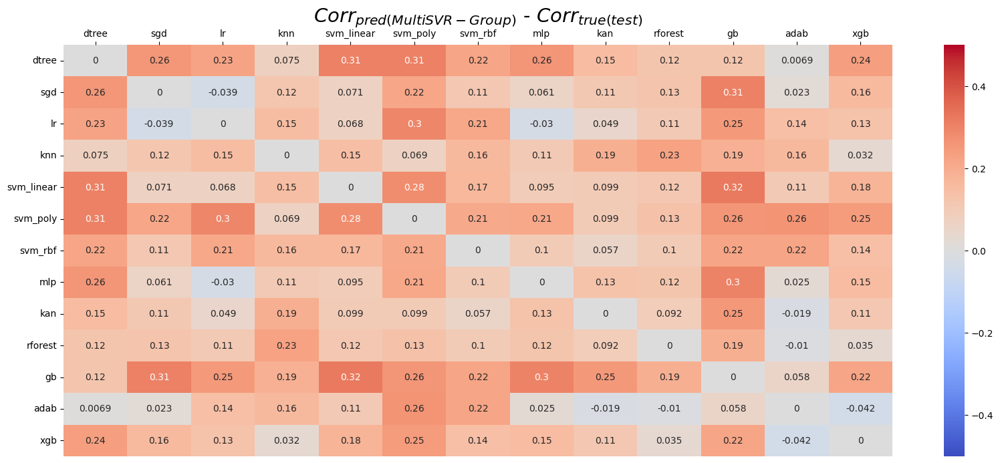

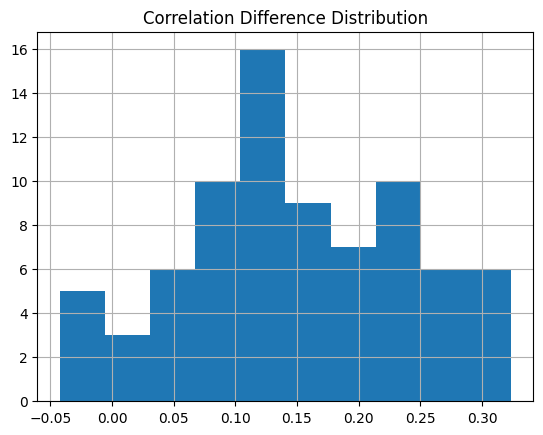

[['kan'], ['mlp', 'svm_linear', 'sgd', 'dtree', 'xgb'], ['mlp', 'svm_linear', 'sgd', 'gb', 'xgb'], ['rforest', 'mlp', 'svm_linear', 'sgd', 'svm_rbf', 'lr'], ['mlp', 'svm_linear', 'sgd', 'lr', 'xgb'], ['svm_linear', 'svm_rbf', 'lr', 'svm_poly'], ['svm_rbf', 'adab', 'lr'], ['svm_rbf', 'rforest', 'lr', 'knn']]


In [48]:
metrics_df.loc['M-SVR(g)',:] = assr_performance(msvrg, Xa_test_norm, ya_test, Xa_train_norm, ya_train)

results = correlation_pred_performance(msvrg, pd.DataFrame(Xa_test_norm, index=Xa_test.index), 
                                       ya_test, min_score=MIN_SCORE, name="MultiSVR-Group")

diff_metrics.loc['M-SVR(g)',:] = results['results']

groups['msvrg_assessor'] = results['groups']
print(groups['msvrg_assessor']['test'])

### Multi-Target Random Forest Regressor

In [ ]:
mrfg = GroupedAssessor([RandomForestRegressor(random_state=seed) for _ in range(len(groups['true_assessor_train']))])

mrfg.fit(Xa_train, ya_train, groups['true_assessor_train'])

c:\Users\pedro\pyenvs\mainpy\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
c:\Users\pedro\pyenvs\mainpy\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
c:\Users\pedro\pyenvs\mainpy\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
c:\Users\pedro\pyenvs\mainpy\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (

[TRAINING SET]
MSE: 0.0062
NMSE: 0.1271
MAE: 0.0580
NMAE: 0.3373
aRRMSE: 0.3563
aCC: 0.9771

[TESTING SET]
MSE: 0.0391
NMSE: 0.8378
MAE: 0.1485
NMAE: 0.8852
aRRMSE: 0.9141
aCC: 0.4110


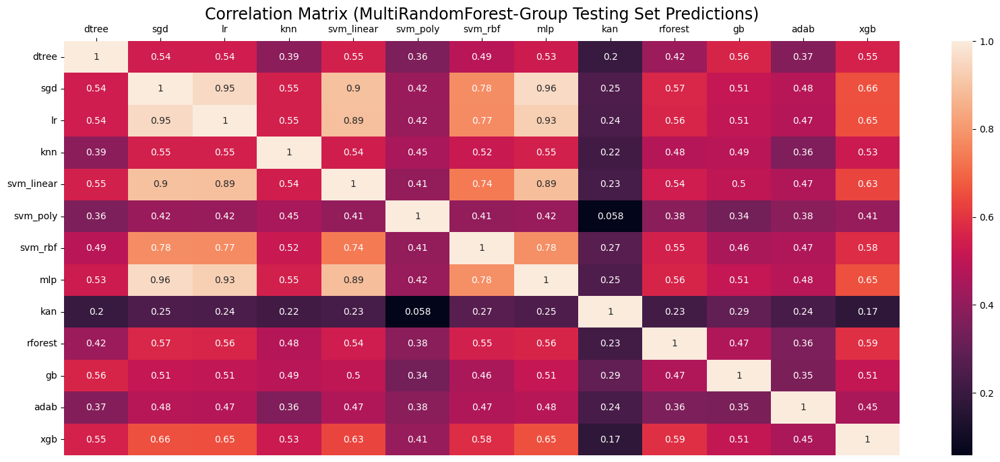

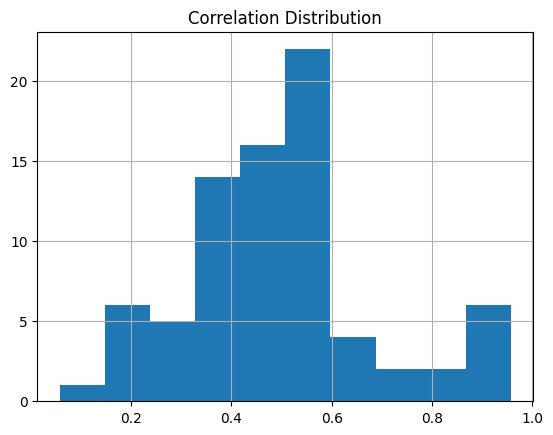

Testing correlation distribution:
count    78.000000
mean      0.496184
std       0.186537
min       0.058102
25%       0.385847
50%       0.487535
75%       0.558155
max       0.957177
Name: corr, dtype: float64

Diferença entre correlações das previsões do assessor e do conjunto de teste:
MSE: 0.0078
NMSE: 0.0731
MAE: 0.2348
NMAE: 0.6036
aRRMSE: 0.4753
aCC: 0.9337


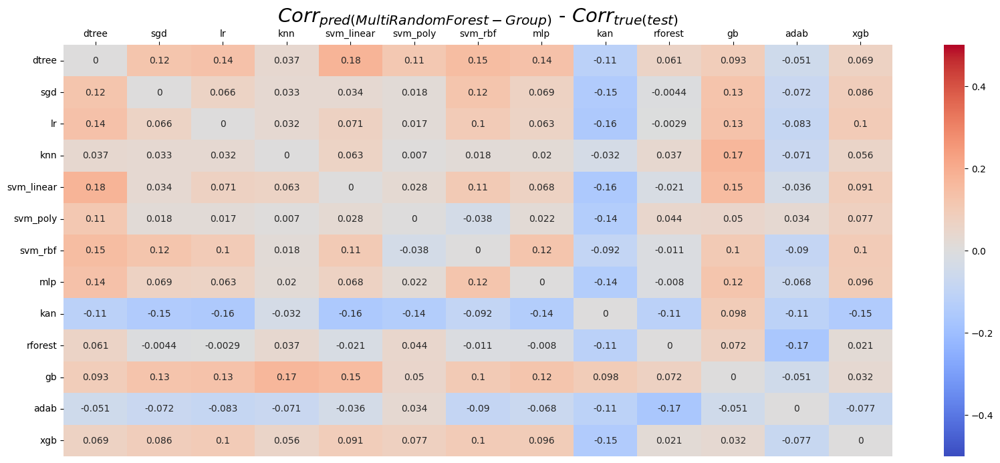

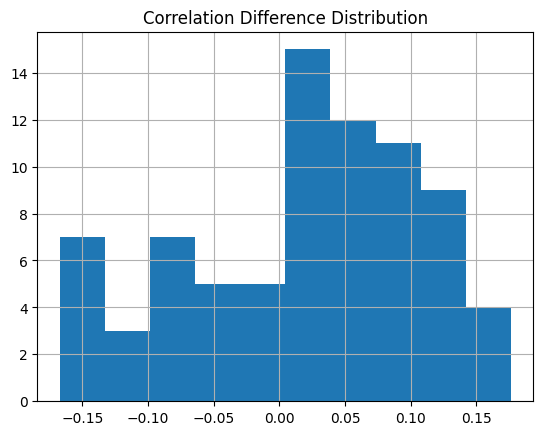

[['kan'], ['rforest'], ['mlp', 'sgd', 'svm_linear', 'svm_rbf', 'lr'], ['mlp', 'sgd', 'lr', 'xgb'], ['svm_poly'], ['knn'], ['adab'], ['dtree'], ['gb']]


In [50]:
metrics_df.loc['MRT(g)',:] = assr_performance(mrfg, Xa_test, ya_test, Xa_train, ya_train)

results = correlation_pred_performance(mrfg, Xa_test, ya_test, min_score=MIN_SCORE, name="MultiRandomForest-Group")

diff_metrics.loc['MRT(g)',:] = results['results']

groups['mrfg_assessor'] = results['groups']
print(groups['mrfg_assessor']['test'])

In [51]:
#keys = list(groups.keys())
#OBJV = len(groups['true_assessor_test'])
#for i in range(len(keys)):
#    if('test' in keys[i] and keys[i] != 'true_assessor_test'):
#        print(f'{keys[i]}({len(groups[keys[i]])}) & true_assessor_test({OBJV}):')
#        count = 0
#        for g in groups[keys[i]]:
#            if(g in groups['true_assessor_test']):
#                print(g)
#                count += 1
#        print(f'Número de grupos em comum: {count}\n\n')

## Análises

In [58]:
results_df = metrics_df.copy()
results_df = results_df.reset_index()

results_df

,Assessor,Model,MSE,MAE,NMSE,NMAE,aRRMSE,aCC
0,RC,dtree,0.068266,0.868108,0.220546,0.923366,0.931723,0.392941
1,RC,sgd,0.035838,0.793081,0.155396,0.862966,0.890551,0.458741
2,RC,lr,0.009638,0.719519,0.077946,0.821611,0.848244,0.54122
3,RC,knn,0.030399,0.819524,0.144265,0.878108,0.905276,0.433599
4,RC,svm_linear,0.026053,0.801723,0.129925,0.863834,0.89539,0.445989
...,...,...,...,...,...,...,...,...
99,RC[50](g),kan,0.041634,0.880358,0.165184,0.904776,0.938274,0.346184
100,RC[50](g),rforest,0.03503,0.86078,0.153779,0.919298,0.927783,0.378154
101,RC[50](g),gb,0.05257,1.028777,0.189839,0.976762,1.014287,0.196548
102,RC[50](g),adab,0.010535,0.768342,0.08038,0.842031,0.876551,0.492495


In [ ]:
diff_results = diff_metrics.reset_index(names=['Assessor'])
diff_results.to_csv(f'data/{DIR}/results_diff.csv')
diff_results

,Assessor,MSE,MAE,NMSE,NMAE,aRRMSE,aCC
0,RC,0.010034,0.077194,0.297521,0.60696,0.522221,0.887375
1,RC(g),0.006326,0.062656,0.190656,0.500123,0.421151,0.934611
2,RC[10],0.019233,0.104952,0.600459,0.88748,0.738804,0.889888
3,RC(10)(g),0.005489,0.055887,0.169775,0.461045,0.392763,0.951666
4,RC[30],0.021164,0.110856,0.670368,0.947672,0.785277,0.900816
5,RC[30](g),0.005516,0.055786,0.170694,0.461034,0.393763,0.951066
6,RC[50],0.021563,0.112215,0.684156,0.959318,0.793462,0.899688
7,RC[50](g),0.005465,0.055247,0.169298,0.457328,0.391899,0.951826


In [ ]:
win_table = pd.DataFrame(index=results_df['Assessor'].unique(), columns=results_df.drop(columns=['Assessor', 'Model']).columns)

for mt in ['MSE', 'MAE', 'NMSE', 'NMAE', 'aRRMSE']:
    assr_wins = results_df.loc[results_df.groupby("Model")[mt].idxmin(), ["Model", "Assessor", mt]]
    win_table[mt] = assr_wins['Assessor'].value_counts()

assr_wins = results_df.loc[results_df.groupby("Model")['aCC'].idxmin(), ["Model", "Assessor", 'aCC']]
win_table['aCC'] = assr_wins['Assessor'].value_counts()

win_table = win_table.fillna(0)
win_table.to_csv(f'data/{DIR}/win_table.csv')
win_table

,MSE,MAE,NMSE,NMAE,aRRMSE,aCC
RC,0.0,0.0,0.0,0.0,0.0,8.0
RC(g),1.0,1.0,2.0,2.0,1.0,3.0
RC[10],3.0,3.0,2.0,2.0,3.0,0.0
RC[10](g),0.0,0.0,0.0,0.0,0.0,0.0
RC[30],2.0,2.0,5.0,5.0,2.0,0.0
RC[30](g),0.0,0.0,1.0,1.0,0.0,2.0
RC[50],6.0,6.0,2.0,2.0,6.0,0.0
RC[50](g),1.0,1.0,1.0,1.0,1.0,0.0


In [ ]:
summary = results_df.drop(columns=['Model']).groupby(['Assessor']).agg(['mean', 'std'])
summary.to_csv(f'data/{DIR}/results.csv')
summary

MSE                 MAE                NMSE            \
               mean       std      mean       std      mean       std   
Assessor                                                                
RC         0.032082  0.017318  0.835475  0.074071  0.140691  0.044611   
RC(g)      0.031794  0.017049  0.829867  0.071436  0.139233  0.043474   
RC[10]     0.031505  0.017065  0.819812  0.069535  0.139314  0.044207   
RC[10](g)  0.031807  0.017106  0.828413  0.073887  0.139218  0.043680   
RC[30]      0.03143  0.017130  0.817339  0.071607  0.139042  0.044343   
RC[30](g)  0.031777  0.017102  0.827839  0.073869  0.139146  0.043634   
RC[50]     0.031412  0.017099  0.816823  0.071166  0.139105  0.044405   
RC[50](g)  0.031783  0.017099  0.827892  0.073517  0.139125  0.043638   

               NMAE              aRRMSE                 aCC            
               mean       std      mean       std      mean       std  
Assessor                                                               
RC           0.8895  0.038826  0.913247  0.039705  0.413092  0.084094  
RC(g)      0.881502  0.038464  0.910233  0.038127  0.418865  0.080625  
RC[10]     0.880538  0.040229  0.904703  0.037882  0.436265  0.080835  
RC[10](g)  0.880818  0.040278   0.90938  0.039518  0.420679  0.083983  
RC[30]     0.878686  0.040942  0.903299  0.038807  0.438155  0.085002  
RC[30](g)  0.880497  0.040133  0.909065  0.039505  0.421345  0.083964  
RC[50]     0.878981  0.040716  0.903023  0.038545  0.438336  0.084512  
RC[50](g)   0.88032  0.040101  0.909102  0.039308  0.421316  0.083478

In [72]:
results_df_c = results_df.copy()

In [ ]:
class_palette = sns.color_palette()[:7]

In [ ]:
from torch import relu
from torch import Tensor

class_palette = [
                 sns.color_palette('bright')[3], relu(Tensor(sns.color_palette()[3])-Tensor([0.2]*3)).tolist(),
                 sns.color_palette('bright')[2], relu(Tensor(sns.color_palette()[2])-Tensor([0.15]*3)).tolist(),
                 sns.color_palette('bright')[0], relu(Tensor(sns.color_palette()[0])-Tensor([0.15]*3)).tolist(),
                 sns.color_palette('bright')[8], relu(Tensor(sns.color_palette()[8])-Tensor([0.15]*3)).tolist(),
                 ]

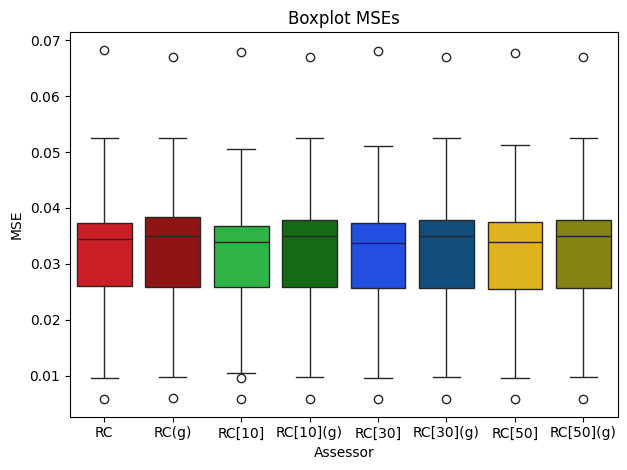

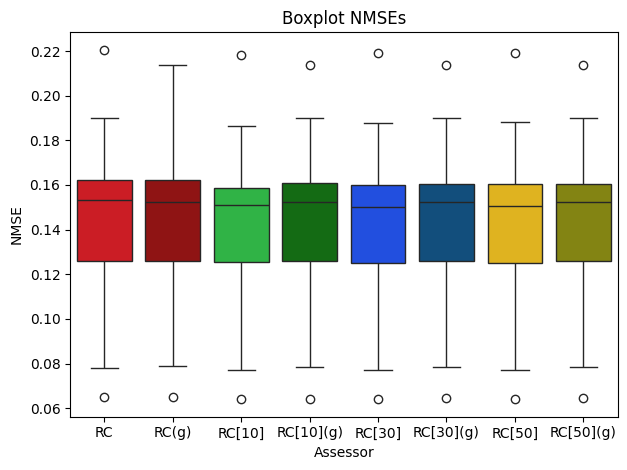

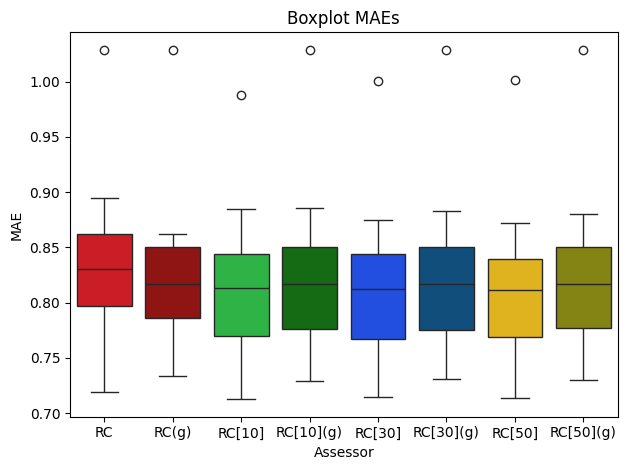

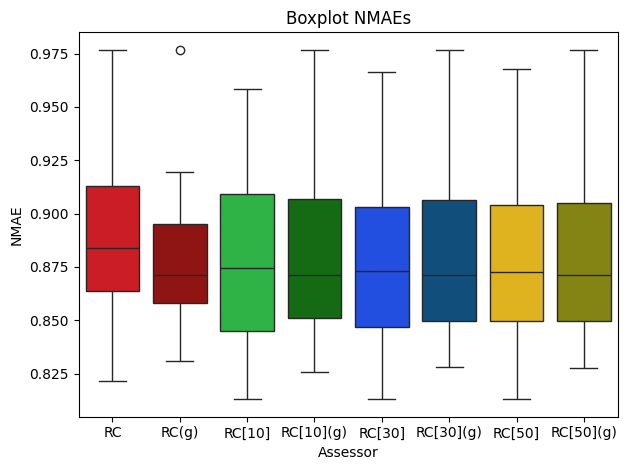

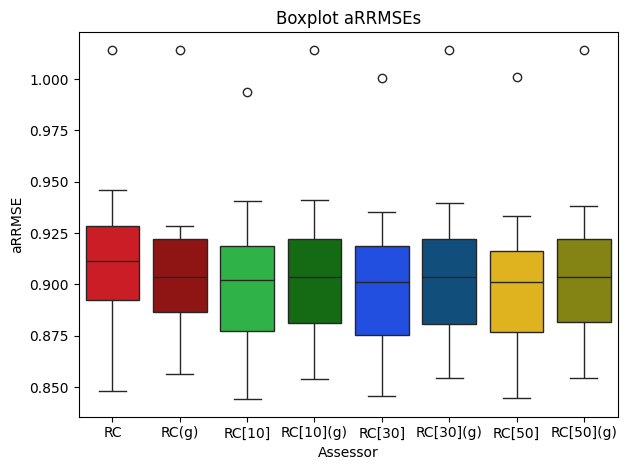

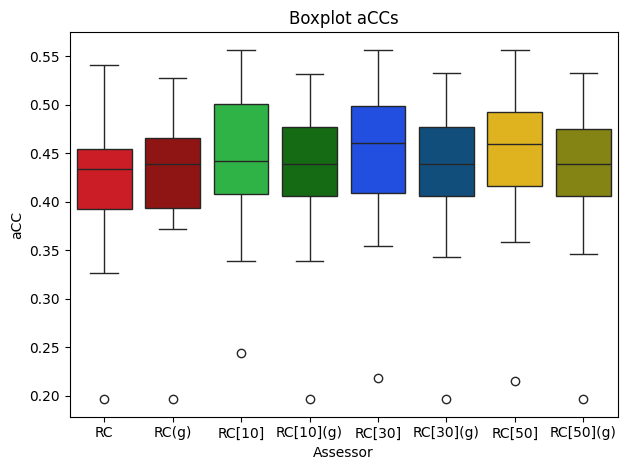

In [237]:
#temp = results_df.drop(index=results_df[results_df['Assessor'].str.contains('M-SVR')].index) #.copy()

for mt in ['MSE', 'NMSE', 'MAE', 'NMAE', 'aRRMSE', 'aCC']:
    plt.title(f'Boxplot {mt}s')
    temp = results_df.loc[:,['Assessor','Model',mt]].copy()
    if((temp[mt] > 1.2).any()):
        dicio = {}
        for a in temp['Assessor'].unique():
            out_limits = (temp.loc[temp["Assessor"]==a,mt]>1.2).sum()
            if(out_limits > 0):
                dicio[a] = a + "*"*out_limits
        temp = temp.replace(dicio)
        plt.ylim(bottom=temp[mt].min()-0.017,top=temp.loc[temp[mt]<1.2,mt].max()+0.017)
    imgplt = sns.boxplot(temp, y=mt, x='Assessor', hue='Assessor', palette=class_palette)
    plt.tight_layout()
    plt.show(imgplt)
    imgplt.figure.savefig(f'data/{DIR}/imgs/bp_{mt.lower()}.eps', format='eps', dpi=300)

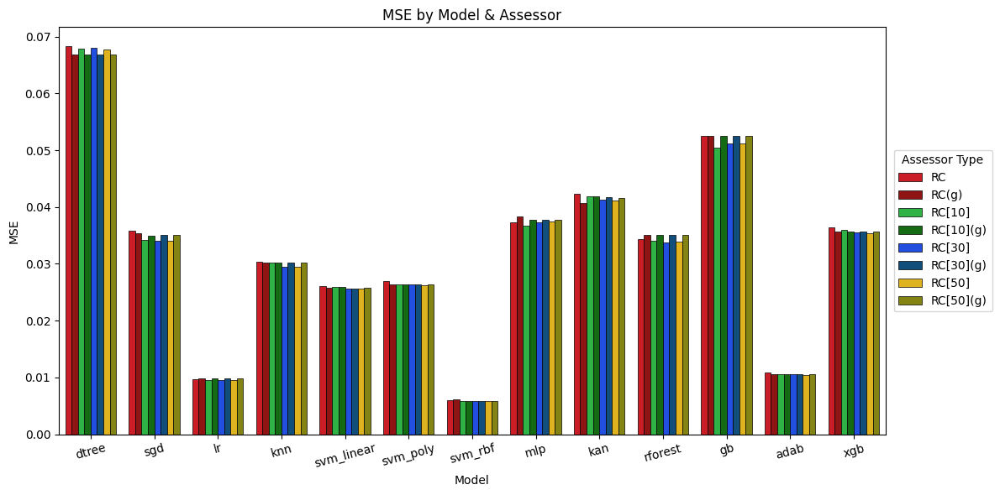

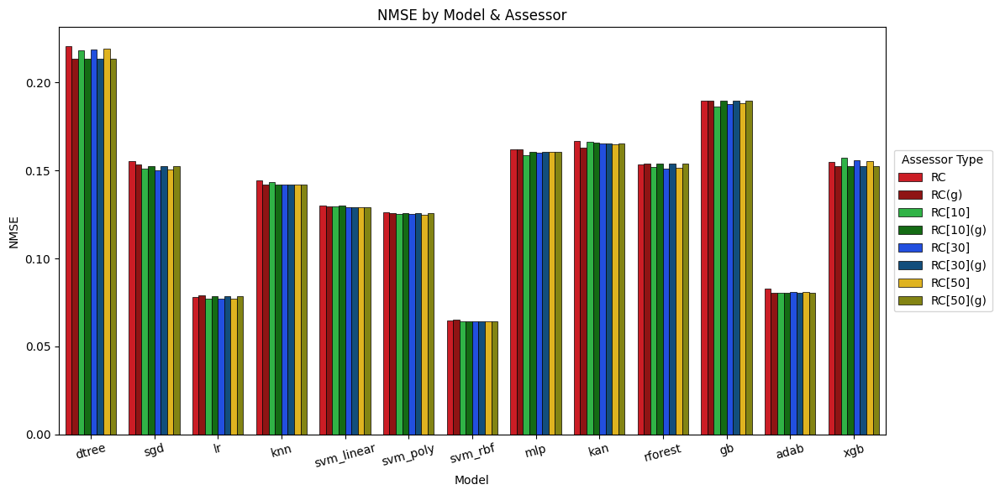

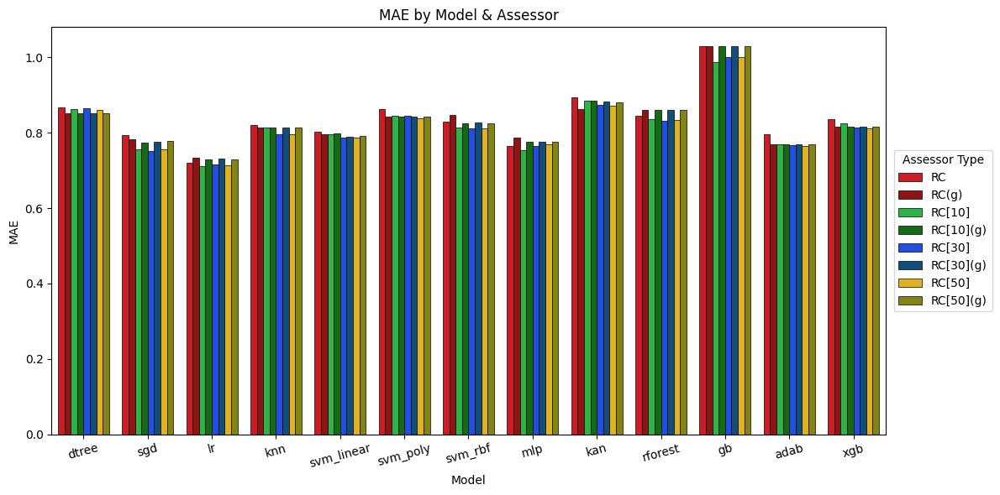

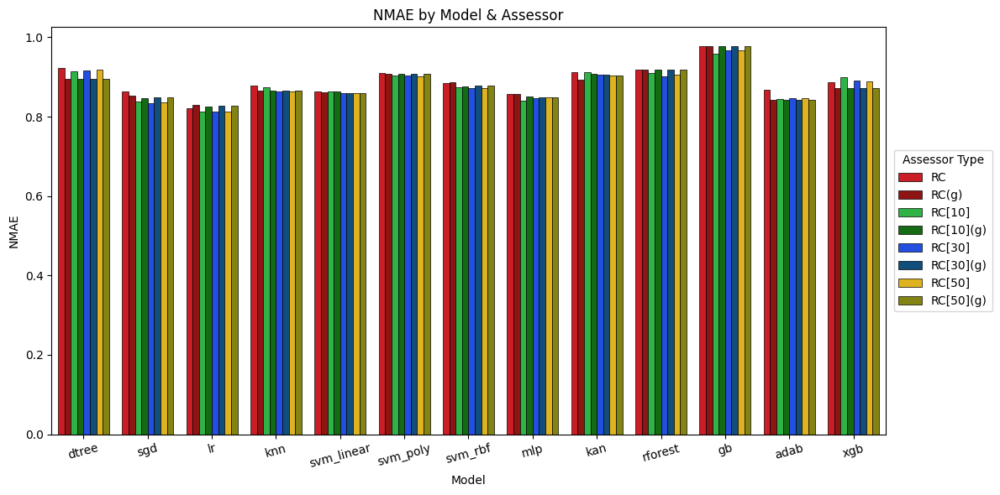

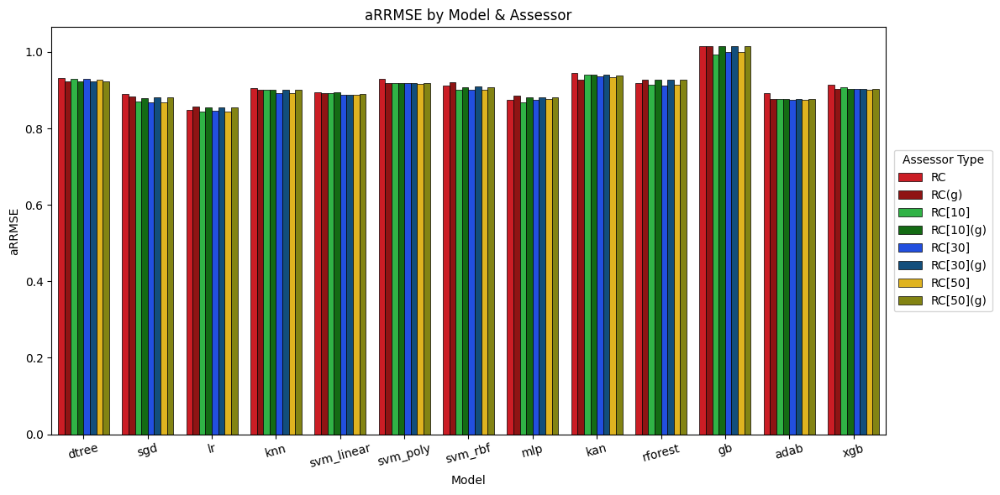

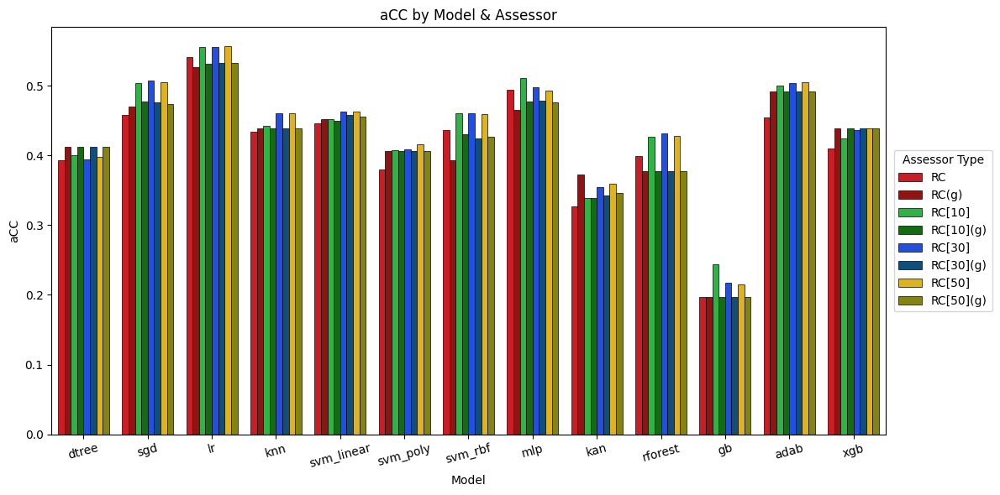

In [238]:
for mt in ['MSE', 'NMSE', 'MAE', 'NMAE', 'aRRMSE', 'aCC']:
    plt.figure(figsize=(12, 6))
    imgplt = sns.barplot(data=results_df, x='Model', y=mt, hue='Assessor', palette=class_palette, edgecolor='black', linewidth=0.5)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left', borderaxespad=0, title='Assessor Type')
    plt.title(f'{mt} by Model & Assessor')
    plt.xticks(rotation=15)
    plt.tight_layout()
    plt.show(imgplt)
    #imgplt.figure.savefig(f'data/{DIR}/imgs/bar_{mt.lower()}.eps', format='eps', dpi=300)

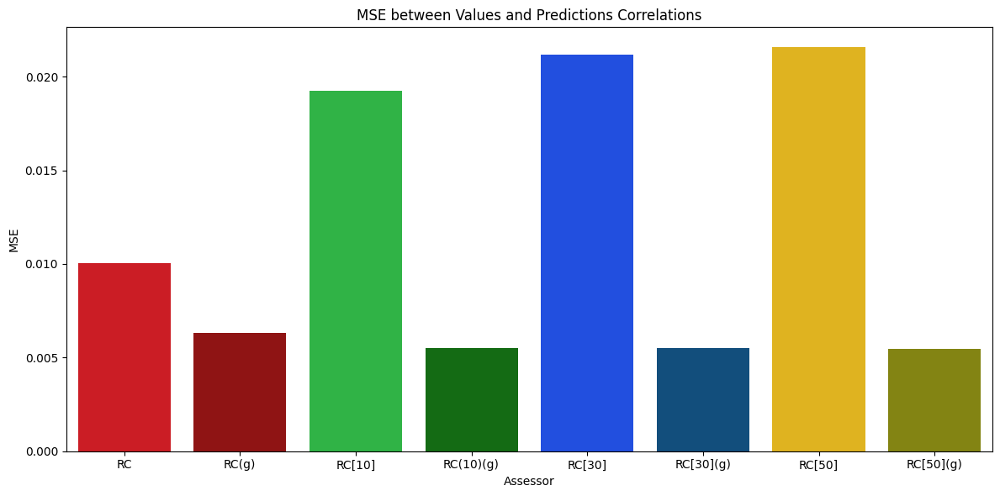

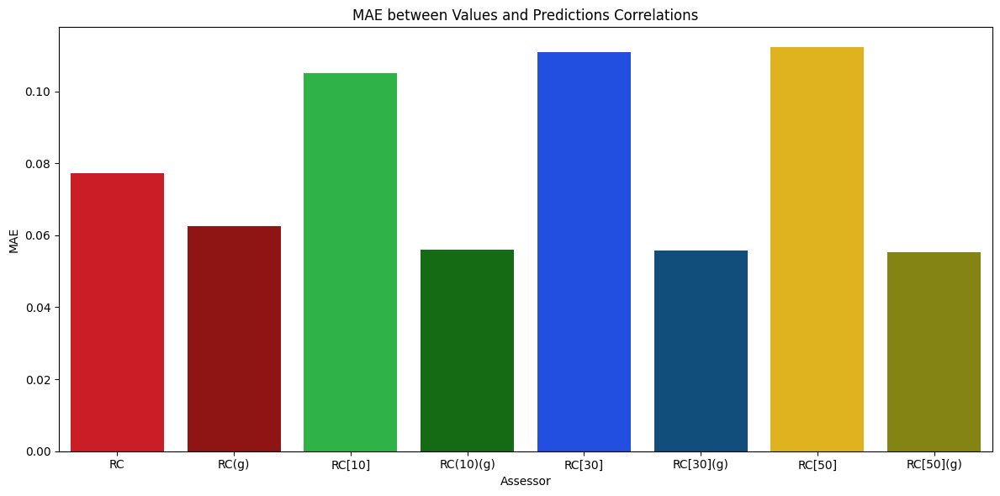

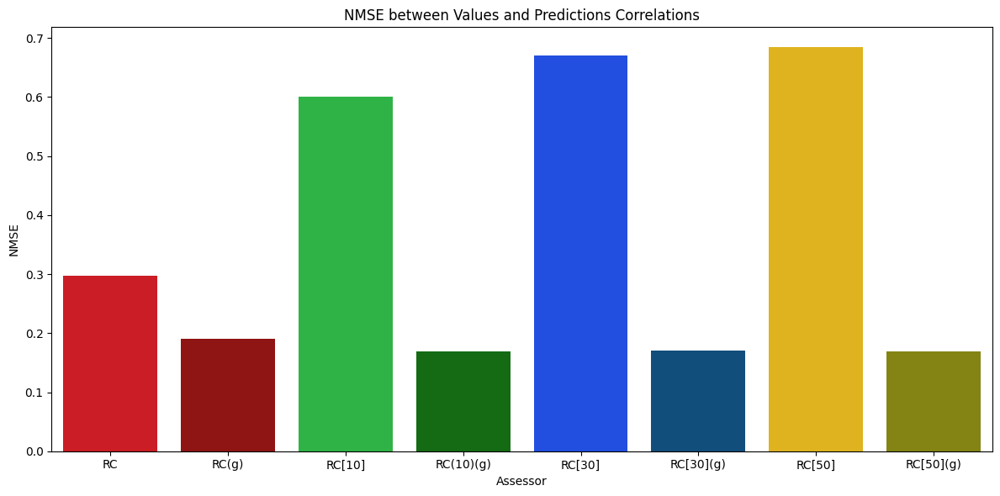

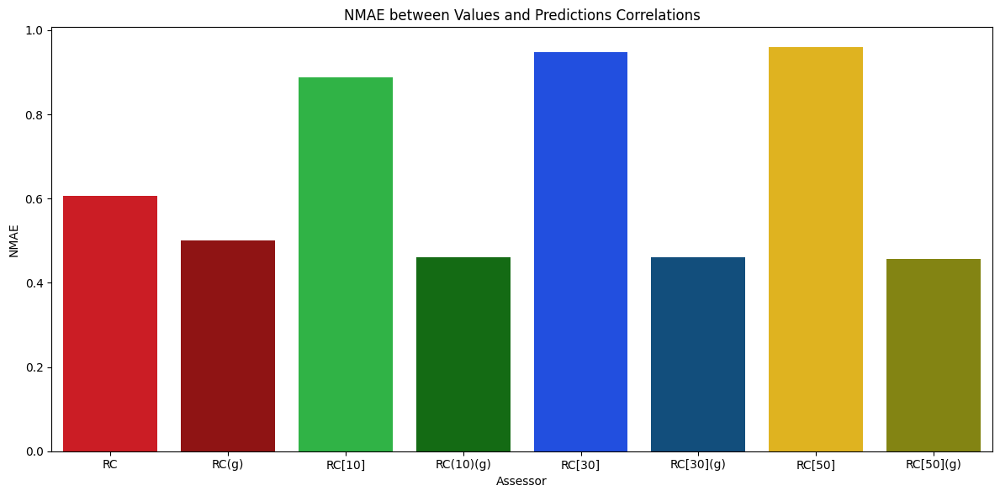

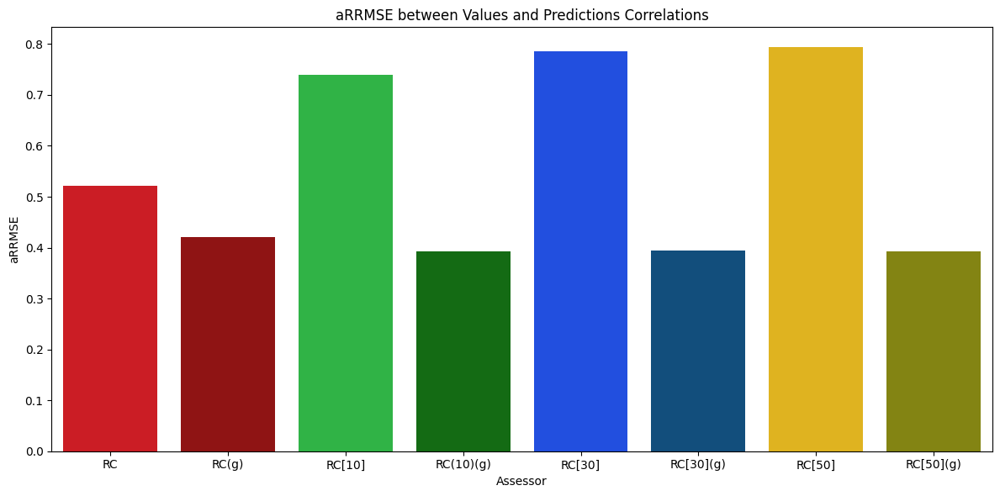

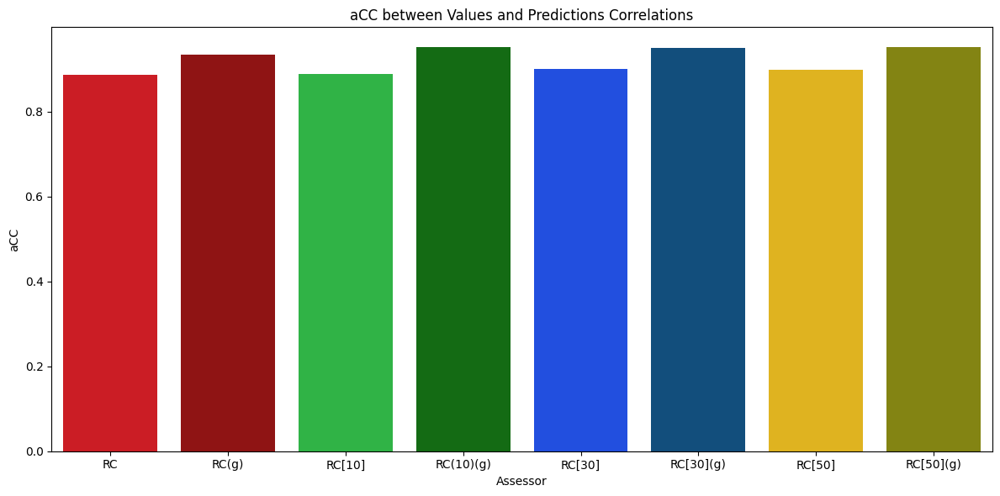

In [239]:
for mt in diff_metrics.columns:
    plt.figure(figsize=(12, 6))
    imgplt = sns.barplot(data=diff_results.loc[:,['Assessor', mt]], x='Assessor', y=mt, hue='Assessor', palette=class_palette)
    plt.title(f"{mt} between Values and Predictions Correlations")
    plt.tight_layout()
    plt.show(imgplt)
    #imgplt.figure.savefig(f'data/{DIR}/imgs/bardiff_{mt.lower()}.eps', format='eps', dpi=300)

---

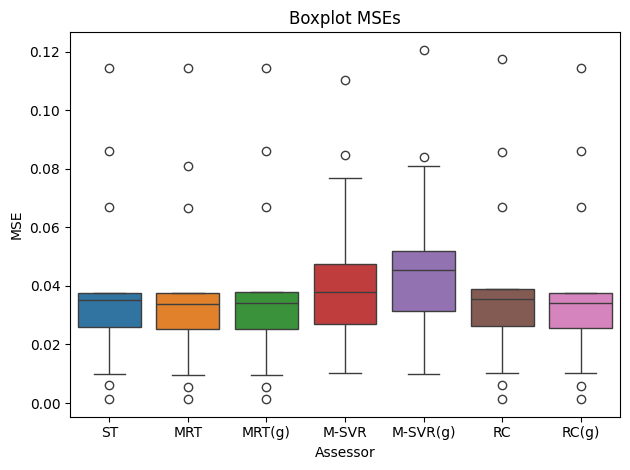

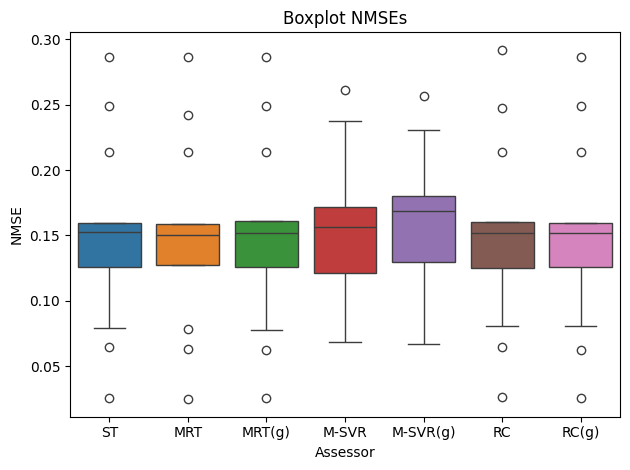

C:\Users\pedro\AppData\Local\Temp\ipykernel_16472\1332952985.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = temp.replace(dicio)


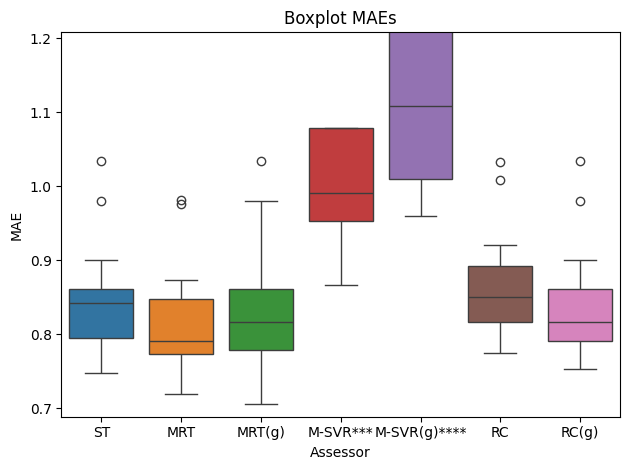

C:\Users\pedro\AppData\Local\Temp\ipykernel_16472\1332952985.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = temp.replace(dicio)


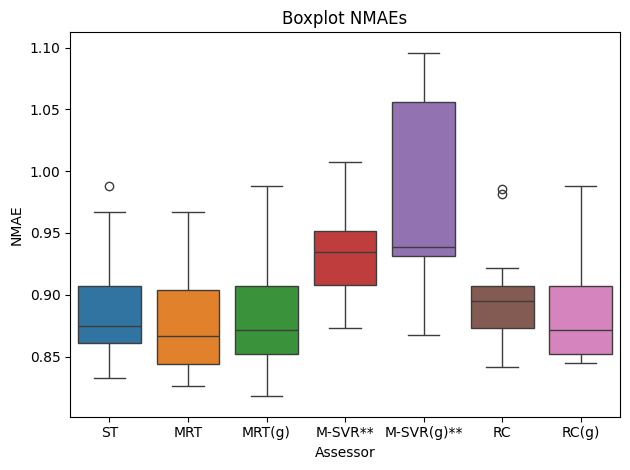

C:\Users\pedro\AppData\Local\Temp\ipykernel_16472\1332952985.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = temp.replace(dicio)


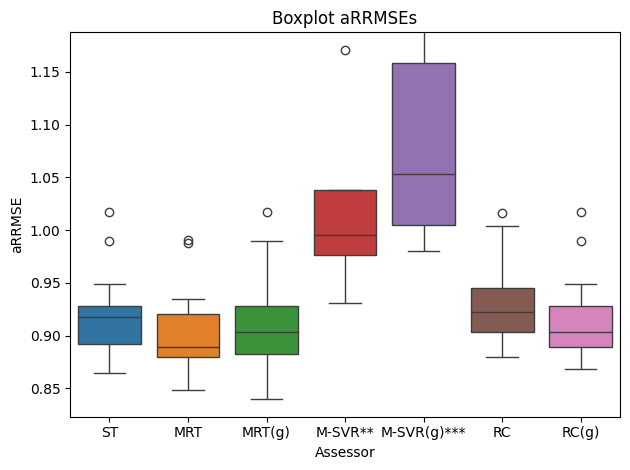

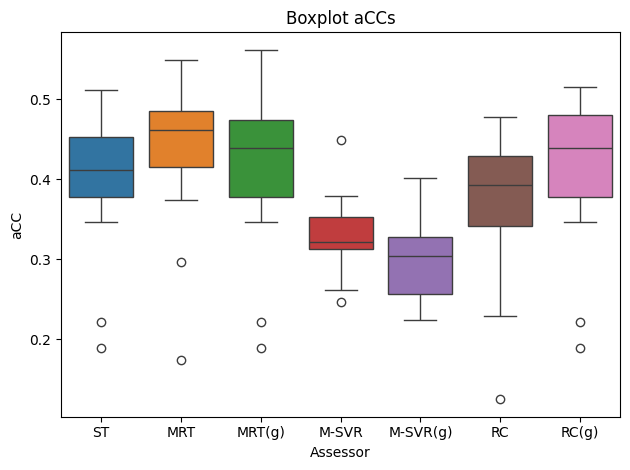

In [58]:
#temp = results_df.drop(index=results_df[results_df['Assessor'].str.contains('M-SVR')].index) #.copy()

for mt in ['MSE', 'NMSE', 'MAE', 'NMAE', 'aRRMSE', 'aCC']:
    plt.title(f'Boxplot {mt}s')
    temp = results_df.loc[:,['Assessor','Model',mt]].copy()
    if((temp[mt] > 1.2).any()):
        dicio = {}
        for a in temp['Assessor'].unique():
            out_limits = (temp.loc[temp["Assessor"]==a,mt]>1.2).sum()
            if(out_limits > 0):
                dicio[a] = a + "*"*out_limits
        temp = temp.replace(dicio)
        plt.ylim(bottom=temp[mt].min()-0.017,top=temp.loc[temp[mt]<1.2,mt].max()+0.017)
    imgplt = sns.boxplot(temp, y=mt, x='Assessor', hue='Assessor', palette=class_palette)
    plt.tight_layout()
    plt.show(imgplt)
    imgplt.figure.savefig(f'data/{DIR}/imgs/bp_{mt.lower()}.eps', format='eps', dpi=300)

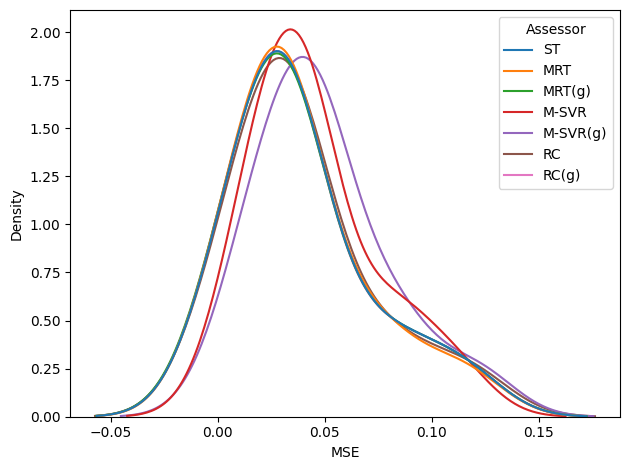

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


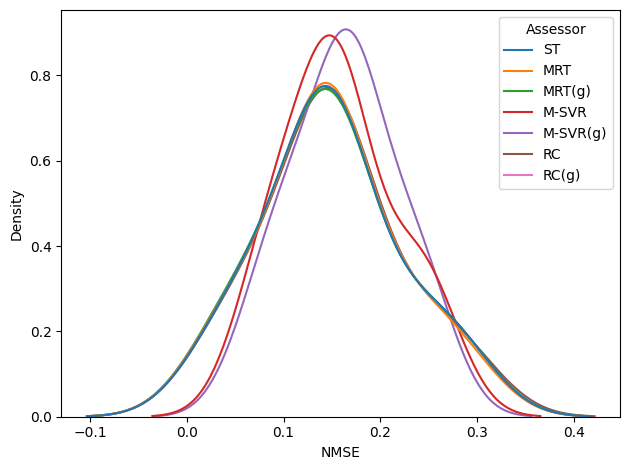

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
C:\Users\pedro\AppData\Local\Temp\ipykernel_16472\1270300147.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = temp.replace(dicio)


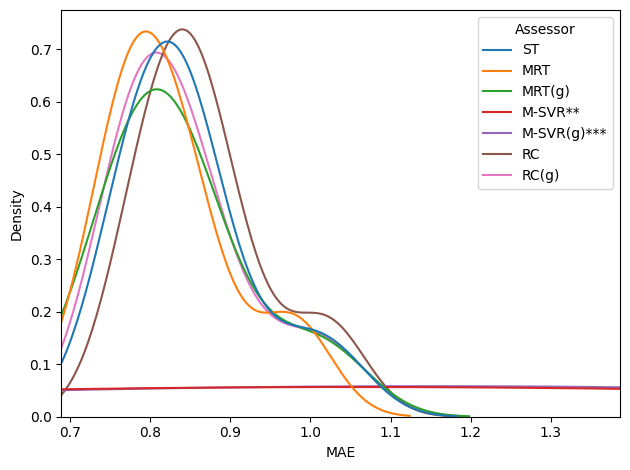

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
C:\Users\pedro\AppData\Local\Temp\ipykernel_16472\1270300147.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = temp.replace(dicio)


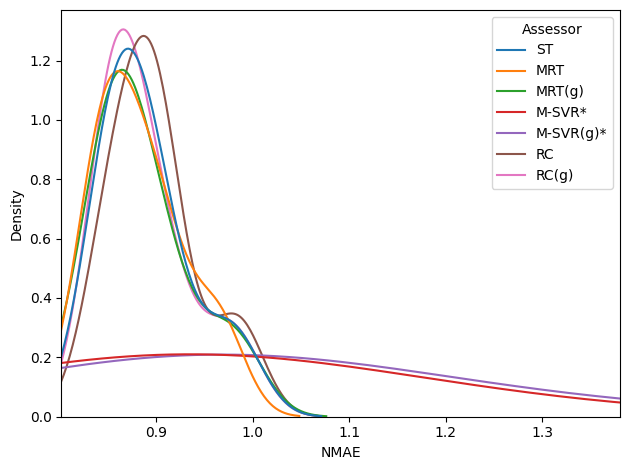

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
C:\Users\pedro\AppData\Local\Temp\ipykernel_16472\1270300147.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = temp.replace(dicio)


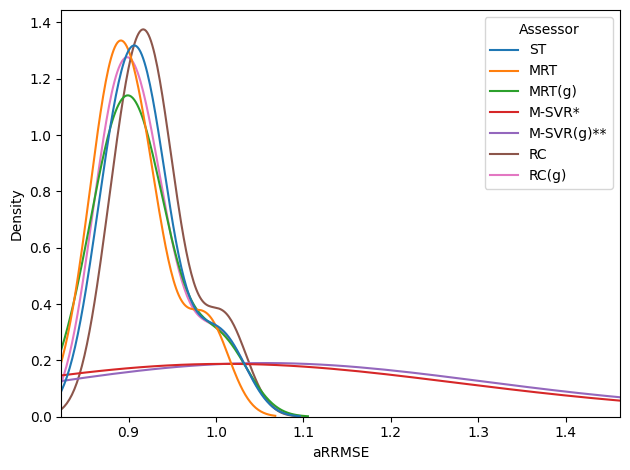

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


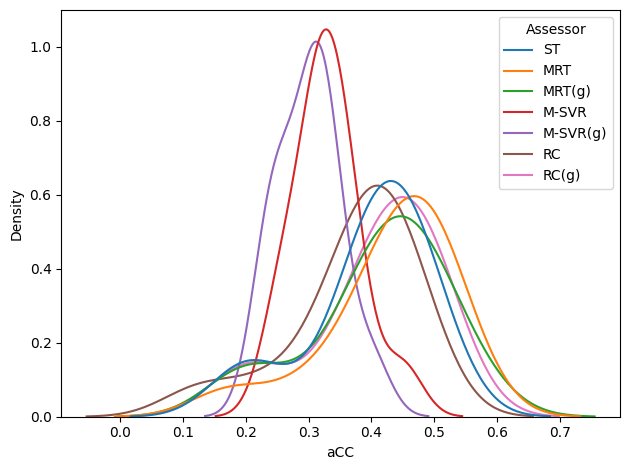

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [59]:
for mt in ['MSE', 'NMSE', 'MAE', 'NMAE', 'aRRMSE', 'aCC']:
    temp = results_df.loc[:,['Assessor','Model',mt]].copy()
    if((temp[mt] > 1.5).any()):
        dicio = {}
        for a in temp['Assessor'].unique():
            out_limits = (temp.loc[temp["Assessor"]==a,mt]>1.5).sum()
            if(out_limits > 0):
                dicio[a] = a + "*"*out_limits
        temp = temp.replace(dicio)
        plt.xlim(temp[mt].min()-0.017,temp.loc[temp[mt]<1.5,mt].max()+0.017)
    imgplt = sns.kdeplot(temp, x=mt, hue='Assessor', palette=class_palette)
    plt.tight_layout()
    plt.show(imgplt)
    imgplt.figure.savefig(f'data/{DIR}/imgs/kde_{mt.lower()}.eps', format='eps', dpi=300)

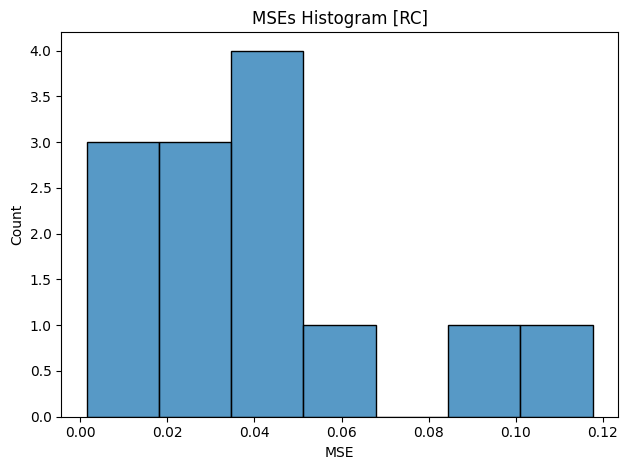

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


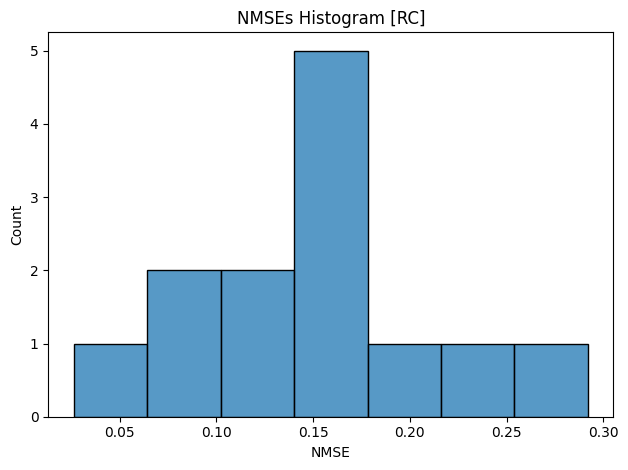

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


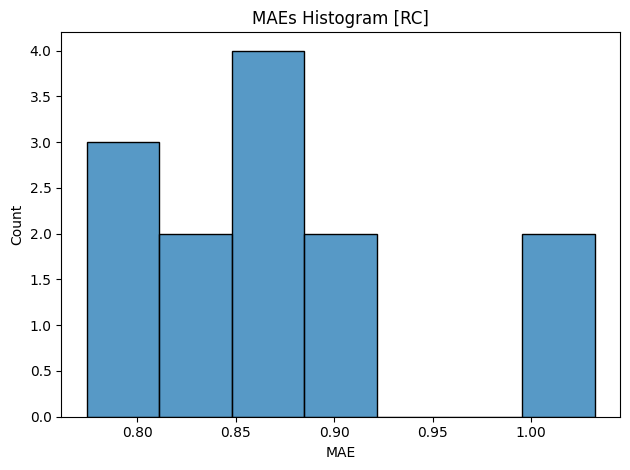

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


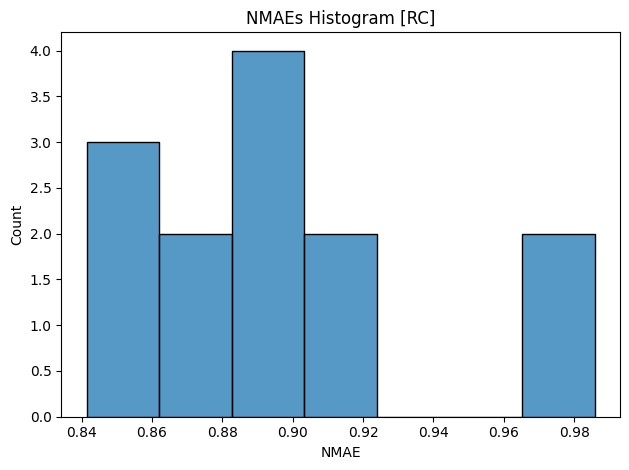

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


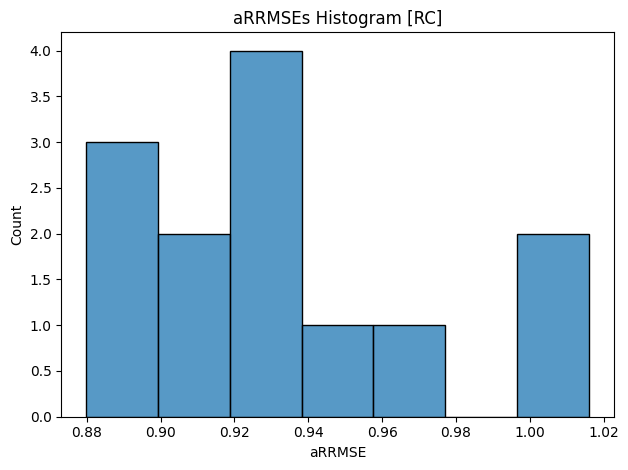

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


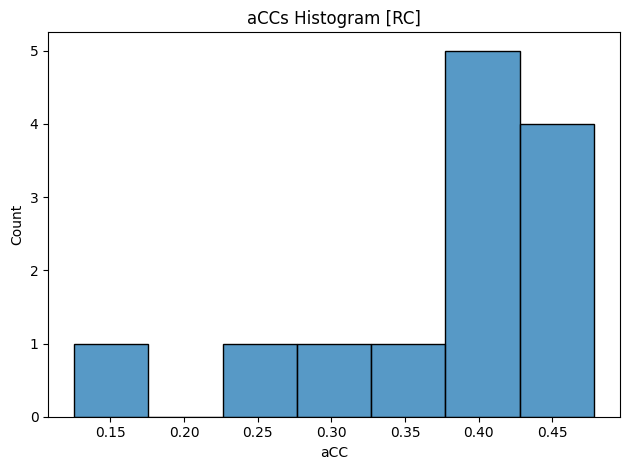

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


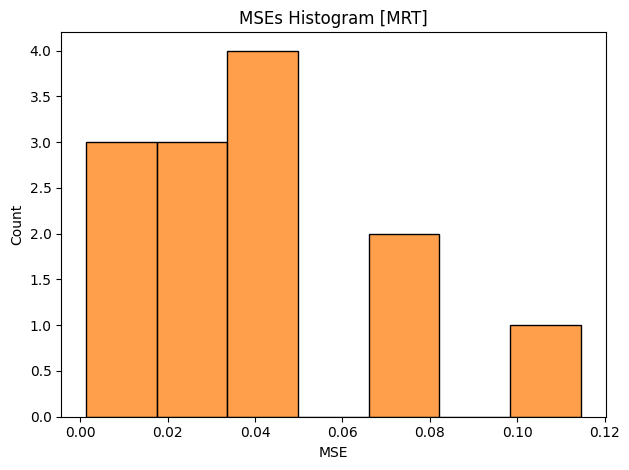

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


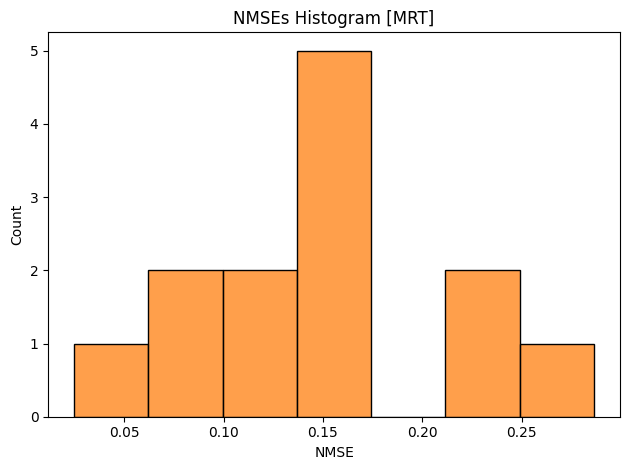

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


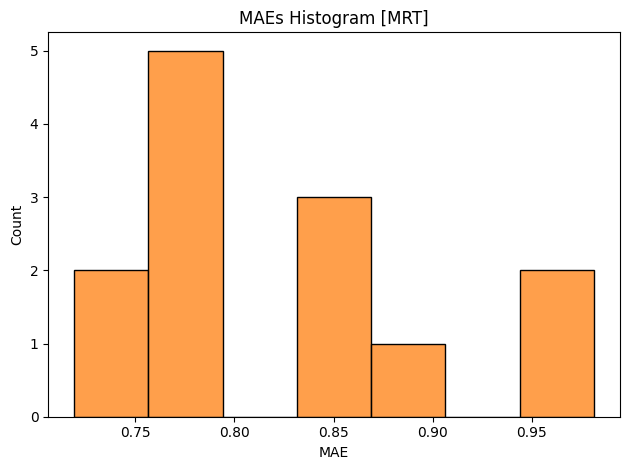

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


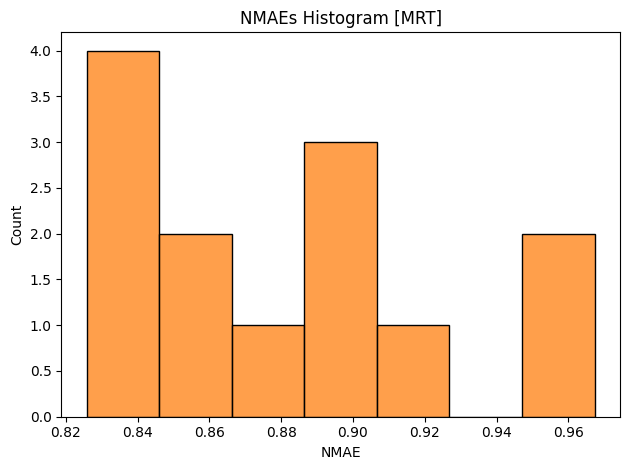

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


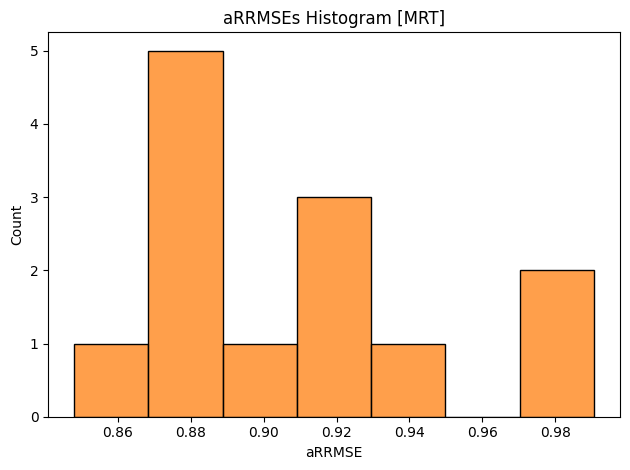

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


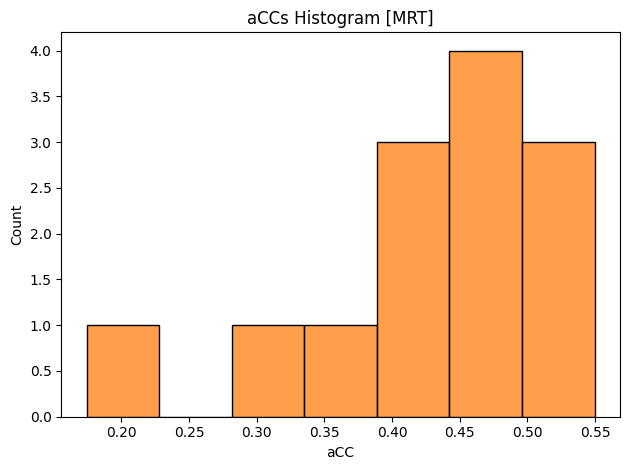

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


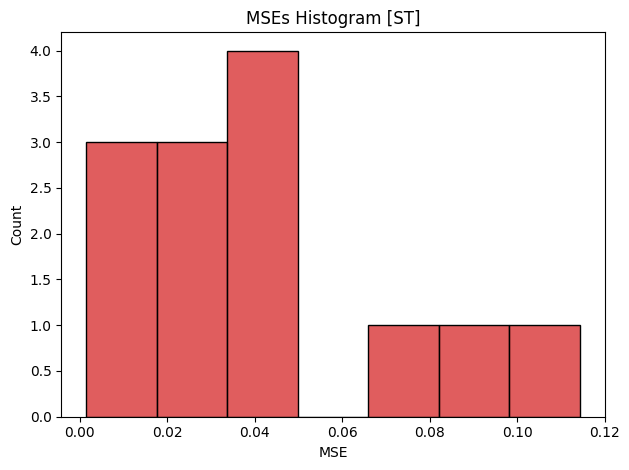

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


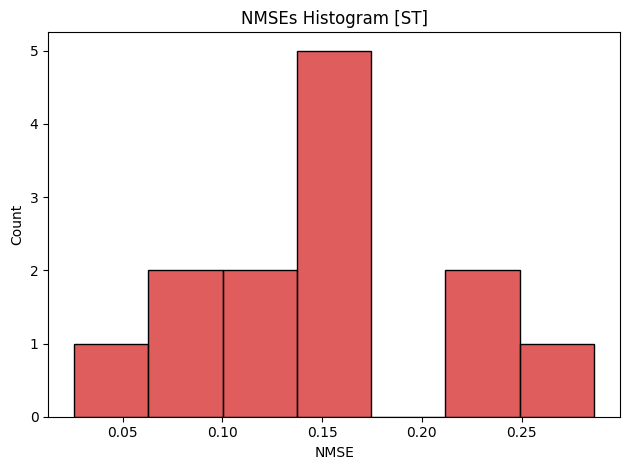

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


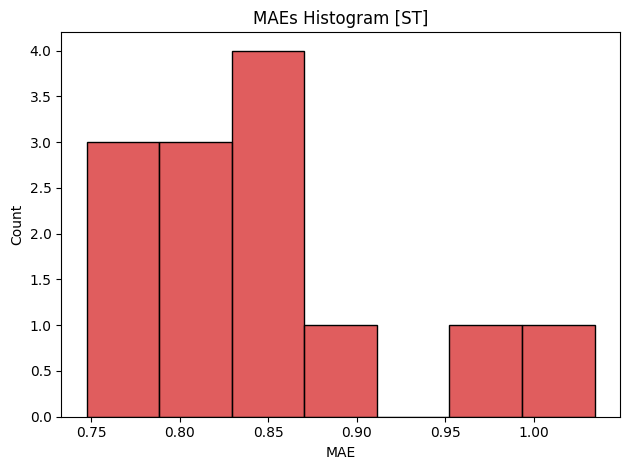

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


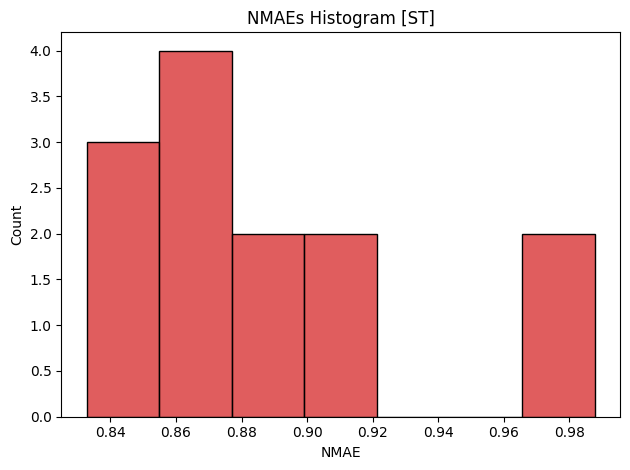

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


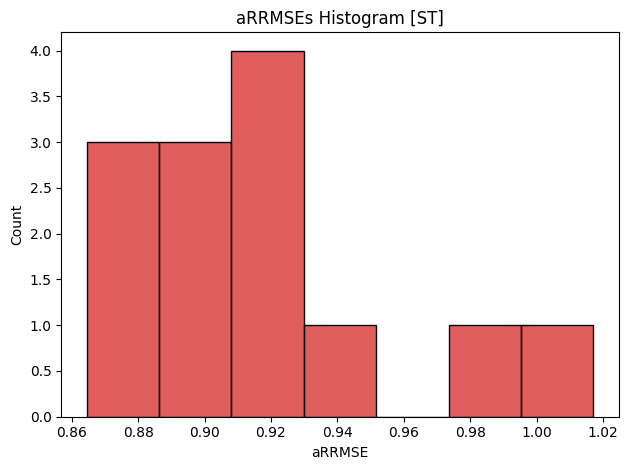

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


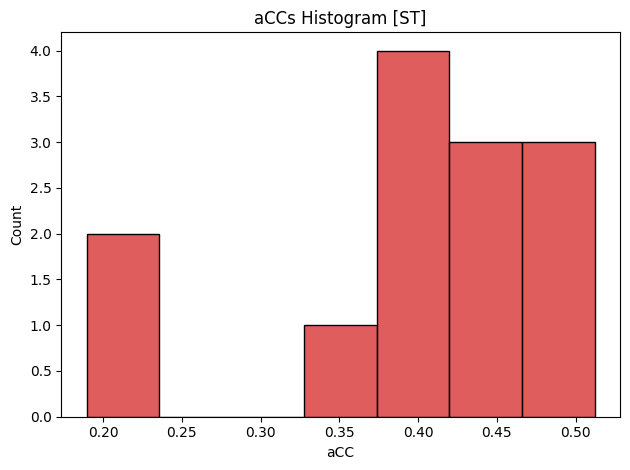

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


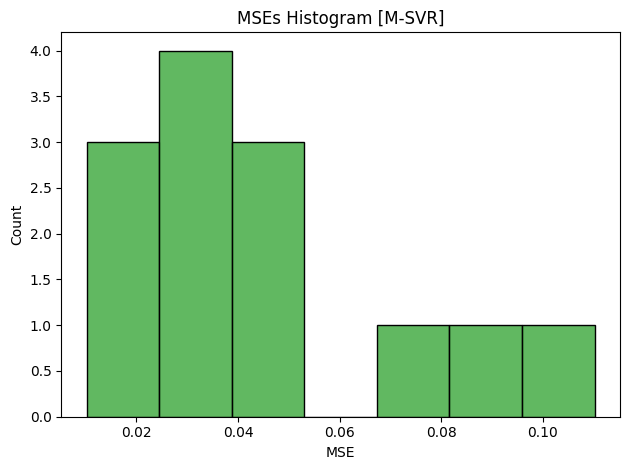

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


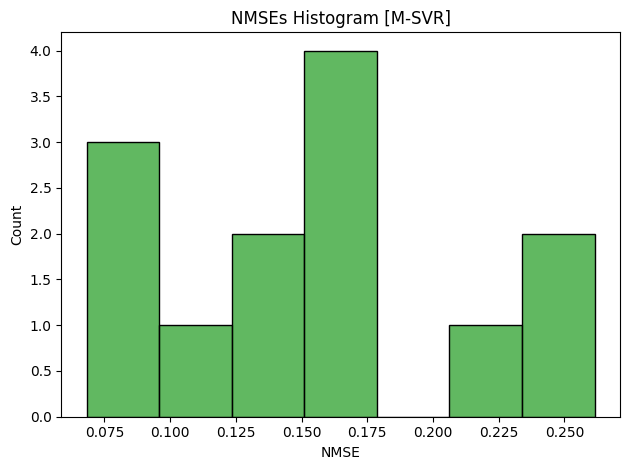

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


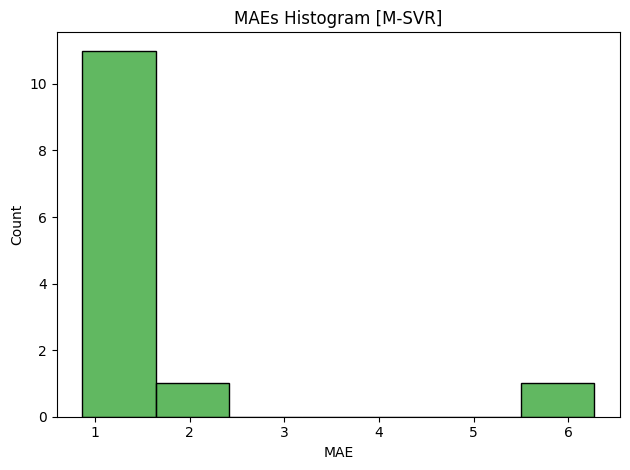

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


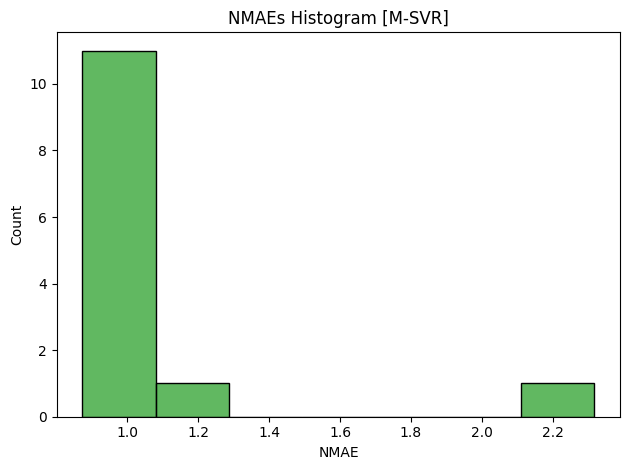

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


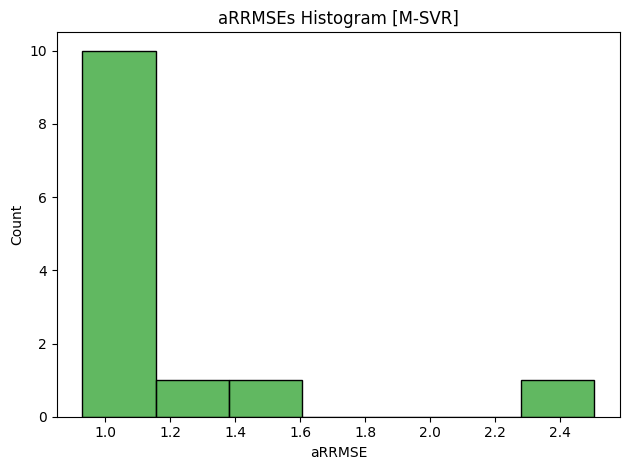

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


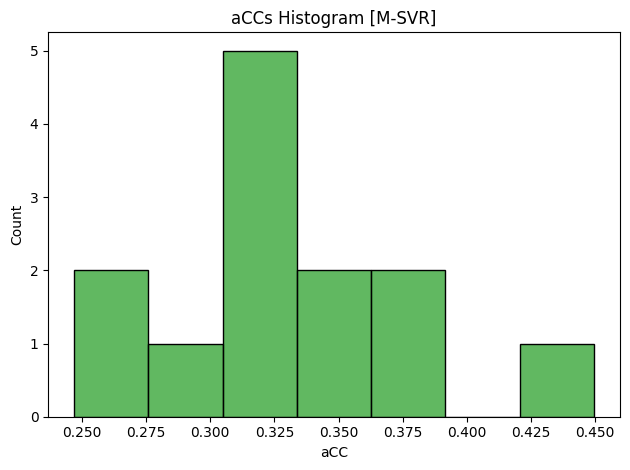

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


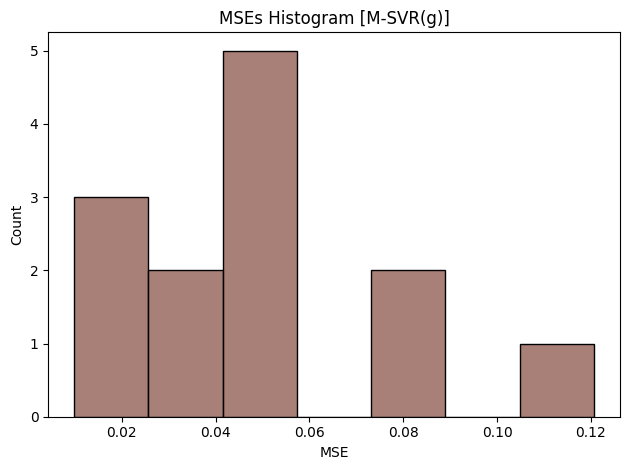

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


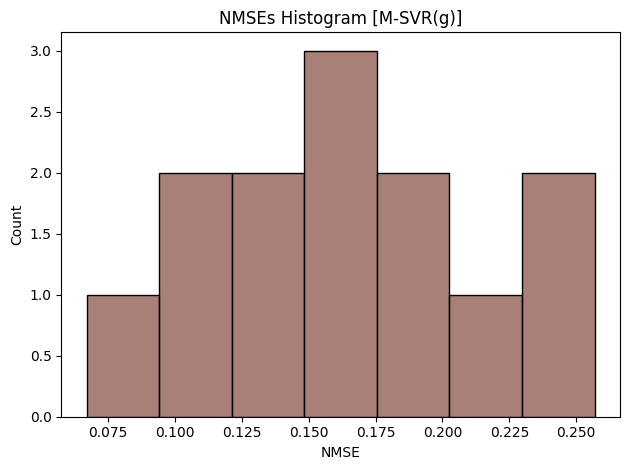

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


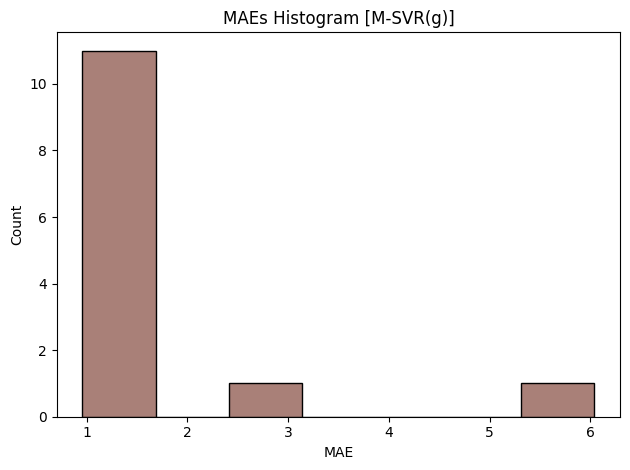

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


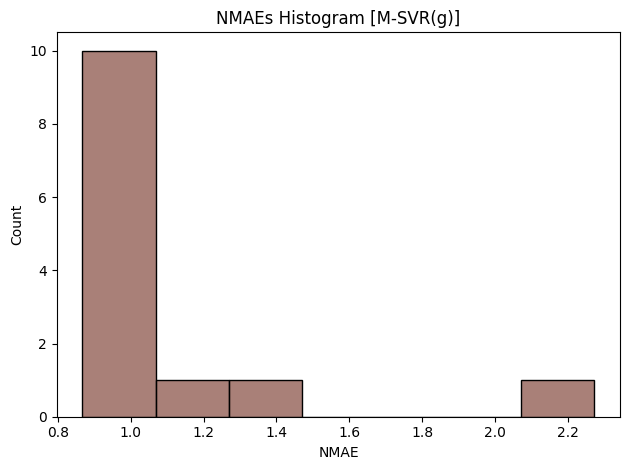

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


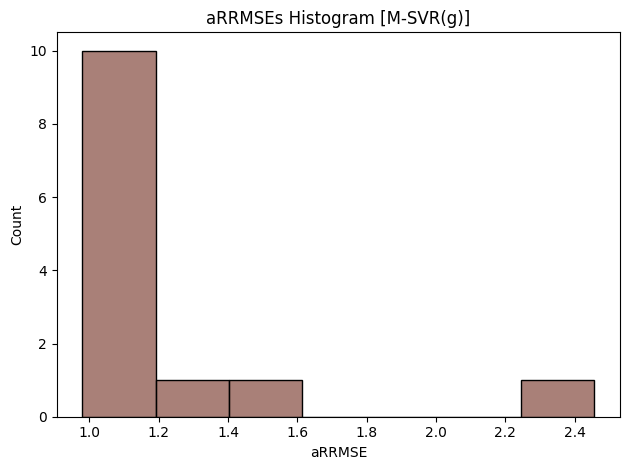

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


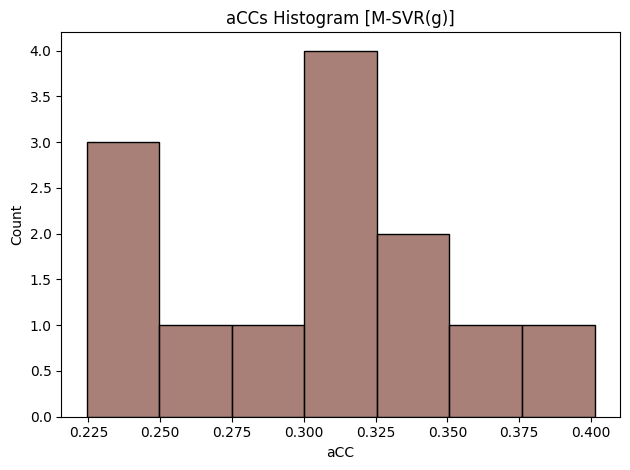

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


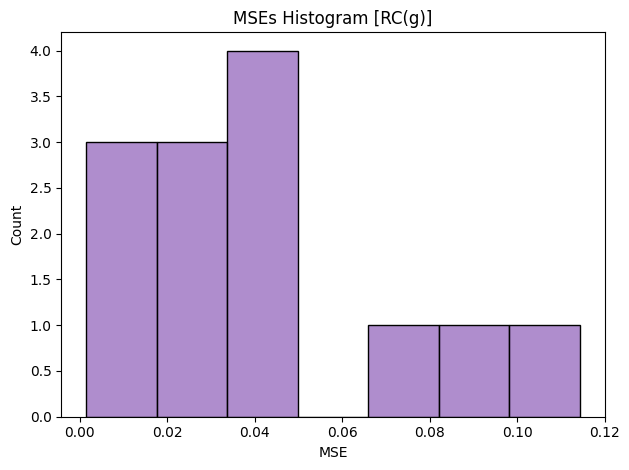

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


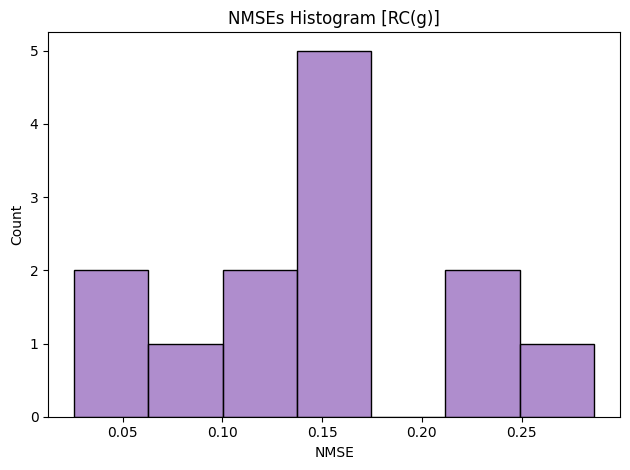

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


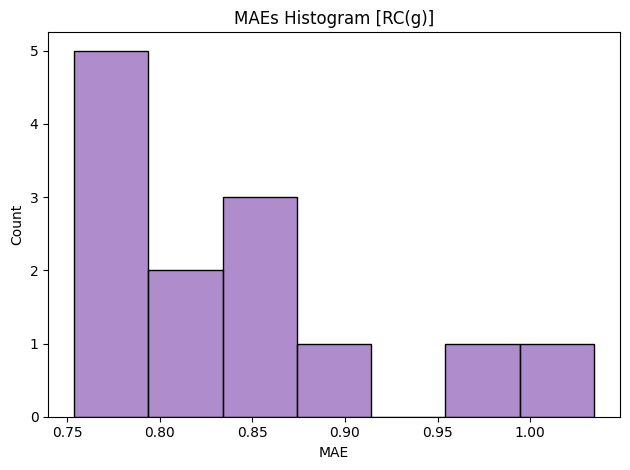

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


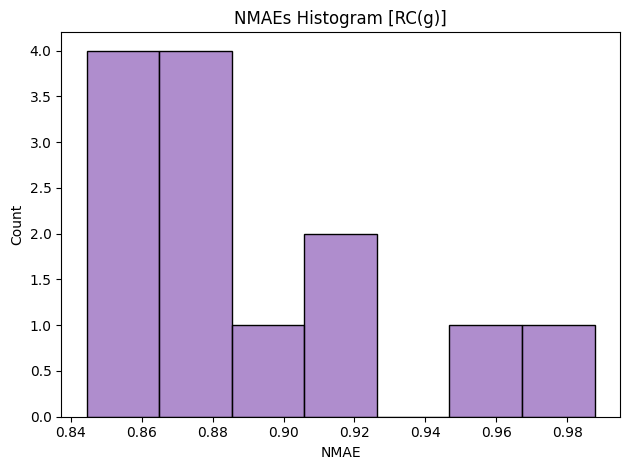

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


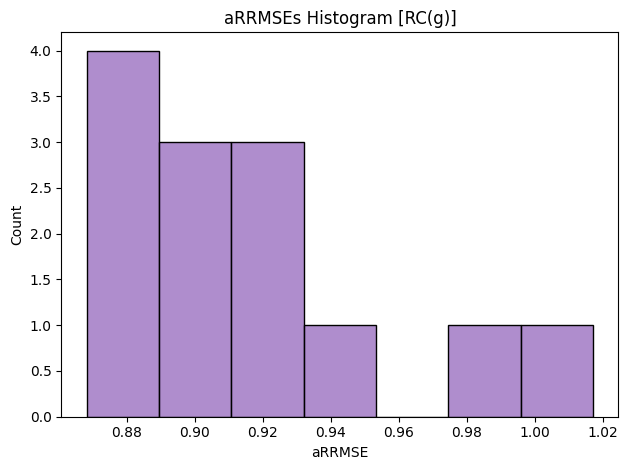

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


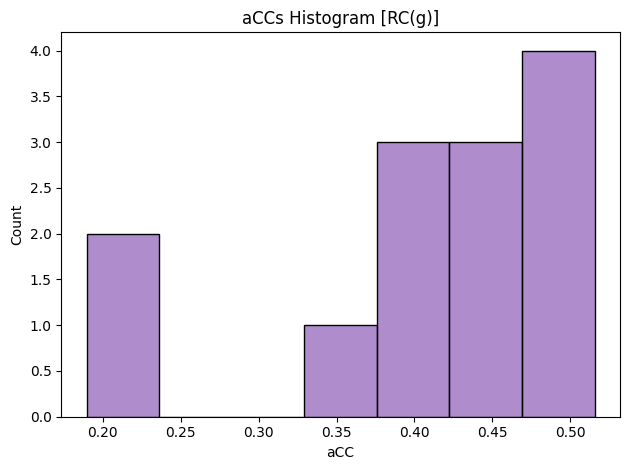

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


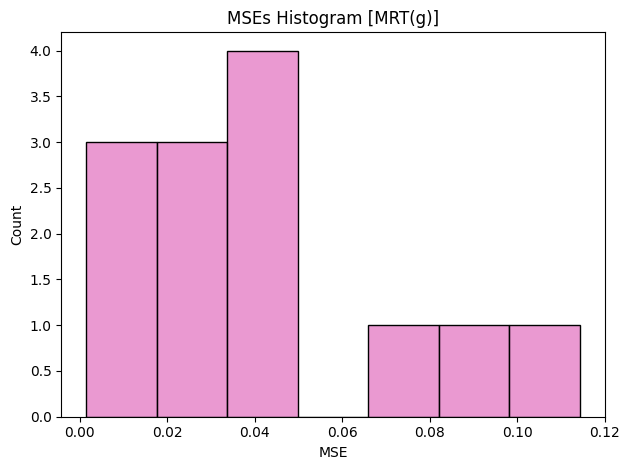

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


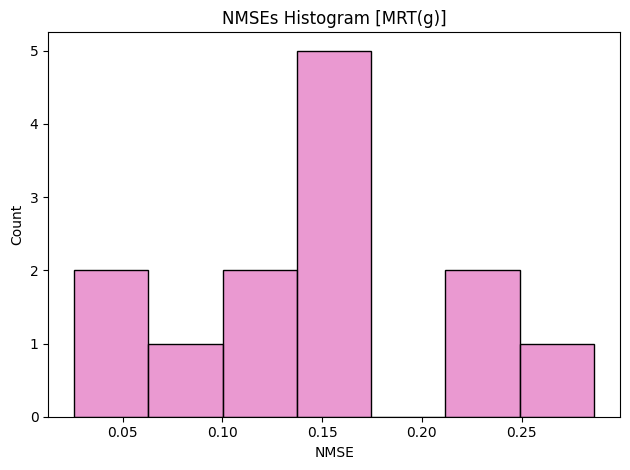

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


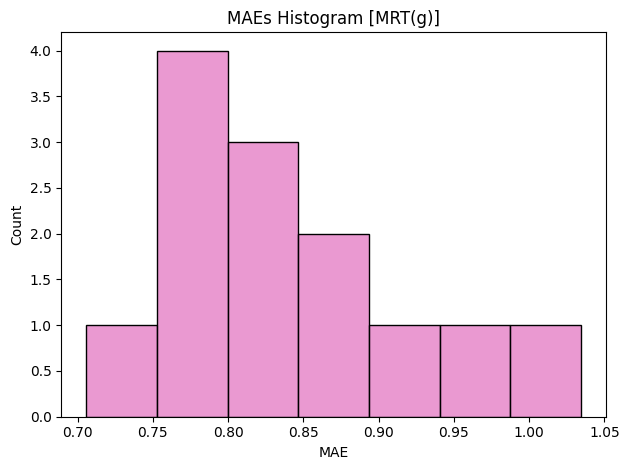

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


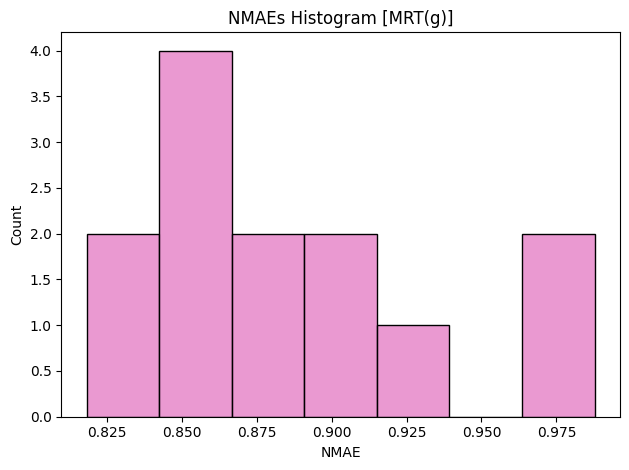

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


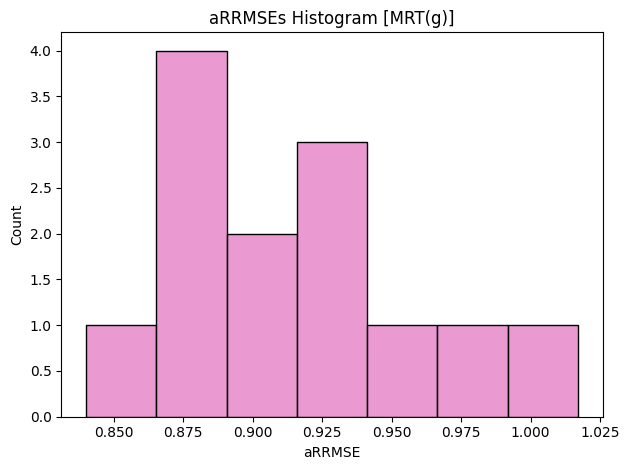

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


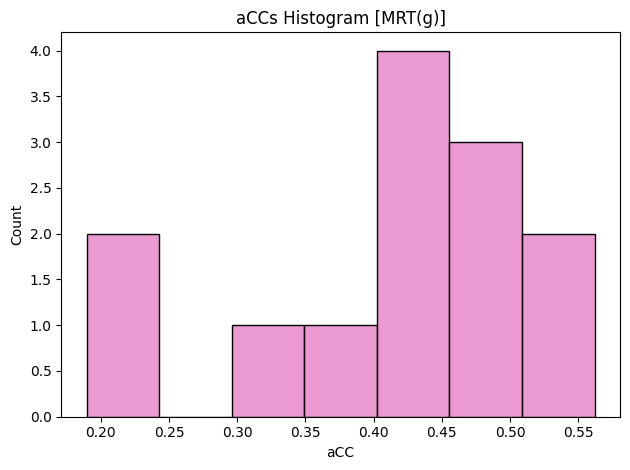

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [60]:
dicio = {'RC': {'color': class_palette[0], 'code': 'RC'},
         'MRT': {'color': class_palette[1], 'code': 'MRT'},
         'ST': {'color': class_palette[3], 'code': 'ST'},
         'M-SVR': {'color': class_palette[2], 'code': 'MSVR'},
         'M-SVR(g)': {'color': class_palette[-2], 'code': 'MSVRG'},
         'RC(g)': {'color': class_palette[-3], 'code': 'RCG'},
         'MRT(g)': {'color': class_palette[-1], 'code': 'MRTG'}}

for a in dicio.keys():
    for mt in ['MSE', 'NMSE', 'MAE', 'NMAE', 'aRRMSE', 'aCC']:
        plt.title(f'{mt}s Histogram [{a}]')
        imgplt = sns.histplot(results_df.loc[results_df['Assessor']==a,['Assessor','Model',mt]], x=mt, bins=7, color=dicio[a]['color'])
        plt.tight_layout()
        plt.show(imgplt)
        imgplt.figure.savefig(f'data/{DIR}/imgs/hg_{dicio[a]["code"]}_{mt.lower()}.eps', format='eps', dpi=300)

In [61]:
results_df

,Assessor,Model,MSE,MAE,NMSE,NMAE,aRRMSE,aCC
0,ST,dtree,0.066898,0.850712,0.213765,0.894977,0.922341,0.412323
1,ST,sgd,0.035082,0.77635,0.152606,0.847468,0.881107,0.476309
2,ST,lr,0.01001,0.747281,0.079003,0.832759,0.864454,0.511993
3,ST,knn,0.030168,0.813318,0.142208,0.865585,0.901842,0.438895
4,ST,svm_linear,0.025841,0.795178,0.129468,0.860798,0.891728,0.452745
...,...,...,...,...,...,...,...,...
86,RC(g),kan,0.114392,0.979948,0.286264,0.966827,0.989923,0.189614
87,RC(g),rforest,0.03503,0.86078,0.153779,0.919298,0.927783,0.378154
88,RC(g),gb,0.085998,1.034548,0.249029,0.987738,1.017127,0.221452
89,RC(g),adab,0.001467,0.900536,0.025751,0.874819,0.948966,0.346271


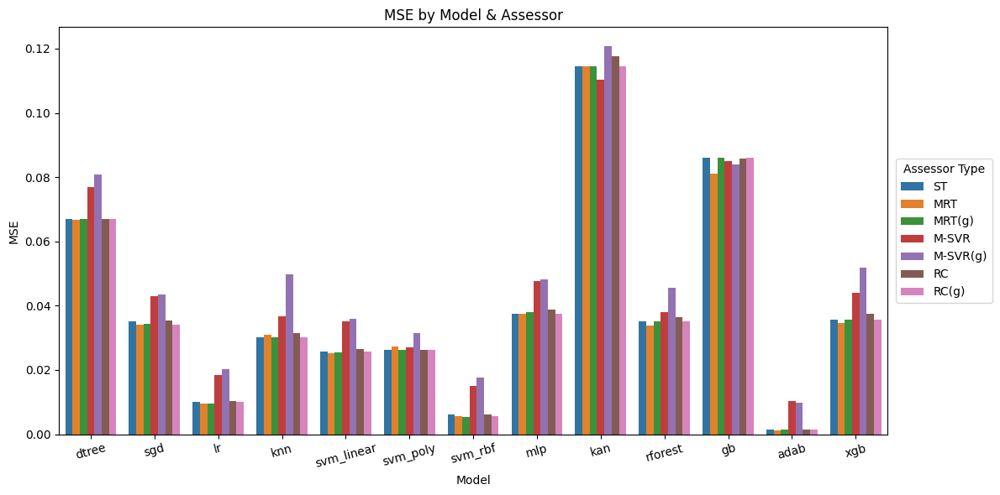

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


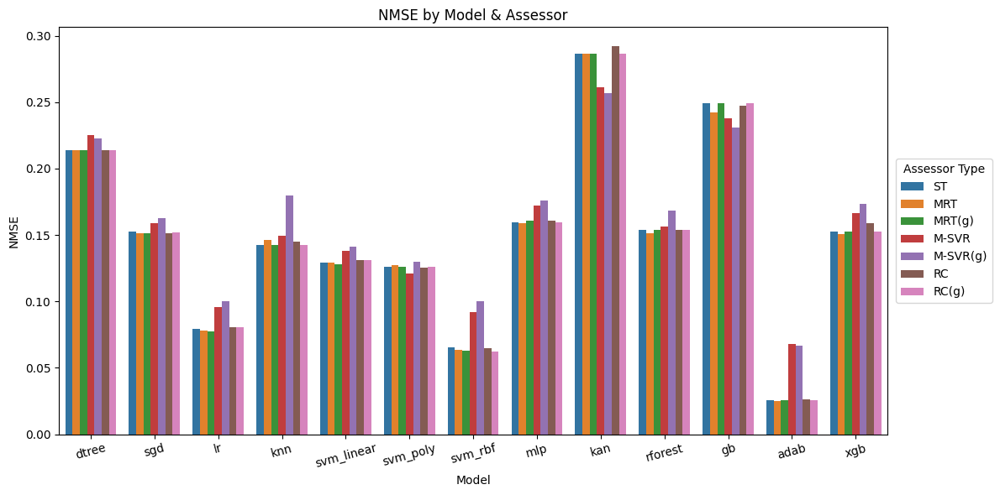

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


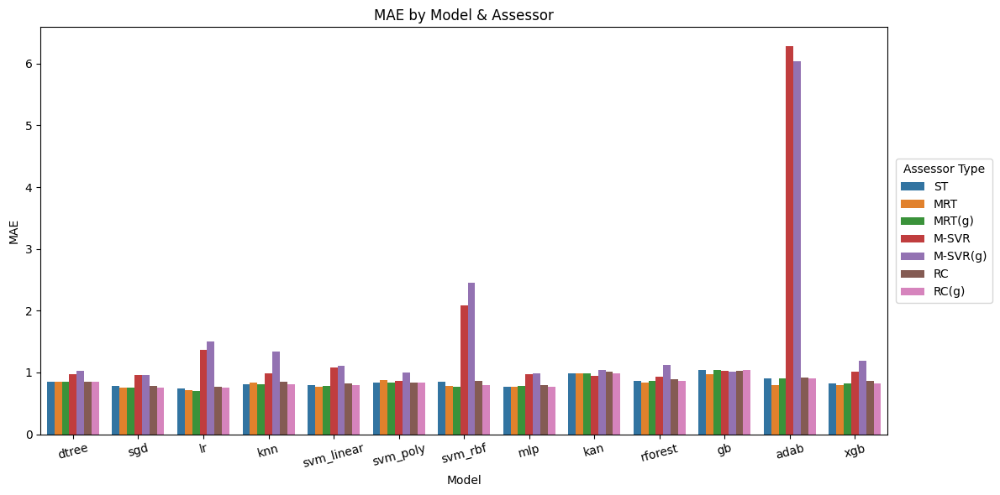

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


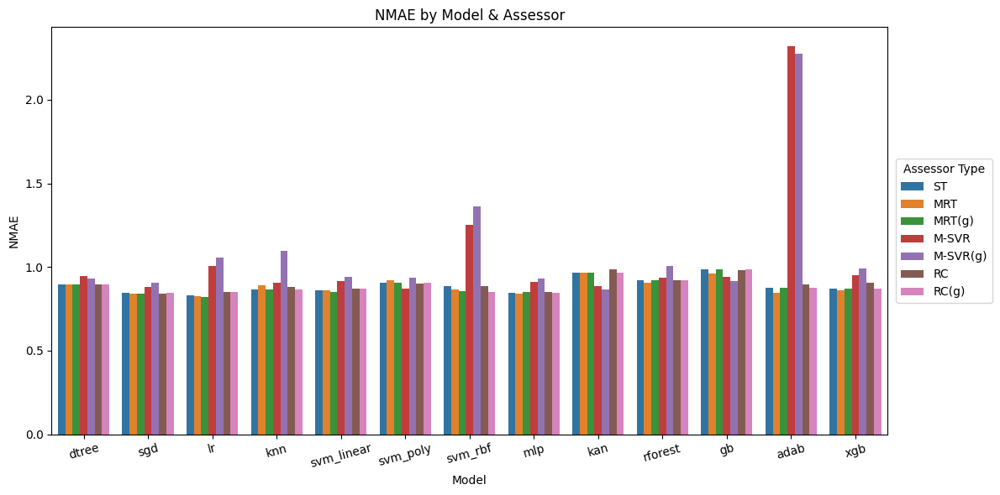

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


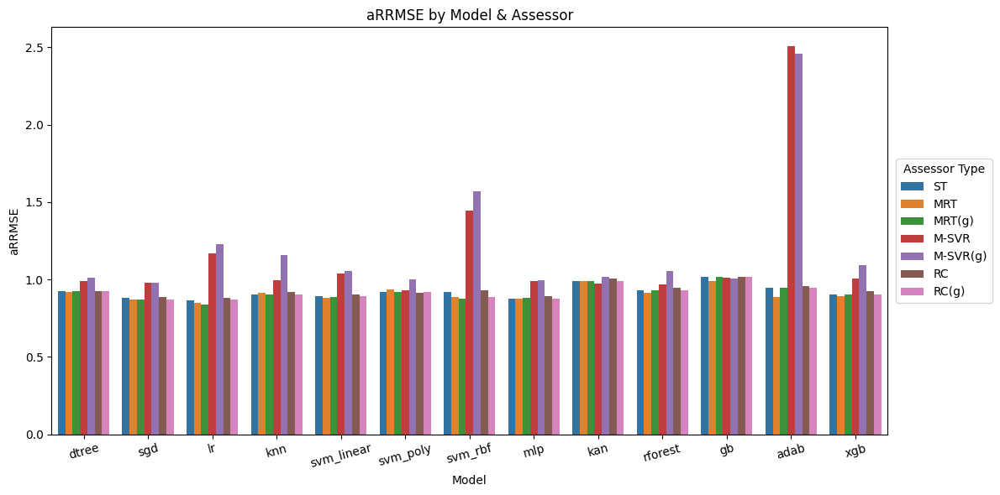

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


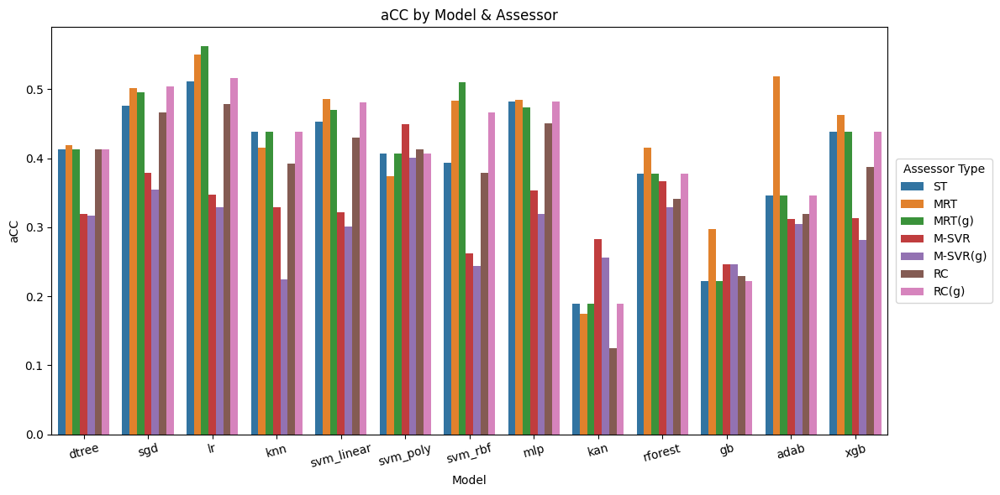

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [62]:
for mt in ['MSE', 'NMSE', 'MAE', 'NMAE', 'aRRMSE', 'aCC']:
    plt.figure(figsize=(12, 6))
    imgplt = sns.barplot(data=results_df, x='Model', y=mt, hue='Assessor', palette=class_palette)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left', borderaxespad=0, title='Assessor Type')
    plt.title(f'{mt} by Model & Assessor')
    plt.xticks(rotation=15)
    plt.tight_layout()
    plt.show(imgplt)
    imgplt.figure.savefig(f'data/{DIR}/imgs/bar_{mt.lower()}.eps', format='eps', dpi=300)

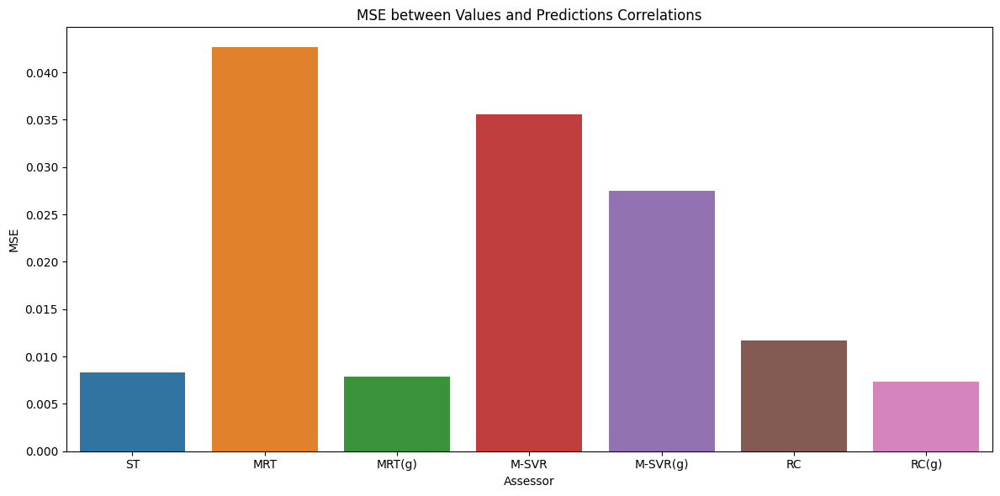

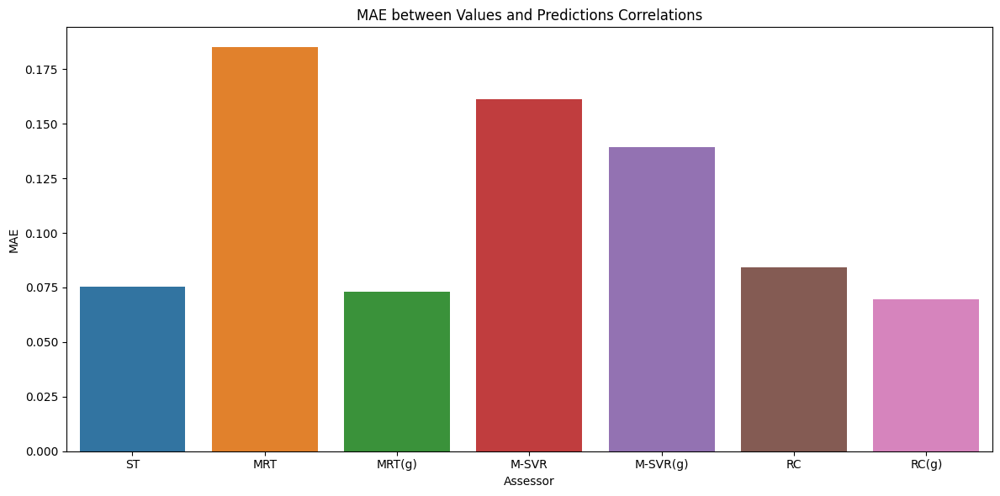

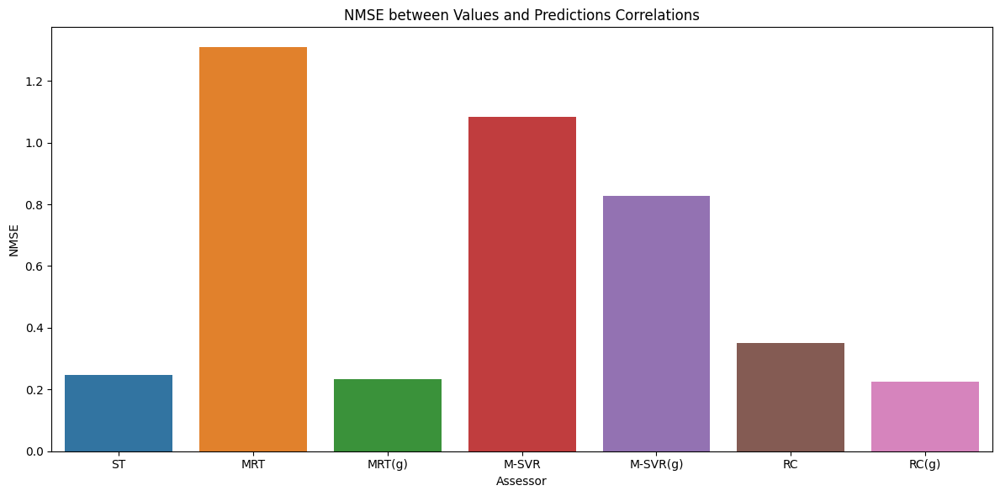

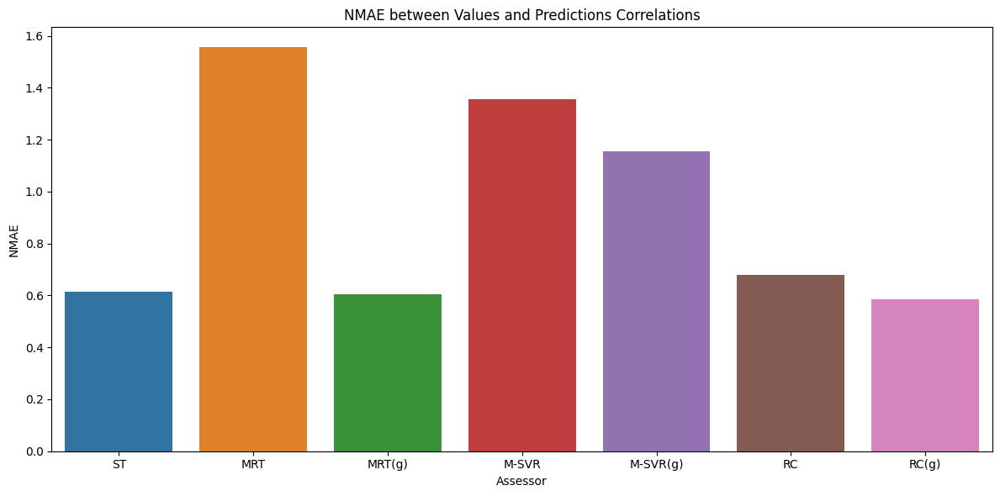

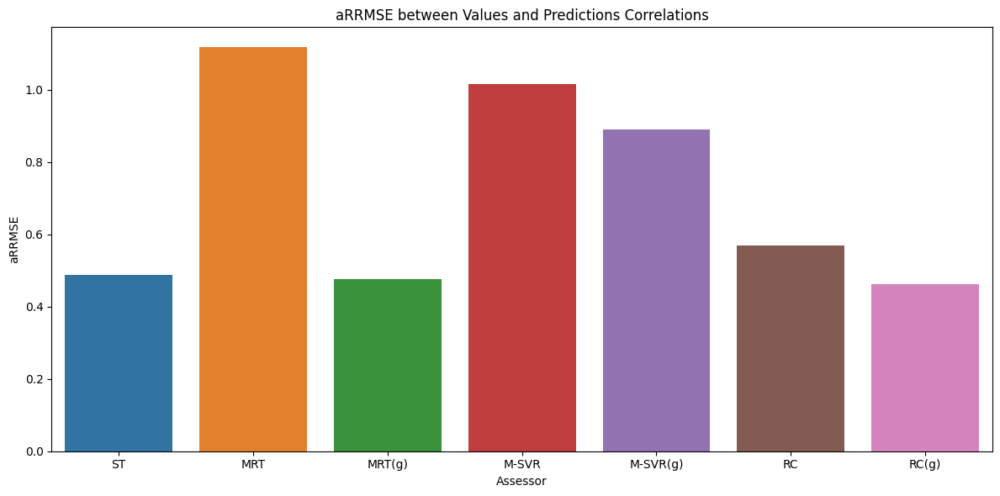

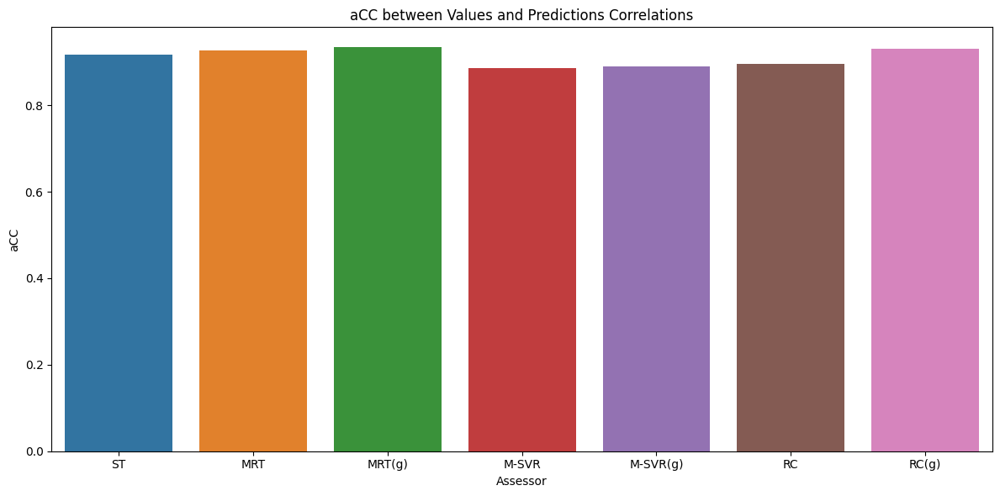

In [63]:
for mt in diff_metrics.columns:
    plt.figure(figsize=(12, 6))
    imgplt = sns.barplot(data=diff_results.loc[:,['Assessor', mt]], x='Assessor', y=mt, hue='Assessor', palette=class_palette)
    plt.title(f"{mt} between Values and Predictions Correlations")
    plt.tight_layout()
    plt.show(imgplt)
    imgplt.figure.savefig(f'data/{DIR}/imgs/bardiff_{mt.lower()}.eps', format='eps', dpi=300)